In [1]:
import scipy.optimize as op
import numpy as np
import matplotlib.pyplot as plt

def montrer_les_rho(nu_tilde) :
    
    plt.plot ( lam_discr_tilde , nu_tilde , label = "$\\tilde{\\nu}$")

    ## 1 
    Mat_F_1 = np.eye(lam_discr_tilde.shape[0]  ) - 1/(2*np.pi) * dlam/gbar * np.dot ( np.diag ( nu_tilde ) , K_mat_tilde )
    B = 1/(2*np.pi) *  nu_tilde 
    rho_tilde_1 = np.linalg.solve(Mat_F_1, B)
    rho_s_tilde_1 = rho_tilde_1/nu_tilde 

    ## 2 
    Mat_F_1 = np.eye(lam_discr_tilde.shape[0]  ) - 1/(2*np.pi) * dlam/gbar * np.dot ( K_mat_tilde , np.diag ( nu_tilde )  )
    B = 1/(2*np.pi) *  np.full ( lam_discr_tilde.shape[0] , 1  )
    rho_s_tilde_2 = np.linalg.solve(Mat_F_1, B)
    rho_tilde_2 = nu_tilde*rho_s_tilde_2

    plt.plot ( lam_discr_tilde , rho_s_tilde_1 , label = 'Meth 1 : $\\tilde{\\rho_s}$ ')
    plt.plot ( lam_discr_tilde , rho_tilde_1  , label = 'Meth 1 : $\\tilde{\\rho}$')
    plt.plot ( lam_discr_tilde , rho_s_tilde_2 , label = 'Meth 2 : $\\tilde{\\rho_s}$ ')
    plt.plot ( lam_discr_tilde , rho_tilde_2  , label = 'Meth 2 : $\\tilde{\\rho}$')

    plt.legend()
    plt.xlabel("$\\tilde{\\theta}$")
    plt.show()

    plt.plot ( lam_discr_tilde , rho_s_tilde_1 -  rho_s_tilde_2  , label = '$ \\Delta \\tilde{\\rho_s}$ ')
    plt.plot ( lam_discr_tilde , rho_tilde_1  -  rho_tilde_2    , label = '$\\Delta \\tilde{\\rho}$')

    plt.legend()
    plt.xlabel("$\\tilde{\\theta}$")
    plt.show()

#

In [87]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt

def check_condition(condition, x):
    if isinstance(condition, str):
        # Vérifier si la condition commence par '<'
        if condition.startswith("<"):
            limit = int(condition[1:])  # Extraire la valeur après "<"
            return x < limit  # Retourne True si x est inférieur à la limite
        # Vérifier si la condition commence par '>'
        elif condition.startswith(">"):
            limit = int(condition[1:])  # Extraire la valeur après ">"
            return x > limit  # Retourne True si x est supérieur à la limite
        # Vérifier si la condition est de la forme "[min, max]"
        elif condition[0] == "[" and condition[-1] == "]":
            bounds = condition[1:-1].split(",")  # Séparer par la virgule
            lower = int(bounds[0].strip())  # Extraire et parser le premier nombre
            upper = int(bounds[1].strip())  # Extraire et parser le deuxième nombre
            return lower <= x <= upper  # Retourne True si x est dans l'intervalle
        else:
            raise ValueError("Format de chaîne invalide")
    elif isinstance(condition, (int, float)):  # Si la condition est un int ou float
        return x == condition  # Comparer directement x avec la condition
    else:
        raise ValueError("Condition doit être une chaîne de caractères ou un nombre (int ou float)")

def extract_triples(date, nom, mup=None, T=None, x0=None ,Taille=None):
    triples = {}  # Utiliser un ensemble pour éviter les doublons
    
    # Parcourir les fichiers dans le répertoire spécifié par date
    for filename in os.listdir(date):
        # Vérifier si le nom du fichier correspond au format attendu
        if nom ==  "theta_edge_1.0_ih1" :
            match = re.match(rf"density_expansion_nu_{re.escape(nom)}_([\d.]+)_([\d.]+)\_veff_bord.npz", filename)
            if match:
                file_mup = float(match.group(1))
                file_T = float(match.group(2))
                # Vérifier si les valeurs correspondent aux critères spécifiés
                
                if (mup is None or check_condition(mup, file_mup)) and (T is None or check_condition(T, file_T)):
                    triples[(file_mup, file_T)] = extract_t_times_Taille(date, nom, (file_mup, file_T))
        elif nom == "theta_edge_1.0_ih2" :
            match = re.match(rf"density_expansion_nu_{re.escape(nom)}_([\d.]+)_([\d.]+)_([\d.]+)_([\d.]+)_([\d.]+)\.npz", filename)
            if match:
                file_mup = float(match.group(1))
                file_T = float(match.group(2))
                file_x0 = float(match.group(3))
                file_Taille = float(match.group(4))
                # Vérifier si les valeurs correspondent aux critères spécifiés
                if (mup is None or check_condition(mup, file_mup)) and (T is None or check_condition(T, file_T)) and (x0 is None or check_condition(x0, file_x0)) and (Taille is None or check_condition(Taille, file_Taille)):
                    triples[(file_mup, file_T,file_x0, file_Taille)] = extract_t_times_Taille(date, nom, (file_mup, file_T,file_x0, file_Taille))
    
    return triples

def extract_triples(date, nom, mup=None, T=None, x0=None, Taille=None):
    triples = {}  # Utiliser un dictionnaire pour stocker les résultats
    
    # Parcourir les fichiers dans le répertoire spécifié par 'date'
    for filename in os.listdir(date):
        # Vérifier si le nom du fichier correspond à un format attendu
        if nom == "theta_edge_1.0_ih1":
            # Expression régulière pour capturer les valeurs de mup et T (négatif ou positif)
            match = re.match(rf"density_expansion_nu_{re.escape(nom)}_([-]?\d+\.\d+)_([-]?\d+\.\d+)_veff_bord.npz", filename)
            if match:
                file_mup = float(match.group(1))  # Extraire mup et convertir en float
                file_T = float(match.group(2))    # Extraire T et convertir en float
                
                # Vérifier si les valeurs correspondent aux critères spécifiés
                if (mup is None or check_condition(mup, file_mup)) and (T is None or check_condition(T, file_T)):
                    triples[(file_mup, file_T)] = extract_t_times_Taille(date, nom, (file_mup, file_T))

        elif nom == "theta_edge_1.0_ih2":
            # Expression régulière pour capturer les valeurs de mup, T, x0 et Taille (négatif ou positif)
            match = re.match(rf"density_expansion_nu_{re.escape(nom)}_([-]?\d+\.\d+)_([-]?\d+\.\d+)_([-]?\d+\.\d+)_([-]?\d+\.\d+)_([-]?\d+\.\d+)\.npz", filename)
            if match:
                file_mup = float(match.group(1))    # Extraire mup et convertir en float
                file_T = float(match.group(2))      # Extraire T et convertir en float
                file_x0 = float(match.group(3))     # Extraire x0 et convertir en float
                file_Taille = float(match.group(4)) # Extraire Taille et convertir en float
                
                # Vérifier si les valeurs correspondent aux critères spécifiés
                if (mup is None or check_condition(mup, file_mup)) and \
                   (T is None or check_condition(T, file_T)) and \
                   (x0 is None or check_condition(x0, file_x0)) and \
                   (Taille is None or check_condition(Taille, file_Taille)):
                    triples[(file_mup, file_T, file_x0, file_Taille)] = extract_t_times_Taille(date, nom, (file_mup, file_T, file_x0, file_Taille))

    return triples

def extract_t_times_Taille(date, nom, triple):
    
    t_times_Taille_values = set()  # Utiliser un ensemble pour éviter les doublons
    
    # Construire le motif de recherche pour le nom de fichier
    if nom ==  "theta_edge_1.0_ih1" :
        mup, T = triple
        pattern = rf"density_expansion_nu_{re.escape(nom)}_{mup:.3f}_{T:.3f}_([\d.]+)\.npz"
       
    elif nom ==  "theta_edge_1.0_ih2" :
        mup, T, x0, Taille = triple
        pattern = rf"density_expansion_nu_{re.escape(nom)}_{mup:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}_([\d.]+)\.npz"
    # Parcourir les fichiers dans le répertoire spécifié par date
    for filename in os.listdir(date):
        # Vérifier si le nom du fichier correspond au format attendu
        match = re.match(pattern, filename)
        if match:
            t_times_Taille = float(match.group(1))
            t_times_Taille_values.add(t_times_Taille)
    
    return sorted(t_times_Taille_values)



def compare_condition(value, condition):
    """
    Fonction utilitaire pour comparer une valeur avec une condition.
    La condition peut être:
    - Une liste de valeurs : check si value est dans la liste
    - Une fonction lambda ou un string avec des opérateurs (">", "<", etc.)
    """
    if isinstance(condition, list):
        return value in condition
    elif callable(condition):
        return condition(value)
    elif isinstance(condition, str):
        # On supporte les conditions sous forme de string (ex: '>' ou '<')
        if condition == ">":
            return value > 0
        elif condition == "<":
            return value < 0
        elif condition == "=":
            return value == 0
    return False  # Par défaut, ne pas accepter

def extract_triples_2(date, nom, mup=None, T=None, Taille=None,
                    condition_mup=None, condition_T=None, condition_Taille=None):
    """
    Extrait les triples de fichiers en fonction des conditions données.
    Conditions peuvent être une valeur, une liste de valeurs ou une fonction de comparaison.
    """
    triples = {}
    
    # Parcourir les fichiers dans le répertoire spécifié par date
    for filename in os.listdir(date):
        # Vérifier si le nom du fichier correspond au format attendu
        match = re.match(rf"density_expansion_nu_{re.escape(nom)}_([\d.]+)_([\d.]+)_([\d.]+)_([\d.]+)\.npz", filename)
        if match:
            file_mup = float(match.group(1))
            file_T = float(match.group(2))
            file_Taille = float(match.group(3))
            
            # Vérifier les conditions
            if (condition_mup is None or compare_condition(file_mup, condition_mup)) and \
               (condition_T is None or compare_condition(file_T, condition_T)) and \
               (condition_Taille is None or compare_condition(file_Taille, condition_Taille)):
                triples[(file_mup, file_T, file_Taille)] = extract_t_times_Taille(date, nom, (file_mup, file_T, file_Taille))   
    
    return triples

def save_figure(fig, directory_path, file_name):
    """
    Enregistre la figure dans le répertoire spécifié avec le nom de fichier spécifié.

    Args:
        fig (matplotlib.figure.Figure): La figure à enregistrer.
        directory_path (str): Le chemin du répertoire où enregistrer la figure.
        file_name (str): Le nom du fichier à utiliser pour enregistrer la figure.
    """
    # Assurez-vous que le répertoire existe
    os.makedirs(directory_path, exist_ok=True)
    
    # Concaténer le chemin du répertoire avec le nom du fichier
    file_path = os.path.join(directory_path, file_name)
    
    # Enregistrer la figure dans le fichier spécifié
    fig.savefig(file_path)
    
    # Afficher un message de confirmation
    print(f"La figure a été enregistrée dans {file_path}")


def plot_graph1(date, nom, triple, time_list):
    mu, T, x0 , Taille = triple

    # Charger les données
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore

    theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
    nu_discr = np.load(f"{date}/nu_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}.npz")
    rho_s_discr = np.load(f"{date}/rho_s_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}.npz")
    rho_discr = np.load(f"{date}/rho_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}.npz")
    theta_star = np.load(f"{date}/{nom}_{mu:.3f}_{T:.3f}_{x0:.3f}.npz")
    
    nu_theta_star_discr = np.load(f"{date}/nu_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}.npz")
    rho_s_theta_star_discr = np.load(f"{date}/rho_s_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}.npz")
    rho_theta_star_discr = np.load(f"{date}/rho_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}.npz")
    
    nu_theta_discr_moy = np.load(f"{date}/nu_{nom[:index_last_underscore]}_discr_moy_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}.npz")
    rho_s_theta_discr_moy = np.load(f"{date}/rho_s_{nom[:index_last_underscore]}_discr_moy_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}.npz")
    rho_theta_discr_moy = np.load(f"{date}/rho_{nom[:index_last_underscore]}_discr_moy_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}.npz")
    #print ( 'theta star = ' , theta_star)

    # Tracer les graphiques
    #plt.plot(theta_discr, nu_discr, label='$\\nu$ : $\\mu$ = {:.3f} nK, $T$ = {:.3f} nK'.format(mu, T))
    plt.plot(theta_discr, rho_discr, label='$\\rho$ : $\\mu$ = {:.3f} nK, $T$ = {:.3f} nK'.format(mu, T))
   # plt.plot(theta_discr, nu_theta_star_discr, label='$\\nu_\\star$ : $\\mu$ = {:.3f} nK, $T$ = {:.3f} nK, $x_0$ = {:.3f}$\\mu$m'.format(mu, T, x0))
    plt.plot(theta_discr, rho_s_theta_star_discr, label='$\\rho_s^\\star$ : $\\mu$ = {:.3f} nK, $T$ = {:.3f} nK, $x_0$ = {:.3f}$\\mu$m'.format(mu, T, x0))
    plt.plot(theta_discr, rho_theta_star_discr, label='$\\rho^\\star$ : $\\mu$ = {:.3f} nK, $T$ = {:.3f} nK, $x_0$ = {:.3f}$\\mu$m'.format(mu, T, x0))
    #plt.plot(theta_discr, nu_theta_discr_moy, label='$\\nu_\\star$ : $\\mu$ = {:.3f} nK, $T$ = {:.3f} nK, $x_0$ = {:.3f}$\\mu$m, $\\ell$ = {:.3f} $\\mu$m'.format(mu, T, x0, Taille))
    plt.plot(theta_discr, rho_s_theta_discr_moy, label='$\\Pi_s^\\star$ : $\\mu$ = {:.3f} nK, $T$ = {:.3f} nK, $x_0$ = {:.3f}$\\mu$m, $\\ell$ = {:.3f} $\\mu$m'.format(mu, T, x0, Taille))
    plt.plot(theta_discr, rho_theta_discr_moy, label='$\\Pi^\\star$ : $\\mu$ = {:.3f} nK, $T$ = {:.3f} nK, $x_0$ = {:.3f}$\\mu$m, $\\ell$ = {:.3f} $\\mu$m'.format(mu, T, x0, Taille))
    plt.xlabel('$\\theta\quad (\\mu m/ ms ) $')
    plt.ylabel('$f$')
    #plt.title(f"$\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK")
 
import numpy as np

def calculate_chi_square(observed_x, observed_y, simulated_x, simulated_y):
    """
    Calcule le chi-square entre les données observées et les valeurs simulées en effectuant une interpolation linéaire.
    
    Args:
        observed_x (array-like): Les abscisses des données observées.
        observed_y (array-like): Les ordonnées des données observées.
        simulated_x (array-like): Les abscisses des valeurs simulées.
        simulated_y (array-like): Les ordonnées des valeurs simulées.
        
    Returns:
        float: La valeur du chi-square.
    """
    observed_x = np.array(observed_x)
    observed_y = np.array(observed_y)
    from scipy.signal import savgol_filter
    observed_y = np.array(savgol_filter(observed_y, 2, 1))
    simulated_x = np.array(simulated_x)
    simulated_y = np.array(simulated_y)
    
    #print('len(observed_x)' , len(observed_x))
    if len(observed_x) == 0 : return None
    
    # Interpoler les valeurs simulées aux abscisses des données observées
    interpolated_simulated_y = np.interp(observed_x, simulated_x, simulated_y)
    #print ('jj' , interpolated_simulated_y)
    flag_plot = (1==0) 
    #print ("flag_plot : " , flag_plot)
    if flag_plot :
    
        plt.plot(simulated_x ,simulated_y , label ='sul')
        plt.plot(observed_x , observed_y, label = 'data' )
        plt.plot(observed_x , interpolated_simulated_y, label = 'data s' )
        plt.title('interpolation')
        plt.legend()
        plt.show()
    
    # Calculer le chi-square
    # Calculer le chi-square en excluant les zéros
    mask = interpolated_simulated_y != 0
    #chi_square = np.sum(((observed_y - interpolated_simulated_y)**2 / interpolated_simulated_y)[mask])
    chi_square = np.sum((observed_y - interpolated_simulated_y)**2)
    return chi_square


import numpy as np

import numpy as np
import matplotlib.pyplot as plt

def calculate_max_epsilon_with_plot(observed_x, observed_y, simulated_x, simulated_y):
    """
    Calcule la plus grande valeur de epsilon qui permet à simulated_y de rester dans le tube défini par observed_y ± epsilon,
    et trace le graphique avec les courbes et le remplissage de l'écart.
    
    Args:
        observed_x (array-like): Les abscisses des données observées.
        observed_y (array-like): Les ordonnées des données observées.
        simulated_x (array-like): Les abscisses des valeurs simulées.
        simulated_y (array-like): Les ordonnées des valeurs simulées.
        
    Returns:
        float: La plus petite valeur de epsilon qui satisfait la condition.
    """
    # Convertir les entrées en tableaux numpy
    observed_x = np.array(observed_x)
    observed_y = np.array(observed_y)
    simulated_x = np.array(simulated_x)
    simulated_y = np.array(simulated_y)
    
    # Vérifier que les données ne sont pas vides
    if len(observed_x) == 0:
        return None
    
    # Interpoler les valeurs simulées sur les abscisses des données observées
    interpolated_simulated_y = np.interp(observed_x, simulated_x, simulated_y)
    
    # Calculer la plus grande valeur de epsilon nécessaire pour que simulated_y soit dans le tube
    epsilon = np.max(np.abs(interpolated_simulated_y - observed_y))

    plot_f = False 
    if plot_f : 
        # Tracer les données observées, simulées et le tube
        plt.figure(figsize=(10, 6))
    
        # Tracer la courbe des données observées
        plt.plot(observed_x, observed_y, label="Observed Data", color='blue', lw=2)
        
        # Tracer la courbe des données simulées
        plt.plot(simulated_x, simulated_y, label="Simulated Data", color='green', lw=2)
    
        # Tracer la courbe des données simulées interpolées
        plt.plot(observed_x, interpolated_simulated_y, label="Interpolated Simulated Data", color='orange', lw=2)
    
        # Remplir le tube entre observed_y - epsilon et observed_y + epsilon
        plt.fill_between(observed_x, observed_y - epsilon, observed_y + epsilon, color='gray', alpha=0.3, label="Tube (±ε)")
    
        # Ajouter des titres et des labels
        plt.title('Comparison of Observed and Simulated Data with ε Tube')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.legend()
        plt.grid(True)

    # Afficher le graphique
    plt.show()
    
    # Retourner la valeur de epsilon
    return epsilon


def calculate_chi_2_max(observed_x, observed_y, simulated_x, simulated_y , p = 2  , plot_flag = False  ):
    """
    Calcule la plus grande valeur de epsilon qui permet à simulated_y de rester dans le tube défini par observed_y ± epsilon,
    et trace le graphique avec les courbes et le remplissage de l'écart.
    
    Args:
        observed_x (array-like): Les abscisses des données observées.
        observed_y (array-like): Les ordonnées des données observées.
        simulated_x (array-like): Les abscisses des valeurs simulées.
        simulated_y (array-like): Les ordonnées des valeurs simulées.
        
    Returns:
        float: La plus petite valeur de epsilon qui satisfait la condition.
    """
    # Convertir les entrées en tableaux numpy
    observed_x = np.array(observed_x)
    observed_y = np.array(observed_y)
    simulated_x = np.array(simulated_x)
    simulated_y = np.array(simulated_y)
    
    # Vérifier que les données ne sont pas vides
    if len(observed_x) == 0:
        return None
    
    # Interpoler les valeurs simulées sur les abscisses des données observées
    interpolated_simulated_y = np.interp(observed_x, simulated_x, simulated_y)

    if p == 0:
        # Norme définie comme infinie (cas particulier)
        norme = lambda x: float('inf')
    elif p == float('inf'):
        # Norme infinie : maximum des valeurs absolues des éléments de x
        norme = lambda x: np.max(np.abs(x))
    else:
        # Norme p-généralisée : (somme des |x_i|^p)^(1/p)
        norme = lambda x: np.power(np.sum(np.power(np.abs(x), p)), 1/p)

    
    # Calculer la plus grande valeur de epsilon nécessaire pour que simulated_y soit dans le tube
    epsilon = norme((interpolated_simulated_y - observed_y)/interpolated_simulated_y)

    #plot_flag  = True #False 
    if plot_flag : 
        # Tracer les données observées, simulées et le tube
        plt.figure(figsize=(10, 6))

        epsilon0 = norme(interpolated_simulated_y - observed_y)
    
        # Tracer la courbe des données observées
        plt.plot(observed_x, observed_y, label="Observed Data", color='blue', lw=2)
        
        # Tracer la courbe des données simulées
        plt.plot(simulated_x, simulated_y, label="Simulated Data", color='green', lw=2)
    
        # Tracer la courbe des données simulées interpolées
        plt.plot(observed_x, interpolated_simulated_y, label="Interpolated Simulated Data", color='orange', lw=2)
    
        # Remplir le tube entre observed_y - epsilon et observed_y + epsilon
        plt.fill_between(observed_x, observed_y - epsilon0, observed_y + epsilon0, color='gray', alpha=0.3, label="Tube (±ε)")
    
        # Ajouter des titres et des labels
        plt.title('Comparison of Observed and Simulated Data with ε Tube')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.legend()
        plt.grid(True)

        # Tracer les données observées, simulées et le tube
        plt.figure(figsize=(10, 6))

    
        # Tracer la courbe des données simulées interpolées
        plt.plot(observed_x, (interpolated_simulated_y - observed_y)/interpolated_simulated_y, label="Pour norme ", color='orange', lw=2)
    
        # Remplir le tube entre observed_y - epsilon et observed_y + epsilon
        plt.fill_between(observed_x, - epsilon,  + epsilon, color='gray', alpha=0.3, label="Tube (±ε)")
    
        # Ajouter des titres et des labels
        plt.title('Comparison of Observed and Simulated Data with ε Tube')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.legend()
        plt.grid(True)

    # Afficher le graphique
    plt.show()
    
    # Retourner la valeur de epsilon
    return epsilon**2



def dupliquer_donnees(input_filename, nom_donnee, output_filename):
    # Charger les données à partir du fichier npz
    donnees = np.load(input_filename)
    
    # Extraire les données du fichier
    donnees_a_dupliquer = donnees[nom_donnee]
    
    # Dupliquer les données
    donnees_dupliquees = np.concatenate((donnees_a_dupliquer, donnees_a_dupliquer))
    
    # Enregistrer les données dupliquées dans un nouveau fichier npz
    np.savez(output_filename, **{nom_donnee: donnees_dupliquees})




def plot_graph2(date, nom, triple, time_list , DONNEES  , id_donnes = -1):
    mu, T, x00, Taille = triple
    # Charger les données
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    # Créer un graphique pour la densité multipliée par le temps en fonction de la position/temps
    
    filename = f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz"
    print ( 'filename =' ,filename )
    theta_discr = np.load(filename)
    ax1.set(xlabel="$x/\\tau\quad (\mu m / ms ) $", ylabel="$n(x)*\\tau/\ell\quad ( ms/\mu m^2 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x00:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
    
    if date_donnees == '2024-02-09': t  = 50
    elif date_donnees == '2024-02-29':t = 50
    elif date_donnees == '2024-04-24':t = 30
    else : t = time_list[-1] 
    
    if DONNEES != None :
        for Donnees in [DONNEES[id_donnes]] :        
            X , Y , label = Donnees
            if date_donnees == '2024-02-09':x0 = 76.25 - 6.82
            elif date_donnees == '2024-02-29':x0 = - 6
            elif date_donnees == '2024-04-24':x0 = 0 
            else :x0 = X[np.argmax(Y)]
            X = X-x0
            ax1.plot(X/t, Y*t/Taille, label=label)
    #print ( 'mu , T , Taille = ' , mu, T, Taille)
    #print ( 'time_list , ' , time_list)
    for t in time_list:
        filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
        print ( 'filename =' ,filename )
        data_s = np.load(filename) 
        x0 = data_s[0,np.argmax(data_s[1, :])]
        x0 =0
        X_simul = data_s[0, :] - x0
        #print ( data_s , data_s.size )
        ax1.plot(X_simul/t*Taille, data_s[1, :]*t/Taille, label=f"$GHD : \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK , $x_0$ = {x00:.3f} $\\mu$m , $\\ell$ = {Taille:.3f} $\\mu$m , $\\tau$ = {t:.3f} $m$s")
    
    ta = time_list[0]
    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{ta:.3f}.npz"
    print ( 'filename =' ,filename )
    data_s = np.load(filename) 
    x0 = data_s[0,np.argmax(data_s[1, :])]
    x0 =0
    X_simul = data_s[0, :] - x0
    
    np.savez(f"PourIsa/donne.npz", [X/t , Y*t/Taille])
    np.savez(f"PourIsa/simul_mu-{mu:.3f}_T-{T:.3f}_Taille-{Taille:.3f}_.npz", [X_simul/ta*Taille , data_s[1, :]*t/Taille])
    
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x00:.3f}.npz"
    print ( 'filename =' ,filename )
    rho_theta_star_discr = np.load(filename)
    filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_moy_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}.npz"
    print ( 'filename =' ,filename )
    rho_theta_discr_moy = np.load(filename)
    theta0 = theta_discr[np.argmax(rho_theta_star_discr)]
    theta0 =  0 
    ax1.plot(theta_discr-theta0, rho_theta_star_discr, label=f"$\\rho^\\star : \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x00:.3f} $\\mu$m")
    ax1.plot(theta_discr-theta0, rho_theta_discr_moy, label=f"$\\Pi^\\star : \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x00:.3f} $\\mu$m , $\\ell$ = {Taille:.3f} $\\mu$m")
    
    if DONNEES != None : 
        if date_donnees == '2024-02-09':mask = (X>-200)*(X<50)       
        #print ( ' mask :' , mask )
        if id_donnes == -1 : return calculate_chi_square(X[mask]/t, Y[mask]*t/Taille, X_simul/t*Taille , data_s[1, :]*t/Taille)
        if id_donnes == 1 : 
            print ( id_donnes)
            return calculate_chi_square(X[mask]/t, Y[mask], X_simul, data_s[1, :])
    return 0

def plot_graph3(date, nom, triple, time_list , DONNEES):
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    mu, T, x00, Taille = triple
    theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
    ax1.set(xlabel="$x \quad (\mu m)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$, $x_0 =$ {x00:.3f} $\mu m$ , $\\ell =$ {Taille:.3f} $\mu m$")
    
    if DONNEES != None :
        for Donnees in DONNEES[-2:-1] :        
            X , Y , label = Donnees
            if date_donnees == '2024-02-09':x0 = 76.25 - 6.82
            elif date_donnees == '2024-02-29':x0 = - 6
            elif date_donnees == '2024-04-24':x0 = 0    
            else :x0 = X[np.argmax(Y)]            
            ax1.plot((X-x0), Y, label=label)
    for t in time_list:
        filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
        data_s = np.load(filename) 
        #np.savez(f"density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz", data_s)
        x0 = data_s[0,np.argmax(data_s[1, :])]
        #print ( "data_s : ", data_s)
        x0=0
        X_simul = data_s[0, :] - x0
        if t > -1 and 1 == 0 : 
            if date_donnees == '2024-02-09': t2  = 50
            elif date_donnees == '2024-02-29':t2 = 50
            elif date_donnees == '2024-04-24':t2 = 30
            else : t2 = time_list[-1] 
            ax1.plot(X_simul*Taille/t*t2, data_s[1, :]*t/t2, label=f"$\\rho$ , $n$ , $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK,  $x_0 =$ {x00:.3f} $\mu m$ ,  $\\ell$ = {Taille:.3f} $\\mu$m , $\\tau$ = {t:.3f} $m$s")
        else : ax1.plot(X_simul*Taille, data_s[1, :], label=f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0 =$ {x00:.3f} $\mu m$ , $\\ell$ = {Taille:.3f} $\\mu$m , $\\tau$ = {t:.3f} $m$s")
        
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    rho_theta_star_discr = np.load(f"{date}/rho_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x00:.3f}.npz")
    theta0 = theta_discr[np.argmax(rho_theta_star_discr)]
    theta0 = 0 
    #ax1.plot((theta_discr - theta0)*t2, rho_theta_star_discr, label=f"$\\rho^\\star \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m")


import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import quad

def integrale(x, y):
    # Interpolation des données
    from scipy.signal import savgol_filter
    window_size = 3  # Taille de la fenêtre
    poly_order = 2   # Degré du polynôme
    y_smooth = savgol_filter(y, window_length=window_size, polyorder=poly_order)
    f_interp = interp1d(x, np.where(y_smooth>0 , y_smooth , 0 ) , kind='linear')

    # Définir la fonction à intégrer
    def f(x):
        return f_interp(x)

    # Intégration sur un intervalle fini
    integral_value, _ = quad(f, np.min(x), np.max(x))
    
    plt_flag = 0 
    if plt_flag :
        # Afficher le résultat
        print("Valeur de l'intégrale sur l'intervalle fini:", integral_value)

        # Tracer x par rapport à y
        plt.figure(figsize=(10, 5))
        plt.scatter(x, y, label="y")
    
        # Tracer x par rapport à f(x)
        x_values = np.linspace(np.min(x), np.max(x), 100)
        plt.plot(x_values, f_interp(x_values), label="f(x)")
    
        plt.xlabel("x")
        plt.ylabel("y")
        plt.legend()
        plt.show()
    
    return integral_value
    
def plot_Nat(date, nom, triple, time_list , DONNEES):
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    mu, T, x00, Taille = triple
    from scipy.signal import savgol_filter
    
    if DONNEES != None :
        Donnees=DONNEES[-2]         
        X , Y , label = Donnees
        mask = (X > -20)*(X < 60)
        Nat_donnees0 = integrale(X[mask], Y[mask])
        Donnees=DONNEES[-1]         
        X , Y , label = Donnees
        mask = (X > -400)*(X < 400)
        Nat_donnees1 = integrale(X[mask], Y[mask])
    NAT = []
    for t in time_list :
        filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
        print(filename)
        data_s = np.load(filename) 
        x0 = data_s[0,np.argmax(data_s[1, :])]
        x0 = 0 
        X = (data_s[0, :] - x0)*Taille
        Y = data_s[1, :]
        NAT.append(integrale(X, Y))
        #NAT.append(sum(Y))
        if t == 0 :
            fig2, ax2 = plt.subplots()
            ax2.set(xlabel="$x \quad (\mu m )  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$, $x_0 =$ {x00:.3f} $\mu m$ , $\\ell =$ {Taille:.3f} $\mu m$")
            ax2.plot(DONNEES[-2][0] , DONNEES[-2][1] , label = DONNEES[-2][2])
            ax2.plot(X ,Y , label = " simule coupure 2 : $\tau = 0 ms$ ")
            plt.grid(True)
            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
            plt.show()
        if t >= max(time_list) :
            fig2, ax2 = plt.subplots()
            ax2.set(xlabel="$x \quad (\mu m )  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$, $x_0 =$ {x00:.3f} $\mu m$ , $\\ell =$ {Taille:.3f} $\mu m$")
            ax2.plot(DONNEES[-1][0] , DONNEES[-1][1] , label = DONNEES[-1][2])
            ax2.plot(X ,Y , label = f" simule coupure 2 : $\tau = {t:.3f} ms$ ")
            plt.grid(True)
            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
            plt.show()
    fig, ax1 = plt.subplots()
    ax1.set(xlabel="$t \quad (ms)  $", ylabel="$(N/N_{0}-1)*100$", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x00:.3f} $\mu m$, $\\ell =$ {Taille:.3f} $\mu m$")
    ax1.plot(time_list , (np.array(NAT)/NAT[0]-1)*100 , label = "$N$ : simule , $N_{0}$: pour simul à $\\tau = 0 ms$ ")
    print("la deviation GHD est : ",(NAT[-1]/NAT[0]-1)*100 )
    if DONNEES != None : 
        ax1.plot(time_list , (np.array(NAT)/Nat_donnees0-1)*100 , label = "$N$ : simule , $N_{0}$: donné à $\\tau = 1 ms$ ")
        ax1.plot(time_list , (np.array(NAT)/Nat_donnees1-1)*100 , label = "$N$ : simule , $N_{0}$: donné à $\\tau = 30 ms$ ")
        ax1.plot([1 , max(time_list)], (np.array([1 , Nat_donnees1/Nat_donnees0])-1)*100 , label = "$N$ : donnees , $N_{0}$: donné à $\\tau = 1 ms$ ")
        ax1.axhline(y=(NAT[0]/NAT[0]-1)*100, color='r', linestyle='--')
    plt.grid(True)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
    plt.show()
    
def plot_graph4(date, nom, triple, time_list , DONNEES):
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    mu, T, x00, Taille = triple
    theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
    ax1.set(xlabel="$x \quad (\mu m)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$, $x_0 =$ {x00:.3f} $\mu m$ , $\\ell =$ {Taille:.3f} $\mu m$")
    
    if DONNEES != None :
        for Donnees in DONNEES[-2:] :        
            X , Y , label = Donnees
            if date_donnees == '2024-02-09':mask , x0 = (X<30)*(X>-10) , 0
            elif date_donnees == '2024-02-29':mask , x0 = (X<30)*(X>-10) ,0
            elif date_donnees == '2024-04-24': mask , x0 = (X<30)*(X>-10) , 0  
            else :x0 = X[np.argmax(Y)]            
            ax1.plot((X[mask]-x0), Y[mask], label=label)
    for t in time_list:
        filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
        data_s = np.load(filename) 
        #np.savez(f"density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz", data_s)
        x0 = data_s[0,np.argmax(data_s[1, :])]
        #print ( "data_s : ", data_s)
        x0=0
        X_simul = data_s[0, :] - x0
        if t > -1 and 1 == 0 : 
            if date_donnees == '2024-02-09': t2  = 50
            elif date_donnees == '2024-02-29':t2 = 50
            elif date_donnees == '2024-04-24':t2 = 30
            else : t2 = time_list[-1] 
            ax1.plot(X_simul*Taille/t*t2, data_s[1, :]*t/t2, label=f"$\\rho$ , $n$ , $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK,  $x_0 =$ {x00:.3f} $\mu m$ ,  $\\ell$ = {Taille:.3f} $\\mu$m , $\\tau$ = {t:.3f} $m$s")
        else : ax1.plot(X_simul*Taille, data_s[1, :], label=f"$\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0 =$ {x00:.3f} $\mu m$ , $\\ell$ = {Taille:.3f} $\\mu$m , $\\tau$ = {t:.3f} $m$s")
        
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    rho_theta_star_discr = np.load(f"{date}/rho_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x00:.3f}.npz")
    theta0 = theta_discr[np.argmax(rho_theta_star_discr)]
    theta0 = 0 
    #ax1.plot((theta_discr - theta0)*t2, rho_theta_star_discr, label=f"$\\rho^\\star \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m")
    
    



def f_DONNEES(date_donnees) :
    DONNEES = []
    if date_donnees == 'None' : DONNEES = None
    
    if date_donnees in ['2024-02-05' , '2024-02-05_1']  :
        fichier_x = "Scan43_coupure2_1ms_x.txt"
        fichier_y = "Scan43_coupure2_1ms_n.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.flip(np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}")) , '2em coupure $\\tau = 1ms$']
        DONNEES.append(Donnees)
        fichier_x = "Scan43_coupure1_10ms_x.txt"
        fichier_y = "Scan43_coupure1_10ms_n.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.flip(np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}")) , '1er coupure $\\tau = 10 ms$']
        DONNEES.append(Donnees)
        fichier_x = "Scan43_x.txt"
        fichier_y = "Scan43_n.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.flip(np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}")) , '2em coupure $\\tau = 40 ms$']
        DONNEES.append(Donnees)
        
    elif date_donnees in  ['2024-02-09' , '2024-02-09_1'] :
        fichier_x = "X_Scan704_18ms.txt"
        fichier_y = "Y_Scan704_18ms.txt"
        #Donnees = [-np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , 'Première coupure expansion $\\tau = 18~ms$']
        #DONNEES.append(Donnees)
        fichier_x = "X_Scan696_1ms.txt"
        fichier_y = "Y_Scan696_1ms.txt"
        #Donnees = [-np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , 'Seconde coupure sélection $\\tau = 1~ ms$']
        #DONNEES.append(Donnees)
        fichier_x = "X_Scan696_50ms.txt"
        fichier_y = "Y_Scan696_50ms.txt"
        #Donnees = [-np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , 'Seconde coupure expansion $\\tau =  50~ ms$']
        #DONNEES.append(Donnees)
    
        fichier_x = "X_coupure1_1ms.txt"
        fichier_y = "Y_coupure1_1ms.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , 'coupure 1 $\\tau = 1~ms$']
        DONNEES.append(Donnees)
        fichier_x = "X_coupure1_18ms.txt"
        fichier_y = "Y_coupure1_18ms.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , 'coupure 1 $\\tau = 18~ms$']
        DONNEES.append(Donnees)
        fichier_x = "X_coupure2_1ms.txt"
        fichier_y = "Y_coupure2_1ms.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , 'coupure 2 $\\tau = 1~ms$']
        DONNEES.append(Donnees)
        fichier_x = "X_coupure2_50ms.txt"
        fichier_y = "Y_coupure2_50ms.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , 'coupure 2 $\\tau = 50~ms$']
        DONNEES.append(Donnees)
        
    elif date_donnees in ['2024-02-29' ,'2024-02-29_1']  :
        fichier_x = "X_coupure1_1ms.txt"
        fichier_y = "Y_coupure1_1ms.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , 'deformation bord : $t = 1.0~ms$']
        DONNEES.append(Donnees)
        fichier_x = "X_coupure1_28ms.txt"
        fichier_y = "Y_coupure1_28ms.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , 'deformation bord : $t = 28.0~ms$']
        DONNEES.append(Donnees)
        fichier_x = "X_coupure2_1ms.txt"
        fichier_y = "Y_coupure2_1ms.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , 'expansion 1D : $\\tau = 1.0~ms$']
        DONNEES.append(Donnees)
        fichier_x = "X_coupure2_50ms.txt"
        fichier_y = "Y_coupure2_50ms.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , 'expansion 1D : $\\tau = 50.0~ms$']
        DONNEES.append(Donnees)
    
    elif date_donnees in ['2024-04-24' ,'2024-04-24_1']   :
        fichier_x = "X_coupure1_1ms.txt"
        fichier_y = "Y_coupure1_1ms.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , '$n_{{\mathrm{{Bord}}}}$ : $t = 1.0~ms$']
        DONNEES.append(Donnees)
        fichier_x = "X_coupure1_18ms.txt"
        fichier_y = "Y_coupure1_18ms.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , '$n_{{\mathrm{{Bord}}}}$ : $t = 18.0~ms$']
        DONNEES.append(Donnees)
        fichier_x = "X_coupure2_1ms.txt"
        fichier_y = "Y_coupure2_1ms.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , '$n_{{\mathrm{{Exp}}}}$ : $\\tau = 1.0~ms$']
        DONNEES.append(Donnees)
        fichier_x = "X_coupure2_30ms.txt"
        fichier_y = "Y_coupure2_30ms.txt"
        Donnees = [np.loadtxt(f"{date_donnees}/Donnees/{fichier_x}") , np.loadtxt(f"{date_donnees}/Donnees/{fichier_y}") , '$n_{{\mathrm{{Exp}}}}$ : $\\tau = 30.0~ms$']
        DONNEES.append(Donnees)
    return DONNEES
        




In [88]:
def check_condition(condition, x):
    if isinstance(condition, str):
        # Vérifier si la condition commence par '<'
        if condition.startswith("<"):
            limit = int(condition[1:])  # Extraire la valeur après "<"
            return x < limit  # Retourne True si x est inférieur à la limite
        # Vérifier si la condition commence par '>'
        elif condition.startswith(">"):
            limit = int(condition[1:])  # Extraire la valeur après ">"
            return x > limit  # Retourne True si x est supérieur à la limite
        # Vérifier si la condition est de la forme "[min, max]"
        elif condition[0] == "[" and condition[-1] == "]":
            bounds = condition[1:-1].split(",")  # Séparer par la virgule
            lower = int(bounds[0].strip())  # Extraire et parser le premier nombre
            upper = int(bounds[1].strip())  # Extraire et parser le deuxième nombre
            return lower <= x <= upper  # Retourne True si x est dans l'intervalle
        else:
            raise ValueError("Format de chaîne invalide")
    elif isinstance(condition, (int, float)):  # Si la condition est un int ou float
        return x == condition  # Comparer directement x avec la condition
    else:
        raise ValueError("Condition doit être une chaîne de caractères ou un nombre (int ou float)")

# Test de la fonction
print(check_condition("<900", 500))  # True : 500 < 900
print(check_condition(">800", 500))  # False : 500 > 800
print(check_condition("[300, 600]", 500))  # True : 300 <= 500 <= 600
print(check_condition("[300, 600]", 700))  # False : 700 n'est pas dans [300, 600]
print(check_condition(500, 500))  # True : 500 == 500
print(check_condition(900, 500))  # False : 900 == 500


True
False
True
False
True
False


## Voir en vrac

In [89]:

# Exemple d'utilisation
date = "2024-02-11"

nom = "theta_star_julia"
date = "analyse1_2024-02-28"
date = "analyse1_2024-03-06"
date_donnees = '2024-04-24'
date = "2024-04-24"

#date = "analyse2_2024-03-01"
#date = "ultime"
#date = "ultime3parametre"
date_donnees = '2024-02-09'
date_donnees = '2024-02-29'

#date = "2024-11-12"
#date_donnees = '2024-04-24'
date = date_donnees
nom = "theta_star_h"
nom = "theta_star_1.0_h"
#nom = "theta_edge_ih2"
#nom = "theta_edge_0.1_ih2"
nom = "theta_edge_1.0_ih2"
#nom = "theta_edge_ih1"

#date_donnees = 'None'

DONNEES = f_DONNEES(date_donnees) 

mup = 0#None
T = None#'>749'#325.09#None#None
x0 = None
Taille = None #28.07# None#22.176#None#22.14#None#22.825#27.866
#18.857, 27.866

#558.939, 18.339, 22.176
nom = "theta_edge_1.0_ih2"
# Extraction des triples possibles
triples = extract_triples(date, nom, mup, T, x0, Taille)
print("Triples key possibles:", triples.keys())





Triples key possibles: dict_keys([])


/tmp/ipykernel_2718418/3846749650.py:11: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



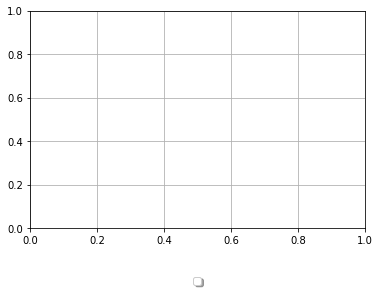

/tmp/ipykernel_2718418/3846749650.py:25: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



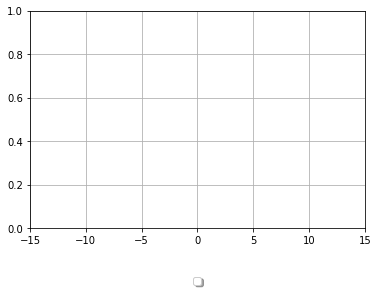

/tmp/ipykernel_2718418/3846749650.py:41: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



ICI


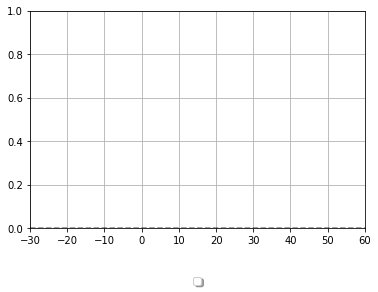

les cles : {}


ValueError: min() arg is an empty sequence

In [90]:
# Tracé des graphiques pour chaque triple avec les temps max
fig, ax1 = plt.subplots()
for triple , liste_t in triples.items():
    time_list = [max(liste_t)]
    time_list = sorted(list(liste_t))[-10:]
    mask = (np.array(list(liste_t))< 32)*(np.array(list(liste_t))> 29)
    time_list = sorted(np.array(list(liste_t))[mask])
    plot_graph1(date, nom, triple, time_list)
plt.grid(True)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.show()

fig, ax1 = plt.subplots()
chi2 = {}
for triple , liste_t in triples.items():
    time_list = [max(liste_t)]
    time_list = sorted(list(liste_t))[-10:]
    mask = (np.array(list(liste_t))< max(liste_t)+1)*(np.array(list(liste_t))> max(liste_t)-1)
    time_list = sorted(np.array(list(liste_t))[mask])
    if len(time_list) != 0 : chi2[triple] = plot_graph2(date, nom, triple, time_list , DONNEES)
ax1.set_xlim(-15, 15) 
plt.grid(True)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.show()
print ( "ICI")
fig, ax1 = plt.subplots()
for triple , liste_t in triples.items():
    time_list = [max(liste_t)]
    time_list = sorted(list(liste_t))[-10:]
    mask = ((np.array(list(liste_t))< max(liste_t)+1)*(np.array(list(liste_t))> max(liste_t)-1))+(np.array(list(liste_t))==0)
    mask = np.isin(np.array(liste_t), [0, 1]) #+ (np.array(list(liste_t)) == 30)
    time_list = sorted(np.array(list(liste_t))[mask])
    #time_list = sorted(np.array(list(liste_t))[-1])
    plot_graph3(date, nom, triple, time_list , DONNEES)
plt.xlim([-30 , 60 ])
#plt.axvline(x=x0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.grid(True)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.show()

print ( "les cles :", chi2)


# Trouver la clé avec la valeur minimale
triple = min(chi2, key=chi2.get)

#for triple , liste_t in triples.items():
for triple , liste_t in {triple : extract_t_times_Taille(date, nom, triple)}.items():
    time_list = [max(liste_t)]
    time_list = sorted(list(liste_t))[0:]
    mask = (np.array(list(liste_t))< 2000)*(np.array(list(liste_t))>= 0)
    time_list = sorted(np.array(list(liste_t))[mask])
    print ( "la")
    print ( 'time_list : ' , time_list)
    if len(time_list) != 0 : plot_Nat(date, nom, triple, time_list , DONNEES)
        
# Afficher la clé avec la valeur minimale
print("Clé avec la valeur minimale:", triple)
fig, ax1 = plt.subplots()
liste_t = extract_t_times_Taille(date, nom, triple)
liste_t = triples[triple]
time_list = [max(liste_t)]
time_list = sorted(list(liste_t))[:]
mask = (np.array(list(liste_t))< max(liste_t)+1)*(np.array(list(liste_t))> max(liste_t)-1)
time_list = sorted(np.array(list(liste_t))[mask])
plot_graph2(date, nom, triple, time_list , DONNEES)
plt.grid(True)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.show()

fig, ax1 = plt.subplots()
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
liste_t = extract_t_times_Taille(date, nom, triple)
time_list = [max(liste_t)]
time_list = sorted(list(liste_t))[-1:]
mask = ((np.array(list(liste_t))< max(liste_t)+1)*(np.array(list(liste_t))> max(liste_t)-1))
time_list = sorted(np.array(list(liste_t))[mask])
plot_graph3(date, nom, triple, time_list , DONNEES)
plt.grid(True)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.xlim([-500 , 500])

plt.show()

fig, ax1 = plt.subplots()
for triple , liste_t in triples.items():
    time_list = [max(liste_t)]
    time_list = sorted(list(liste_t))[-10:]
    mask = ((np.array(list(liste_t))< max(liste_t)+1)*(np.array(list(liste_t))> max(liste_t)-1))+(np.array(list(liste_t))==0)
    mask = np.isin(np.array(liste_t), [0, 1, 10 , 20 , 30, 40 , 50 ]) #+ (np.array(list(liste_t)) == 30)
    time_list = sorted(np.array(list(liste_t))[mask])
    plot_graph4(date, nom, triple, time_list , DONNEES)
#plt.xlim([])
plt.grid(True)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.show()

## optilisation 

In [10]:
print(date_donnees)
date_donnees = '2024-02-29'
print(date_donnees)
date = date_donnees
Temp_exp = 50
DONNEES = f_DONNEES(date_donnees) 
X , Y , label = DONNEES[3]

2024-02-29
2024-02-29


In [11]:
import pandas as pd
import os
from datetime import datetime

def merge_csv_files(directory, modes_dates, output_filename):
    """
    Fusionner plusieurs fichiers CSV en fonction de modes et dates spécifiques, 
    et enregistrer le résultat dans un fichier de sortie.
    
    Parameters:
    - directory : Le répertoire contenant les fichiers CSV.
    - modes_dates : Liste de tuples contenant le mode et les dates pour chaque fichier à fusionner.
    - output_filename : Nom du fichier de sortie résultant de la fusion.
    """
    # Créer une liste pour stocker les DataFrames
    dfs = []

    # Obtenir la date actuelle pour l'ajouter à chaque fichier CSV
    #date_analyse = datetime.now().strftime('%Y-%m-%d-%H-%M-%S')

    for mode, date in modes_dates:
        # Construire le chemin du fichier
        filename = os.path.join(directory, f"Optimisation_{mode}_{date}.csv")
        
        # Vérifier si le fichier existe
        if not os.path.isfile(filename):
            print(f"Fichier introuvable : {filename}")
            continue  # Passer à l'itération suivante si le fichier est manquant
        
        # Charger le fichier CSV dans un DataFrame
        df = pd.read_csv(filename)        
        # Ajouter une colonne 'Date_Analyse' pour chaque DataFrame
        #df['Date_Analyse'] = date_analyse
        
        # Ajouter le DataFrame à la liste
        dfs.append(df)

    # Si des DataFrames ont été chargés, les fusionner
    if dfs:
        merged_df = pd.concat(dfs, ignore_index=True)

        # Sauvegarder le DataFrame fusionné dans le fichier de sortie
        output_path = output_filename
        merged_df.to_csv(output_path, index=False)
        
        print(f"Les fichiers ont été fusionnés avec succès dans {output_path}")
    else:
        print("Aucun fichier valide à fusionner.")

# Exemple d'appel de la fonction
#directory = "./"  # Le répertoire contenant les fichiers
modes_dates = [
    ('T-x0-liste', '2024-11-26-11-32-09'),
    ('T-x0-liste', '2024-11-26-11-32-40'),
    ('T-x0-liste', '2024-11-26-14-23-10'),
    ('T-x0-liste', '2024-11-26-14-58-54'),
    ('T-x0-liste', '2024-11-26-15-00-29'),
]
#output_filename = os.path.join(directory, f"Optimisation_{'T-x0-liste-fusion'}_{datetime.now().strftime('%Y-%m-%d-%H-%M-%S')}.csv")

#print ("output_filename : " , output_filename)  
# Appeler la fonction de fusion
#merge_csv_files(directory, modes_dates, output_filename)


In [12]:
#faire un fichier perdue  (T-x0-liste)

import os
import numpy as np
import pandas as pd
from datetime import datetime


# Variables d'exemple
date_analyse = datetime.now().strftime('%Y-%m-%d-%H-%M-%S')  # La date actuelle sous le format souhaité
mode = 'T-x0-liste'

# Définir les listes pour T et x0
Liste_T = np.linspace(100, 2000, 5)
Liste_x0 = np.linspace(5, 20, 4)

# Initialiser un dictionnaire pour stocker les données
Chi = {}

# Créer un tableau pour stocker les lignes du fichier CSV
data = []

# Exemple de boucle pour traiter les différentes combinaisons de T et x0
for T in Liste_T:
    for x0 in Liste_x0:
        mu = None
        Taille = "<60"
        nom = "theta_edge_1.0_ih2"
        triples = extract_triples(date, nom, mu, T, x0, Taille)
        #print("Triples key possibles:", triples.keys())
        
        if len(list(triples.keys())) == 1:
            triple = list(triples.keys())[0]
            liste_t = triples[triple]
            
    
            mu, T, x00, Taille = triple
            mask = np.isin(np.array(liste_t), [Temp_exp])
            time_list = sorted(np.array(list(liste_t))[mask])
            #print(liste_t , time_list)
            
            
            try:
                t = time_list[0]
                filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
                #print ("filename :" , filename) 
                data_s = np.load(filename)
                X, Y, label = DONNEES[-1]
                
                if date_donnees == '2024-02-09':
                    mask = (X > -200) & (X < 50)
                elif date_donnees == '2024-04-24':
                    mask = (X > -150) & (X < 100)
                #else:
                   # mask = np.ones_like(X, dtype=bool)  # Par défaut, utiliser toutes les données
            
                # Calcul de chi²
                window_size = 20
                y_smoothed = np.convolve(Y, np.ones(window_size)/window_size, mode='same')
                if not( x00 == 5.373 and Taille == 42.48) :
                    Chi[triple] = calculate_chi_square(X[mask], y_smoothed[mask], data_s[0, :] * Taille, data_s[1, :])
                    # Ajouter les données pour le fichier CSV
                    data.append([T, x00, Chi[triple]])

            except IndexError:
                print(f"Pas finie la simul pour le triple : {triple}")
                continue  # Passer à l'itération suivante si time_list est vide

# Convertir les données en DataFrame
#df = pd.DataFrame(data, columns=['T', 'x0', 'Sum'])

# Créer le chemin du fichier
#filename = os.path.join(directory, f"Optimisation_{mode}_{date_analyse}.csv")

# Sauvegarder les données dans un fichier CSV
#df.to_csv(filename, index=False)

# Afficher un aperçu des 5 premières lignes
#print("Aperçu des 5 premières lignes :")
#print(df.head())


Pas finie la simul pour le triple : (-28.641, 2000.0, 10.0, 40.944)


In [12]:
#tous fusionner  (T-x0-liste)

import os
import numpy as np
import pandas as pd
from datetime import datetime





# Initialiser un dictionnaire pour stocker les données
Chi = {}

# Créer un tableau pour stocker les lignes du fichier CSV
data = []

mu = None
T = None
x0 = None
Taille = "<60"

nom = "theta_edge_1.0_ih2"
triples = extract_triples(date, nom, mu, T, x0, Taille)
#print("Triples key possibles:", triples.keys())

# Exemple de boucle pour traiter les différentes combinaisons de T et x0
for triple , liste_t in triples.items():

    #print ("triple :" , triple) 

    liste_t = triples[triple]
    

    mu, T, x00, Taille = triple
    mask = np.isin(np.array(liste_t), [Temp_exp])
    time_list = sorted(np.array(list(liste_t))[mask])
    print(liste_t , time_list)
    
    
    try:
        t = time_list[0]
        filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
        print ("filename :" , filename) 
        data_s = np.load(filename)
        X, Y, label = DONNEES[-1]
        
        if date_donnees == '2024-02-09':
            mask = (X > -200) & (X < 50)
        elif date_donnees == '2024-04-24':
            mask = (X > -150) & (X < 100)
        elif date_donnees == '2024-02-29':
            mask = (X > -220) & (X < 70)
        #else:
           # mask = np.ones_like(X, dtype=bool)  # Par défaut, utiliser toutes les données
        print ( "calcule")
        # Calcul de chi²
        window_size = 20
        y_smoothed = np.convolve(Y, np.ones(window_size)/window_size, mode='same')
        if not( x00 == 5.373 and Taille == 42.48) :
            Chi[triple] = calculate_chi_square(X[mask], y_smoothed[mask], data_s[0, :] * Taille, data_s[1, :])
            # Ajouter les données pour le fichier CSV
            data.append([T, x00, Chi[triple]])

    except IndexError:
        print(f"Pas finie la simul pour le triple : {triple}")
        continue  # Passer à l'itération suivante si time_list est vide

# Convertir les données en DataFrame
df = pd.DataFrame(data, columns=['T', 'x0', 'Sum'])

# Variables d'exemple
date_analyse = datetime.now().strftime('%Y-%m-%d-%H-%M-%S')  # La date actuelle sous le format souhaité
mode = 'T-x0-liste-tout'

# Créer le chemin du fichier
filename = os.path.join(directory, f"Optimisation_{mode}_{date_analyse}.csv")
print ("filename :" , filename)

# Sauvegarder les données dans un fichier CSV
df.to_csv(filename, index=False)

# Afficher un aperçu des 5 premières lignes
print("Aperçu des 5 premières lignes :")
print(df.head())


[0.0, 1.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0] [np.float64(50.0)]
filename : 2024-02-29/density_expansion_nu_theta_edge_1.0_ih2_52.982_700.000_10.000_39.714_50.000.npz
calcule
[0.0, 1.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0] [np.float64(50.0)]
filename : 2024-02-29/density_expansion_nu_theta_edge_1.0_ih2_45.512_900.000_0.000_43.466_50.000.npz
calcule
[0.0, 1.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0] [np.float64(50.0)]
filename : 2024-02-29/density_expansion_nu_theta_edge_1.0_ih2_44.523_922.358_4.617_41.820_50.000.npz
calcule
[0.0, 1.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0] [np.float64(50.0)]
filename : 2024-02-29/density_expansion_nu_theta_edge_1.0_ih2_20.754_1350.123_7.853_41.083_50.000.npz
calcule
[0.0, 1.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0] [np.float64(50.0)]
filename : 2024-02-29/density_expansion_nu_theta_edge_1.0_ih2_44.524_922.347_5.076_41.663_50.000.npz
calcule
[0.0, 1.0, 10.0, 11.0, 20.0, 21.0

In [91]:
import os
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Fonction pour tracer les données depuis un fichier
def plot_from_file(directory, mode, date):
    # Construire le nom du fichier
    #%matplotlib widget
    #%matplotlib
    #matplotlib.use('Agg')  # Utilisation du backend "Agg" sans interface graphique
    filename = os.path.join(directory, f"Optimisation_{mode}_{date}.csv")
    
    # Vérifier si le fichier existe
    if not os.path.isfile(filename):
        print(f"Fichier introuvable : {filename}")
        return
    
    # Charger les données du fichier
    df = pd.read_csv(filename)

    # Afficher les 5 premières lignes
    print("Aperçu des 5 premières lignes :")
    print(df.head())
    
    # Afficher des informations générales sur les données
    print("\nInformations générales sur les données :")
    print(df.info())
    
    # Afficher des statistiques descriptives sur les colonnes numériques
    print("\nStatistiques descriptives :")
    print(df.describe())
    
    # Afficher toutes les colonnes pour vérifier leur nom (utile si vous avez des colonnes inattendues)
    print("\nColonnes disponibles :")
    print(df.columns)

    # Charger le fichier CSV
    df = pd.read_csv(filename)
    
    # Changer les paramètres pour afficher toutes les lignes
    pd.set_option('display.max_rows', None)  # Aucun maximum pour les lignes
    pd.set_option('display.max_columns', None)  # Afficher toutes les colonnes si nécessaire
    
    # Afficher toutes les lignes
    print("Toutes les lignes du DataFrame :")
    print(df)
    
    # Trouver l'index du minimum de 'Sum'
    min_sum_idx = df['Sum'].idxmin()
    
    # Récupérer les valeurs de T et x0 correspondant au min de Sum
    T_min = df['T'][min_sum_idx]
    x0_min = df['x0'][min_sum_idx]
    min_sum = df['Sum'].min()
    
    # Formater les valeurs avec 3 chiffres après la virgule
    T_min_formatted = f"{T_min:.3f}"
    x0_min_formatted = f"{x0_min:.3f}"
    min_sum_formatted = f"{min_sum:.3f}"
    
    # Tracer selon le mode
    if mode == "T" or mode == "T-liste":
        plt.figure()
        plt.plot(df['T'], df['Sum'], label="Sum(T)", linewidth=2 , linestyle='-', marker='o')
        plt.ticklabel_format(style='plain', axis='both')
        plt.xlabel("T")
        plt.ylabel("Sum")
        plt.title(f"Sum en fonction de T et x0 (min Sum = {min_sum_formatted} à T = {T_min_formatted}, x0 = {x0_min_formatted})")
        plt.legend()
        plt.show()
    
    elif mode == "x0" or mode == "x0-liste":
        plt.figure()
        plt.plot(df['x0'], df['Sum'], label="Sum(x0)", linewidth=2 , linestyle='-', marker='o')
        plt.ticklabel_format(style='plain', axis='both')
        plt.xlabel("x0")
        plt.ylabel("Sum")
        plt.title(f"Sum en fonction de T et x0 (min Sum = {min_sum_formatted} à T = {T_min_formatted}, x0 = {x0_min_formatted})")
        plt.legend()
        plt.show()
    
    elif mode == "T-x0" or mode == "T-x0-liste":
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        ax.plot(df['T'], df['x0'], df['Sum'], c='r', linewidth=2 ,linestyle='-', marker='o')
        ax.set_xlabel("T")
        ax.set_ylabel("x0")
        ax.set_zlabel("Sum")
        plt.ticklabel_format(style='plain', axis='both')
        plt.title(f"Sum en fonction de T et x0 (min Sum = {min_sum_formatted} à T = {T_min_formatted}, x0 = {x0_min_formatted})")
        plt.show()
    
    else:
        print(f"Mode non supporté : {mode}")



def plot_from_file(directory, mode, date):
    # Construire le nom du fichier
    #%matplotlib widget
    #%matplotlib
    #matplotlib.use('Agg')  # Utilisation du backend "Agg" sans interface graphique
    filename = os.path.join(directory, f"Optimisation_{mode}_{date}.csv")
    
    # Vérifier si le fichier existe
    if not os.path.isfile(filename):
        print(f"Fichier introuvable : {filename}")
        return
    
    # Charger les données du fichier
    df = pd.read_csv(filename)

    # Afficher les 5 premières lignes
    print("Aperçu des 5 premières lignes :")
    print(df.head())
    
    # Afficher des informations générales sur les données
    print("\nInformations générales sur les données :")
    print(df.info())
    
    # Afficher des statistiques descriptives sur les colonnes numériques
    print("\nStatistiques descriptives :")
    print(df.describe())
    
    # Afficher toutes les colonnes pour vérifier leur nom (utile si vous avez des colonnes inattendues)
    print("\nColonnes disponibles :")
    print(df.columns)

    # Charger le fichier CSV
    df = pd.read_csv(filename)
    
    # Changer les paramètres pour afficher toutes les lignes
    pd.set_option('display.max_rows', None)  # Aucun maximum pour les lignes
    pd.set_option('display.max_columns', None)  # Afficher toutes les colonnes si nécessaire
    
    # Afficher toutes les lignes
    print("Toutes les lignes du DataFrame :")
    print(df)
    
    # Trouver l'index du minimum de 'Sum'
    min_sum_idx = df['Sum'].idxmin()
    
    # Récupérer les valeurs de T et x0 correspondant au min de Sum
    mu_min = df['mu'][min_sum_idx]
    T_min = df['T'][min_sum_idx]
    x0_min = df['x0'][min_sum_idx]
    Taille_min = df['Taille'][min_sum_idx]
    min_sum = df['Sum'].min()
    
    # Formater les valeurs avec 3 chiffres après la virgule
    mu_min_formatted = f"{mu_min:.3f}"
    T_min_formatted = f"{T_min:.3f}"
    x0_min_formatted = f"{x0_min:.3f}"
    Taille_min_formatted = f"{Taille_min:.3f}"
    min_sum_formatted = f"{min_sum:.3f}"
    
    # Tracer selon le mode
    if mode in ["mu", "mu-liste" ,"mu-bord"]:
        # Graphique interactif en 2D (T vs Sum)
        fig = px.line(df, x='mu', y='Sum', title=f"Sum en fonction de mu (min Sum = {min_sum_formatted} à mu = {mu_min_formatted}, T = {T_min_formatted} , x0 = {x0_min_formatted}, Taille = {Taille_min_formatted})")
        fig.update_traces(mode='lines+markers')  # Lignes avec marqueurs
        fig.update_layout(
            xaxis_title="mu",
            yaxis_title="Sum",
            font=dict(size=12)
        )
        fig.show()
        
    elif mode in ["T", "T-liste" ,"T-bord"]:
        # Graphique interactif en 2D (T vs Sum)
        fig = px.line(df, x='T', y='Sum', title=f"Sum en fonction de T (min Sum = {min_sum_formatted} à mu = {mu_min_formatted}, T = {T_min_formatted} , x0 = {x0_min_formatted}, Taille = {Taille_min_formatted})")
        fig.update_traces(mode='lines+markers')  # Lignes avec marqueurs
        fig.update_layout(
            xaxis_title="T",
            yaxis_title="Sum",
            font=dict(size=12)
        )
        fig.show()
    
    elif mode in ["x0", "x0-liste"]:
        # Graphique interactif en 2D (x0 vs Sum)
        fig = px.line(df, x='x0', y='Sum', title=f"Sum en fonction de x0 (min Sum = {min_sum_formatted} à mu = {mu_min_formatted}, T = {T_min_formatted} , x0 = {x0_min_formatted}, Taille = {Taille_min_formatted})")
        fig.update_traces(mode='lines+markers')
        fig.update_layout(
            xaxis_title="x0",
            yaxis_title="Sum",
            font=dict(size=12)
        )
        fig.show()

    elif mode in ["Taille", "Taille-liste"]:
        # Graphique interactif en 2D (x0 vs Sum)
        fig = px.line(df, x='Taille', y='Sum', title=f"Sum en fonction de Taille (min Sum = {min_sum_formatted} à mu = {mu_min_formatted}, T = {T_min_formatted} , x0 = {x0_min_formatted}, Taille = {Taille_min_formatted})")
        fig.update_traces(mode='lines+markers')
        fig.update_layout(
            xaxis_title="Taille",
            yaxis_title="Sum",
            font=dict(size=12)
        )
        fig.show()
    
    elif mode in ["T-x0", "T-x0-liste" , "T-x0-liste-fusion" , 'T-x0-liste-tout']:
        # Graphique interactif en 3D (T, x0, Sum)
        fig = go.Figure(data=[go.Scatter3d(
            x=df['T'], 
            y=df['x0'], 
            z=df['Sum'],
            mode='markers+lines',
            marker=dict(
                size=5,
                color=df['Sum'],  # Couleur en fonction de la valeur de Sum
                colorscale='Viridis',
                opacity=0.8
            )
        )])
        fig.update_layout(
            scene=dict(
                xaxis_title="T",
                yaxis_title="x0",
                zaxis_title="Sum"
            ),
            title=f"Sum en fonction de T et x0 (min Sum = {min_sum_formatted} à mu = {mu_min_formatted}, T = {T_min_formatted} , x0 = {x0_min_formatted}, Taille = {Taille_min_formatted})",
            font=dict(size=12)
        )
        fig.show()

        # Projection Chi(T)
        fig_T = go.Figure()
        fig_T.add_trace(go.Scatter(
            x=df['T'],
            y=df['Sum'],
            mode='markers',
            #marker=dict(color=Chi_values, colorscale='Viridis'),
            name="Projection : χ²(T)"
        ))
        fig_T.update_layout(
            title="Projection : χ²(T)",
            xaxis_title="T",
            yaxis_title="χ²"
        )
        fig_T.show()
        
        # Projection Chi(x0)
        fig_x0 = go.Figure()
        fig_x0.add_trace(go.Scatter(
            x=df['x0'],
            y=df['Sum'],
            mode='markers',
            #marker=dict(color=Chi_values, colorscale='Viridis'),
            name="Projection : χ²(x₀)"
        ))
        fig_x0.update_layout(
            title="Projection : χ²(x₀)",
            xaxis_title="x₀",
            yaxis_title="χ²"
        )
        fig_x0.show()

    #elif mode in ["mu-T", "mu-T-liste" , "mu-T-liste-fusion" , 'mu-T-liste-tout']:
    possible_modes = ["mu-T", "T-x0", "T-x0-liste", "T-x0-liste-fusion", "T-x0-liste-tout"]

    # Vérification conditionnelle
    if any(sub_mode in mode for sub_mode in possible_modes):
        # Graphique interactif en 3D (T, x0, Sum)
        fig = go.Figure(data=[go.Scatter3d(
            x=df['mu'], 
            y=df['T'], 
            z=df['Sum'],
            mode='markers+lines',
            marker=dict(
                size=5,
                color=df['Sum'],  # Couleur en fonction de la valeur de Sum
                colorscale='Viridis',
                opacity=0.8
            )
        )])
        fig.update_layout(
            scene=dict(
                xaxis_title="mu",
                yaxis_title="T",
                zaxis_title="Sum"
            ),
            title=f"Sum en fonction de mu et T (min Sum = {min_sum_formatted} à mu = {mu_min_formatted}, T = {T_min_formatted} , x0 = {x0_min_formatted}, Taille = {Taille_min_formatted})",
            font=dict(size=12)
        )
        fig.show()

        # Projection Chi(T)
        fig_mu = go.Figure()
        fig_mu.add_trace(go.Scatter(
            x=df['mu'],
            y=df['Sum'],
            mode='markers',
            #marker=dict(color=Chi_values, colorscale='Viridis'),
            name="Projection : χ²(mu)"
        ))
        fig_mu.update_layout(
            title="Projection : χ²(mu)",
            xaxis_title="mu",
            yaxis_title="χ²"
        )
        fig_mu.show()
        
        # Projection Chi(x0)
        fig_T = go.Figure()
        fig_T.add_trace(go.Scatter(
            x=df['T'],
            y=df['Sum'],
            mode='markers',
            #marker=dict(color=Chi_values, colorscale='Viridis'),
            name="Projection : χ²(T)"
        ))
        fig_T.update_layout(
            title="Projection : χ²(T)",
            xaxis_title="T",
            yaxis_title="χ²"
        )
        fig_T.show()

    
    else:
        print(f"Mode non supporté : {mode}")

import os
import pandas as pd
import plotly.graph_objects as go
import numpy as np
from scipy.interpolate import griddata
import plotly.express as px

def plot_from_file_1(directory, mode, date):
    # Construire le nom du fichier
    filename = os.path.join(directory, f"Optimisation_{mode}_{date}.csv")
    
    # Vérifier si le fichier existe
    if not os.path.isfile(filename):
        print(f"Fichier introuvable : {filename}")
        return
    
    # Charger les données du fichier
    df = pd.read_csv(filename)

    
    # Trouver l'index du minimum de 'Sum'
    min_sum_idx = df['Sum'].idxmin()
    
    # Récupérer les valeurs de T et x0 correspondant au min de Sum
    # Récupérer les valeurs de T et x0 correspondant au min de Sum
    mu_min = df['mu'][min_sum_idx]
    T_min = df['T'][min_sum_idx]
    x0_min = df['x0'][min_sum_idx]
    Taille_min = df['Taille'][min_sum_idx]
    min_sum = df['Sum'].min()
    
    # Formater les valeurs avec 3 chiffres après la virgule
    mu_min_formatted = f"{mu_min:.3f}"
    T_min_formatted = f"{T_min:.3f}"
    x0_min_formatted = f"{x0_min:.3f}"
    Taille_min_formatted = f"{Taille_min:.3f}"
    min_sum_formatted = f"{min_sum:.3f}"

    print(f"Valeur minimale en z: {min_sum_formatted}")
    print(f"Position du minimum: (min Sum = {min_sum_formatted} à mu = {mu_min_formatted}, T = {T_min_formatted} , x0 = {x0_min_formatted}, Taille = {Taille_min_formatted})")

    liste_mode = mode.split("-")
    # Tracer selon le mode
    # Tracer selon le mode

    possible_modes = ["T" , "mu-T", "T-x0", "T-x0-liste", "T-x0-liste-fusion", "T-x0-liste-tout"]

    if mode in ["mu", "mu-liste" ,"mu-bord", "T", "T-liste" ,"T-bord", "x0", "x0-liste" , "Taille", "Taille-liste"]:
        # Graphique interactif en 2D (T vs Sum)
        fig = px.line(df, x=liste_mode[0], y='Sum', title=f"Sum en fonction de {liste_mode[0]} (min Sum = {min_sum_formatted} à mu = {mu_min_formatted}, T = {T_min_formatted} , x0 = {x0_min_formatted}, Taille = {Taille_min_formatted})")
        fig.update_traces(mode='lines+markers')  # Lignes avec marqueurs
        fig.update_layout(
            xaxis_title=liste_mode[0],
            yaxis_title="Sum",
            font=dict(size=12)
        )
        fig.show()
    elif mode in ["mu", "mu-liste" ,"mu-bord"]:
        # Graphique interactif en 2D (T vs Sum)
        fig = px.line(df, x='mu', y='Sum', title=f"Sum en fonction de mu (min Sum = {min_sum_formatted} à mu = {mu_min_formatted}, T = {T_min_formatted} , x0 = {x0_min_formatted}, Taille = {Taille_min_formatted})")
        fig.update_traces(mode='lines+markers')  # Lignes avec marqueurs
        fig.update_layout(
            xaxis_title="mu",
            yaxis_title="Sum",
            font=dict(size=12)
        )
        fig.show()
        
    elif mode in ["T", "T-liste" ,"T-bord" , 'T-Taille=29']:
        # Graphique interactif en 2D (T vs Sum)
        fig = px.line(df, x='T', y='Sum', title=f"Sum en fonction de T (min Sum = {min_sum_formatted} à mu = {mu_min_formatted}, T = {T_min_formatted} , x0 = {x0_min_formatted}, Taille = {Taille_min_formatted})")
        fig.update_traces(mode='lines+markers')  # Lignes avec marqueurs
        fig.update_layout(
            xaxis_title="T",
            yaxis_title="Sum",
            font=dict(size=12)
        )
        fig.show()
    
    elif mode in ["x0", "x0-liste"]:
        # Graphique interactif en 2D (x0 vs Sum)
        fig = px.line(df, x='x0', y='Sum', title=f"Sum en fonction de x0 (min Sum = {min_sum_formatted} à mu = {mu_min_formatted}, T = {T_min_formatted} , x0 = {x0_min_formatted}, Taille = {Taille_min_formatted})")
        fig.update_traces(mode='lines+markers')
        fig.update_layout(
            xaxis_title="x0",
            yaxis_title="Sum",
            font=dict(size=12)
        )
        fig.show()

    elif mode in ["Taille", "Taille-liste"]:
        # Graphique interactif en 2D (x0 vs Sum)
        fig = px.line(df, x='Taille', y='Sum', title=f"Sum en fonction de Taille (min Sum = {min_sum_formatted} à mu = {mu_min_formatted}, T = {T_min_formatted} , x0 = {x0_min_formatted}, Taille = {Taille_min_formatted})")
        fig.update_traces(mode='lines+markers')
        fig.update_layout(
            xaxis_title="Taille",
            yaxis_title="Sum",
            font=dict(size=12)
        )
        fig.show()
        


    #elif mode in ["mu-T", "T-x0", "T-x0-liste" , "T-x0-liste-fusion" , 'T-x0-liste-tout']:

    

    # Vérification conditionnelle
    elif any(sub_mode in mode for sub_mode in possible_modes):

        #print (liste_mode , mode ,  possible_modes)
        # Graphique interactif en 3D (T, x0, Sum) avec surface, contours et nuage de points

        # Iterate through the reversed list
        for element in reversed(liste_mode):
            if "=" in element:
                liste_mode.remove(element)

        if len(liste_mode) == 1 :
            if liste_mode[0] == "T" : liste_mode.append("mu")
            elif liste_mode[0] == "mu" : liste_mode.append("T")
            elif liste_mode[0] == "Taille" : liste_mode.append("x0")
            elif liste_mode[0] == "x0" : liste_mode.append("Taille") ### a changer à la main 
        
        # Création de la grille pour l'interpolation
        grid_T, grid_x0 = np.meshgrid(np.linspace(df[liste_mode[0]].min(), df[liste_mode[0]].max(), 100),
                                       np.linspace(df[liste_mode[1]].min(), df[liste_mode[1]].max(), 100))
        
        # Interpolation des valeurs de Sum
        grid_Sum = griddata((df[liste_mode[0]], df[liste_mode[1]]), df['Sum'], (grid_T, grid_x0), method='cubic')
        
        # Graphique en surface
        fig = go.Figure()

        # Surface 3D
        fig.add_trace(go.Surface(z=grid_Sum, x=grid_T, y=grid_x0, colorscale='Viridis', opacity=0.7))

        # Enlever les contours de fond
        # Juste ne pas afficher les contours sur les axes
        fig.add_trace(go.Contour(
            z=grid_Sum[:, 0],  # Projection sur le plan Y-Z
            x=grid_T[:, 0],    # Utilise la première colonne (valeurs fixes de x0)
            colorscale='Viridis',  # Couleur selon Sum
            showscale=True,#False,
            visible=True#False  # Masque les contours
        ))

        fig.add_trace(go.Contour(
            z=grid_Sum[0, :],  # Projection sur le plan X-Z
            y=grid_x0[0, :],   # Utilise la première ligne (valeurs fixes de T)
            colorscale='Viridis',
            showscale=False,
            visible=False  # Masque les contours
        ))

        # Nuage de points
        fig.add_trace(go.Scatter3d(
            x=df[liste_mode[0]], 
            y=df[liste_mode[1]], 
            z=df['Sum'],
            mode='markers',
            marker=dict(
                size=5,
                color=df['Sum'],  # Couleur en fonction de la valeur de Sum
                colorscale='Viridis',
                opacity=0.8
            ),
            name="Nuage de points"
        ))

        fig.update_layout(
            scene=dict(
                xaxis_title=liste_mode[0],
                yaxis_title=liste_mode[1],
                zaxis_title="Sum"
            ),
            title=f"Sum en fonction de {liste_mode[0]} et {liste_mode[1]} (min Sum = {min_sum_formatted} à T = {T_min_formatted}, x0 = {x0_min_formatted})",
            font=dict(size=12)
        )
        

        fig.show()

        
        

        z0 = 1.2*min_sum#400

        # Filtrer les valeurs de la surface en dessous de z0
        grid_Sum_below_z0 = np.where(grid_Sum <= z0, grid_Sum, np.nan)  # Remplace les valeurs au-dessus de z0 par NaN
        
        # Affichage de la surface 3D avec Plotly (uniquement pour les valeurs inférieures à z0)
        fig = go.Figure(data=[go.Surface(
            z=grid_Sum_below_z0,
            x=grid_T,
            y=grid_x0,
            colorscale='Viridis',
            opacity=0.7,
            colorbar=dict(
                #title="Valeur de Sum",  # Titre de la color bar
                #tickvals=[np.min(grid_Sum), np.max(grid_Sum)],  # Valeurs minimales et maximales de la color bar
                #ticktext=[f'{np.min(grid_Sum):.2f}', f'{np.max(grid_Sum):.2f}']  # Affichage formaté des ticks
                tickvals=[np.min(grid_Sum_below_z0), np.max(grid_Sum_below_z0)],  # Valeurs minimales et maximales de la color bar
                ticktext=[f'{np.min(grid_Sum_below_z0):.2f}', f'{np.max(grid_Sum_below_z0):.2f}']  # Affichage formaté des ticks
            )
        )])
        
        # Tracer un plan z = z0 (en option)
        fig.add_trace(go.Surface(z=np.full_like(grid_Sum_below_z0, z0), x=grid_T, y=grid_x0, colorscale='Blues', opacity=0.3))
        
        # Mettre à jour la mise en page
        fig.update_layout(
            scene=dict(
                xaxis_title=liste_mode[0],
                yaxis_title=liste_mode[1],
                zaxis_title="Sum"
            ),
            title=f"Sum en fonction de {liste_mode[0]} et {liste_mode[1]} (min Sum = {min_sum_formatted} à mu = {mu_min_formatted}, T = {T_min_formatted} , x0 = {x0_min_formatted}, Taille = {Taille_min_formatted})",
            font=dict(size=12)
        )
        
        # Affichage du graphique
        fig.show()
        
        # Calcul des intersections avec le plan z = z0
        # Chercher où les valeurs de grid_Sum sont égales à z0 (ou proches de z0)
        z_intersections = np.where(np.isclose(grid_Sum, z0, atol=1e-3))  # tolérance de 1e-3 pour approximer
        
        intersections = [(grid_T[i], grid_x0[j], grid_Sum[i, j]) for i, j in zip(z_intersections[0], z_intersections[1])]
        
        print(f"Intersections avec le plan z = {z0:.3f} :")
        for point in intersections:
            print(f"{liste_mode[0]} = {point[0]}, {liste_mode[1]} = {point[1]}, z = {point[2]}")
    
    else:
        print(f"Mode non supporté : {mode}")


In [92]:
# Liste des modes possibles
possible_modes = ["mu-T", "T-x0", "T-x0-liste", "T-x0-liste-fusion", "T-x0-liste-tout"]

# Mode actuel
mode = "mu-T-x0=18.339"

# Vérification si un élément de la liste correspond à une sous-chaîne de mode
if any(sub_mode in mode for sub_mode in possible_modes):
    print("Un élément de la liste correspond à une sous-chaîne de mode.")
else:
    print("Aucun élément de la liste ne correspond.")


Un élément de la liste correspond à une sous-chaîne de mode.


In [93]:
#%matplotlib widget 
#%matplotlib notebook
%matplotlib
# Utiliser des widgets pour des graphiques interactifs

import os
import glob
import pandas as pd

print(date_donnees)
date_donnees = '2025-01-27'
print(date_donnees)
date = date_donnees
#Temp_exp = 50
#DONNEES = f_DONNEES(date_donnees) 
#X , Y , label = DONNEES[3]




import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from datetime import datetime

def list_available_modes_and_dates(directory):
    # Trouver tous les fichiers correspondant au motif
    files = glob.glob(os.path.join(directory, "Optimisation_*_*.csv"))
    modes_dates = []

    for file in files:
        basename = os.path.basename(file)
        parts = basename.split('_')
        if len(parts) >= 3:
            mode = parts[1]
            date_str = '_'.join(parts[2:]).replace('.csv', '')
            try:
                # Convertir la date en objet datetime
                date_obj = datetime.strptime(date_str, "%Y-%m-%d-%H-%M-%S")
                modes_dates.append((mode, date_obj, date_str))
            except ValueError:
                # Ignorer les fichiers dont le format de date est incorrect
                continue
    
    # Trier les tuples par date (date_obj), du plus ancien au plus récent
    modes_dates.sort(key=lambda x: x[1])

    # Retourner le mode et la date sous forme de string triée
    return [(mode, date_str) for mode, _, date_str in modes_dates]


#import os
#import pandas as pd
#!pip install plotly



# Exemple d'utilisation
# Répertoire où se trouvent les fichiers
directory = date  # Remplacez par votre répertoire

# Lister les modes et dates disponibles
modes_dates = list_available_modes_and_dates(directory)
#print("Modes et dates disponibles :", modes_dates)
print(f"###{date}")
for double in modes_dates :
    print (f"mode, date_analyse =  '{double[0]}' ,  '{double[1]}' ")




Using matplotlib backend: agg
2024-02-29
2025-01-27
###2025-01-27
mode, date_analyse =  'mu-T-Taile=29' ,  '2025-01-27-02-18-16' 
mode, date_analyse =  'mu-T-Taile=29' ,  '2025-01-27-02-19-02' 
mode, date_analyse =  'T-x0' ,  '2025-01-27-11-37-50' 
mode, date_analyse =  'T-x0' ,  '2025-01-27-16-46-53' 
mode, date_analyse =  'x0' ,  '2025-01-27-18-20-02' 
mode, date_analyse =  'T-x0=18.8-Taille=26.6' ,  '2025-02-28-15-44-58' 
mode, date_analyse =  'T-x0=18.858-Taille=26.645' ,  '2025-02-28-15-46-34' 
mode, date_analyse =  'T-x0=18.7-Taille=27.34' ,  '2025-02-28-17-49-04' 
mode, date_analyse =  'T-x0=18.7-Taille=27.34' ,  '2025-02-28-17-58-27' 
mode, date_analyse =  'T-x0=18.7-Taille=32.28' ,  '2025-03-01-12-32-10' 
mode, date_analyse =  'T-x0=18.7-Taille=32.28' ,  '2025-03-01-15-31-06' 
mode, date_analyse =  'T-x0=18.7-Taille=32.28' ,  '2025-03-02-00-49-41' 
mode, date_analyse =  'T-x0=18.86-Taille=28.165' ,  '2025-03-02-16-26-57' 
mode, date_analyse =  'T-x0=18.3-Taille=24.1' ,  '2025-

date =  2025-01-27
Aperçu des 5 premières lignes :
          mu            T    x0  Taille        Sum
0  30.636254  1469.008895  18.3    24.1  21.777480
1  30.637261  1468.991105  18.3    24.1  21.777651
2  30.636758  1469.000000  18.3    24.1  21.777565
3  30.544443  1470.630512  18.3    24.1  21.762050
4  30.545452  1470.612702  18.3    24.1  21.762217

Informations générales sur les données :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42 entries, 0 to 41
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mu      42 non-null     float64
 1   T       42 non-null     float64
 2   x0      42 non-null     float64
 3   Taille  42 non-null     float64
 4   Sum     42 non-null     float64
dtypes: float64(5)
memory usage: 1.8 KB
None

Statistiques descriptives :
              mu            T            x0  Taille        Sum
count  42.000000    42.000000  4.200000e+01    42.0  42.000000
mean   26.592035  1538.468696  1.830000e

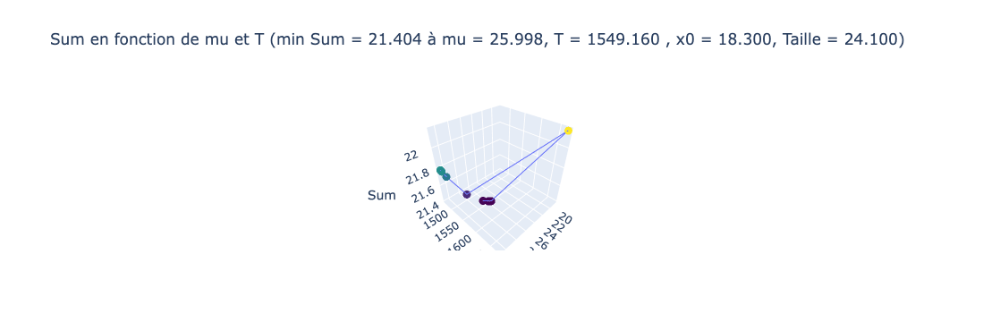

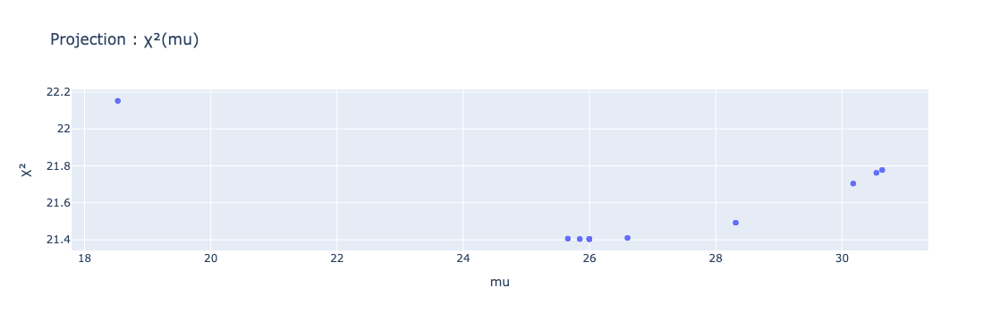

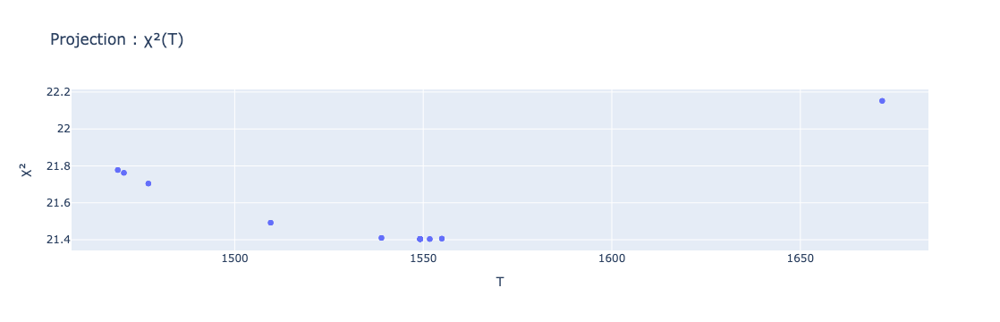

Valeur minimale en z: 21.404
Position du minimum: (min Sum = 21.404 à mu = 25.998, T = 1549.160 , x0 = 18.300, Taille = 24.100)


/home/isabelle.bouchoule/.local/lib/python3.10/site-packages/scipy/interpolate/_ndgriddata.py:327: GradientEstimationWarning:

Gradient estimation did not converge, the results may be inaccurate



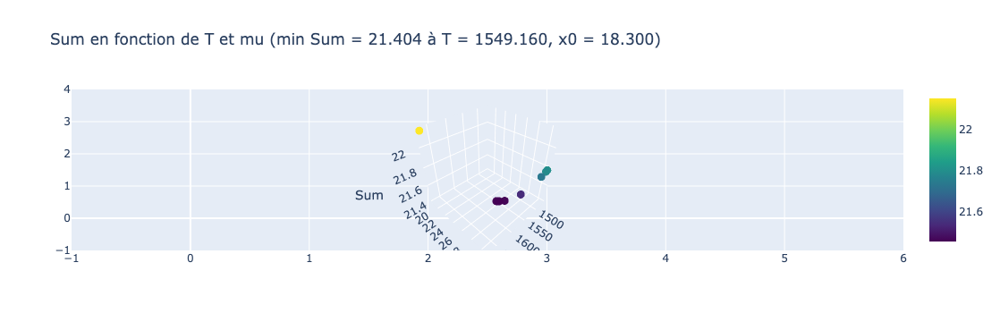

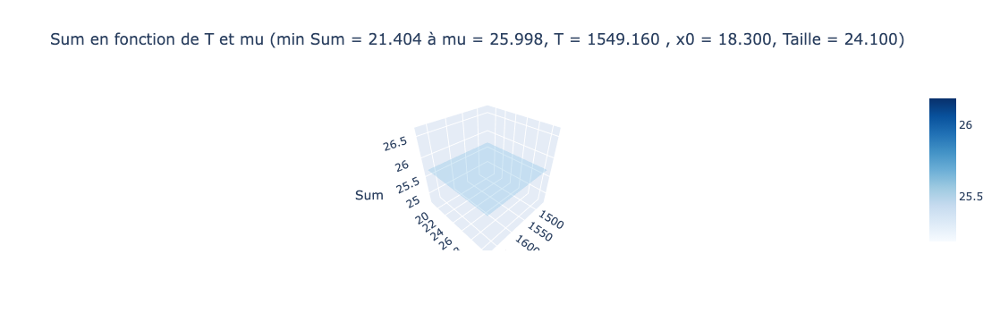

Intersections avec le plan z = 25.685 :
2025-01-27


In [94]:
#%matplotlib
#%matplotlib notebook
%matplotlib inline
# Exemple pour tracer un fichier
#from IPython.display import display, Javascript
#display(Javascript("IPython.notebook.kernel.restart();"))


mode, date_analyse = "T" , "2024-11-24-15-37-33"  # Date choisie
mode, date_analyse = "T" , "2024-11-24-16-18-27"
mode, date_analyse = "T" , "2024-11-24-20-50-16"
mode, date_analyse = "T" , "2024-11-24-21-39-09"
mode, date_analyse = "T-x0" , "2024-11-24-12-17-38"
mode, date_analyse = 'x0', '2024-11-24-22-33-39'
mode, date_analyse = 'x0', '2024-11-24-23-53-12'
mode, date_analyse = 'T-x0', '2024-11-25-00-08-43'
mode, date_analyse = 'T', '2024-11-25-02-42-56'
mode, date_analyse = 'x0', '2024-11-25-03-11-28'
mode, date_analyse = 'x0', '2024-11-25-13-58-44'
mode, date_analyse = 'T', '2024-11-25-15-18-23'
mode, date_analyse = 'T', '2024-11-25-16-56-39'
mode, date_analyse = 'T-x0', '2024-11-25-17-35-01'
mode, date_analyse = 'T-x0-liste', '2024-11-26-11-32-40'
mode, date_analyse = 'T-x0-liste', '2024-11-26-15-00-29'
mode, date_analyse = 'T-x0-liste', '2024-11-26-14-23-10'
mode, date_analyse = 'T-x0-liste-fusion', '2024-11-26-15-12-59'
mode, date_analyse = 'T-x0-liste-tout', '2024-11-26-15-53-06'
mode, date_analyse = 'T-x0', '2024-11-26-19-02-58'
mode, date_analyse = 'T-x0', '2024-11-26-20-35-41'
mode, date_analyse = 'T-x0', '2024-11-27-00-05-53'
mode, date_analyse = 'T-x0-liste-fusion', '2024-11-27-08-54-31' 
mode, date_analyse = 'T-x0', '2024-11-27-08-59-19'
mode, date_analyse = 'T-x0', '2024-11-27-13-38-13'

### 29-02-2024
#mode, date_analyse = 'T-bord', '2024-11-28-16-53-01'
#mode, date_analyse = 'T-bord', '2024-11-29-11-57-37'
#mode, date_analyse = 'T-bord', '2024-11-29-13-24-28'
#mode, date_analyse = 'T-x0', '2024-11-29-16-19-08'
#mode, date_analyse = 'T-x0-liste', '2024-12-02-10-39-46'
#mode, date_analyse = 'T-x0-liste', '2024-12-02-12-59-01'
#mode, date_analyse = 'T-x0-liste-tout', '2024-12-02-14-54-29'
mode, date_analyse = 'T-x0', '2024-12-02-15-44-20'

###2024-02-09
print ( 'date = ' , date )
if date == '2024-02-09_1' :
    print ( 'date = ' , date )
    mode, date_analyse =  'T-x0' ,  '2024-11-24-12-17-38' 
    mode, date_analyse =  'T' ,  '2024-11-24-15-37-33' 
    mode, date_analyse =  'T' ,  '2024-11-24-16-18-27' 
    mode, date_analyse =  'T' ,  '2024-11-24-20-50-16' 
    mode, date_analyse =  'T' ,  '2024-11-24-21-11-03' 
    mode, date_analyse =  'T' ,  '2024-11-24-21-25-52' 
    mode, date_analyse =  'T' ,  '2024-11-24-21-39-09' 
    mode, date_analyse =  'x0' ,  '2024-11-24-22-33-39' 
    mode, date_analyse =  'x0' ,  '2024-11-24-23-53-12' 
    mode, date_analyse =  'T-x0' ,  '2024-11-25-00-08-43' 

###2024-02-29
elif date == '2024-02-29_1' :
    print ( 'date = ' , date )
    mode, date_analyse =  'T-bord' ,  '2024-11-28-14-00-53' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-14-03-04' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-11-28-14-03-35' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-14-28-09' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-14-28-58' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-14-40-25' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-11-28-14-40-36' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-14-44-24' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-14-47-51' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-15-00-23' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-15-29-15' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-15-48-33' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-11-28-15-56-43' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-15-57-42' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-11-28-16-07-04' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-16-09-49' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-16-16-56' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-16-20-34' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-16-26-09' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-16-29-40' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-16-30-11' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-16-31-30' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-16-34-15' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-16-41-51' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-16-51-21' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-16-52-18' 
    mode, date_analyse =  'T-bord' ,  '2024-11-28-16-53-01' 
    mode, date_analyse =  'T-bord' ,  '2024-11-29-11-30-28' 
    mode, date_analyse =  'T-bord' ,  '2024-11-29-11-57-37' 
    mode, date_analyse =  'T-bord' ,  '2024-11-29-13-24-28' 
    mode, date_analyse =  'T-bord' ,  '2024-11-29-15-18-08' 
    mode, date_analyse =  'T-x0' ,  '2024-11-29-15-25-28' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-11-29-15-51-04' 
    mode, date_analyse =  'T-x0' ,  '2024-11-29-15-52-04' 
    mode, date_analyse =  'T-x0' ,  '2024-11-29-15-57-52' 
    mode, date_analyse =  'T-x0' ,  '2024-11-29-16-02-1'
    mode, date_analyse =  'T' ,  '2024-12-09-10-56-30'
    mode, date_analyse =  'T-x0' ,  '2024-11-29-16-19-08' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-12-02-10-34-52' 
    mode, date_analyse =  'T-x0' ,  '2024-12-02-10-35-47' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-12-02-10-35-52' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-12-02-10-38-18' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-12-02-10-39-46' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-12-02-12-59-01' 
    mode, date_analyse =  'T-x0-liste-tout' ,  '2024-12-02-14-54-29' 
    mode, date_analyse =  'T-x0' ,  '2024-12-02-15-44-20' 

###2024-04-24
elif date == '2024-04-24_1' : 
    print ( 'date = ' , date )
    mode, date_analyse =  'T' ,  '2024-11-25-02-42-56' 
    mode, date_analyse =  'x0' ,  '2024-11-25-02-59-21' 
    mode, date_analyse =  'x0' ,  '2024-11-25-03-08-23' 
    mode, date_analyse =  'x0' ,  '2024-11-25-03-11-28' 
    mode, date_analyse =  'x0' ,  '2024-11-25-13-10-54' 
    mode, date_analyse =  'x0' ,  '2024-11-25-13-58-44' 
    mode, date_analyse =  'T' ,  '2024-11-25-15-18-23' 
    mode, date_analyse =  'T' ,  '2024-11-25-16-56-39' 
    mode, date_analyse =  'T-x0' ,  '2024-11-25-17-35-01' 
    mode, date_analyse =  'T-x0' ,  '2024-11-26-11-17-30' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-11-26-11-30-21' 
    mode, date_analyse =  'T-x0' ,  '2024-11-26-11-30-21' 
    mode, date_analyse =  'T-x0' ,  '2024-11-26-11-32-05' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-11-26-11-32-09' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-11-26-11-32-40' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-11-26-14-23-10' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-11-26-14-58-54' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-11-26-15-00-29' 
    mode, date_analyse =  'T-x0-liste-fusion' ,  '2024-11-26-15-12-59' 
    mode, date_analyse =  'T-x0-liste-tout' ,  '2024-11-26-15-41-08' 
    mode, date_analyse =  'T-x0-liste-tout' ,  '2024-11-26-15-47-36' 
    mode, date_analyse =  'T-x0-liste-tout' ,  '2024-11-26-15-53-06' 
    mode, date_analyse =  'T-x0-liste-fusion' ,  '2024-11-26-18-03-45' 
    mode, date_analyse =  'T-x0' ,  '2024-11-26-18-48-14' 
    mode, date_analyse =  'T-x0' ,  '2024-11-26-18-48-31' 
    mode, date_analyse =  'T-x0' ,  '2024-11-26-19-02-58' 
    mode, date_analyse =  'T-x0' ,  '2024-11-26-20-35-41' 
    mode, date_analyse =  'T-x0' ,  '2024-11-26-22-04-15' 
    mode, date_analyse =  'T-x0' ,  '2024-11-27-00-05-53' 
    mode, date_analyse =  'T-x0-liste-fusion' ,  '2024-11-27-08-54-31' 
    mode, date_analyse =  'T-x0' ,  '2024-11-27-08-59-19' 
    mode, date_analyse =  'T-x0' ,  '2024-11-27-13-38-13' 
    mode, date_analyse =  'T-x0-liste-tout' ,  '2024-12-02-16-16-32' 
    mode, date_analyse =  'T-x0-liste-tout' ,  '2024-12-02-16-32-19' 
    mode, date_analyse =  'T-x0-liste-tout' ,  '2024-12-02-16-37-15' 
    mode, date_analyse =  'T-x0-liste-tout' ,  '2024-12-02-16-40-03' 
    mode, date_analyse =  'T-x0-liste-tout' ,  '2024-12-02-16-42-32' 
    mode, date_analyse =  'T-bord' ,  '2024-12-03-17-34-38'
    mode, date_analyse =  'T-bord' , '2024-12-03-18-18-54'

###2024-02-29

elif date == "2024-02-29":
    mode, date_analyse =  'T-bord' ,  '2024-12-04-15-20-41' 
    mode, date_analyse =  'T-bord' ,  '2024-12-04-15-24-23' 
    mode, date_analyse =  'T-bord' ,  '2024-12-04-15-36-31' 
    mode, date_analyse =  'T-bord' ,  '2024-12-04-15-40-42' 
    mode, date_analyse =  'T-bord' ,  '2024-12-04-16-06-03' 
    mode, date_analyse =  'T-x0' ,  '2024-12-04-17-17-11'
    mode, date_analyse =  'T-x0' ,'2024-12-04-17-37-12'
    mode, date_analyse =  'T-x0-liste' ,'2024-12-05-10-39-29'
    mode, date_analyse =  'T-x0-liste' ,  '2024-12-05-11-38-57' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-12-05-12-52-10' 
    mode, date_analyse =  'T-x0-liste' , '2024-12-05-13-18-04'
    mode, date_analyse =  'T-x0-liste' ,  '2024-12-05-14-24-43' 
    #mode, date_analyse =  'T-x0-liste-tout' ,  '2024-12-05-14-35-34' 
    mode, date_analyse =  'T-x0' ,  '2024-12-05-15-41-01'  
    mode, date_analyse =  'T-x0-liste-tout' ,  '2024-12-06-11-16-47'
    mode, date_analyse =  'T' ,  '2024-12-09-10-56-30' 
    

elif date == "2024-04-24" :
    mode, date_analyse =  'T-bord' ,  '2024-12-06-10-24-54' 
    mode, date_analyse =  'T-x0' ,  '2024-12-06-11-59-27' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-12-06-12-16-52' 
    mode, date_analyse =  'T-x0-liste' ,  '2024-12-06-12-55-47' 
    mode, date_analyse =  'T-x0' ,  '2024-12-06-14-53-37' 
    mode, date_analyse =  'T' ,  '2024-12-10-14-21-02' 
    mode, date_analyse =  'T' ,  '2024-12-11-10-15-41'
    mode, date_analyse =  'T-x0' ,  '2024-12-11-13-33-52' 
    mode, date_analyse =  'T-x0' ,  '2024-12-11-14-50-48' 
    mode, date_analyse =  'T-x0' ,  '2024-12-11-15-09-31' 
    mode, date_analyse =  'T-x0' ,  '2024-12-12-12-50-48' 
    
elif date == "2025-01-25" :
    mode, date_analyse =  'mu-T' ,  '2025-01-25-09-51-07' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-09-53-56' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-09-57-00' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-10-02-44' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-10-17-44' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-10-23-52' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-10-47-10' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-16-22-52' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-16-28-40' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-16-38-05' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-16-42-22' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-16-43-27' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-16-45-56' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-16-47-19' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-16-48-59' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-16-52-37' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-16-56-02' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-16-57-24' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-16-58-17' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-01-45' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-06-23' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-07-11' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-09-48' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-10-48' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-13-17' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-17-29' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-18-09' 
    mode, date_analyse =  'T-x0-liste' ,  '2025-01-25-17-18-19' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-20-14' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-21-27' 
    mode, date_analyse =  'T-x0-liste' ,  '2025-01-25-17-21-31' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-21-40' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-22-59' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-27-06' 
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-28-33'
    
    mode, date_analyse =  'mu-T' ,  '2025-01-25-17-30-06' #Taille = 29 et x_0 = f(Taille)  

elif date == "2025-01-26" :
    mode, date_analyse =  'mu-T-x0=18.3' ,  '2025-01-26-13-15-02' 
    mode, date_analyse =  'mu-T-x0=18.3' ,  '2025-01-26-13-18-09' 
    mode, date_analyse =  'mu-T-x0=18.3' ,  '2025-01-26-13-19-24' 
    mode, date_analyse =  'mu-T-Taille=22.079969775990502' ,  '2025-01-26-13-20-49' 
    mode, date_analyse =  'mu-T-x0=18.339' ,  '2025-01-26-13-22-29'
    
    mode, date_analyse =  'mu-T-x0=18.339' ,  '2025-01-26-13-31-46'#Taille = f(x_0) et x_0 = 18.339
    mode, date_analyse =  'mu-T-x0=18.339' ,  '2025-01-26-22-12-00' 

elif date == "2025-01-27" :
    mode, date_analyse =  'mu-T-Taile=29' ,  '2025-01-27-02-18-16' 
    mode, date_analyse =  'mu-T-Taile=29' ,  '2025-01-27-02-19-02' 
    mode, date_analyse =  'T-x0' ,  '2025-01-27-11-37-50' 
    mode, date_analyse =  'T-x0' ,  '2025-01-27-16-46-53' 
    mode, date_analyse =  'x0' ,  '2025-01-27-18-20-02' 
    mode, date_analyse =  'T-x0=18.8-Taille=26.6' ,  '2025-02-28-15-44-58' 
    mode, date_analyse =  'T-x0=18.858-Taille=26.645' ,  '2025-02-28-15-46-34' 
    mode, date_analyse =  'T-x0=18.7-Taille=27.34' ,  '2025-02-28-17-49-04' 
    mode, date_analyse =  'T-x0=18.7-Taille=27.34' ,  '2025-02-28-17-58-27'
    mode, date_analyse =  'T-x0=18.7-Taille=32.28' ,  '2025-03-01-12-32-10' 
    mode, date_analyse =  'T-x0=18.7-Taille=32.28' ,  '2025-03-01-15-31-06' 
    mode, date_analyse =  'T-x0=18.7-Taille=32.28' ,  '2025-03-02-00-49-41' 
    mode, date_analyse =  'T-x0=18.86-Taille=28.165' ,  '2025-03-02-16-26-57' 
    mode, date_analyse =  'T-x0=18.3-Taille=24.1' ,  '2025-03-05-15-37-02' 

elif date == "2025-01-28" :
    mode, date_analyse =  'x0' ,  '2025-01-28-11-00-15'
    mode, date_analyse =  'T-Taille=29' ,  '2025-01-28-15-45-21'
directory = date
plot_from_file(directory, mode, date_analyse)
plot_from_file_1(directory, mode, date_analyse)
print(date)

## probleme de couple \mu T 

In [111]:
import numpy as np
from scipy.linalg import inv
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit

def charge_density(gb, lam_discr, n_discr, f_discr):
    L = len(lam_discr)
    
    # Définir la fonction varphi
    def varphi(lam):
        return 2 * gb / (gb**2 + lam**2)
    
    # Créer la matrice varphimat
    varphimat = np.zeros((L, L))
    dlam = np.zeros(L)
    
    for i in range(L):
        for j in range(i + 1):
            varphimat[i, j] = varphi(lam_discr[i] - lam_discr[j])
            varphimat[j, i] = varphimat[i, j]
    
    # Calcul des différences de lambda
    for i in range(1, L - 1):
        dlam[i] = 0.5 * (lam_discr[i + 1] - lam_discr[i - 1])
    dlam[0] = 0.5 * (lam_discr[1] - lam_discr[0])
    dlam[L - 1] = 0.5 * (lam_discr[L - 1] - lam_discr[L - 2])
    
    # Matrice A
    I = np.eye(L)
    A = I - 0.5 / np.pi * varphimat @ np.diag(n_discr) @ np.diag(dlam)
    
    # Calcul final
    result = 0.5 / np.pi * np.dot(dlam, np.diag(n_discr) @ np.linalg.solve(A, f_discr))
    return result

# Fonctions de l'équation de Yang-Yang
def fun1(z):
    if z > 0:
        return np.log(1 + np.exp(-z))
    else:
        return np.log(1 + np.exp(z)) - z

def fun2(z):
    if z < 0:
        return 1 / (1 + np.exp(z))
    else:
        return np.exp(-z) / (1 + np.exp(-z))

def yangyang(gb, beta, lam_discr):
    L = len(lam_discr)
    
    # Définir la fonction varphi
    def varphi(lam):
        return 2 * gb / (gb**2 + lam**2)
    
    # Créer la matrice varphimat
    varphimat = np.zeros((L, L))
    dlam = np.zeros(L)
    
    for i in range(L):
        for j in range(i + 1):
            varphimat[i, j] = varphi(lam_discr[i] - lam_discr[j])
            varphimat[j, i] = varphimat[i, j]
    
    # Calcul des différences de lambda
    for i in range(1, L - 1):
        dlam[i] = 0.5 * (lam_discr[i + 1] - lam_discr[i - 1])
    dlam[0] = 0.5 * (lam_discr[1] - lam_discr[0])
    dlam[L - 1] = 0.5 * (lam_discr[L - 1] - lam_discr[L - 2])
    
    # Calcul de l'énergie bare
    bare_E = 0.5 * beta[2] * lam_discr**2 + beta[1] * lam_discr + beta[0] * np.ones(L)
    eps = bare_E.copy()
    
    # Calcul de la densité n initiale
    n = fun2(eps)
    
    # Résolution itérative
    diff = 1.0
    while diff > 1e-12:
        old_n = n.copy()
        eps = bare_E - 0.5 / np.pi * varphimat @ np.diag(fun1(eps)) @ dlam
        n = fun2(eps)
        diff = np.linalg.norm(n - old_n)
    
    # Final result
    eps = bare_E - 0.5 / np.pi * varphimat @ np.diag(fun1(eps)) @ dlam
    n = fun2(eps)
    return n

# Constantes physiques
hbar = 1.05457182e-25  # um^2.kg/ms
mass = 1.44e-25         # kg (masse du Rubidium 87)
kB = 1.380649e-26      # um^2.ms^-2.kg.nK^{-1}
a3D = 5.3e-3           # um
om_perp = 2 * np.pi * 2.56  # kHz (fréquence transversale)

# Calcul des constantes dérivées
g = 2 * hbar * a3D * om_perp  # Force effective de répulsion 1D
c = mass / hbar**2 * g        # um^{-1}
gbar = g / hbar

# Modèle préliminaire pour mu
def model_prel_mu(T, mu):
    theta_discr_integrer = np.linspace(-theta_max, theta_max, 600)
    mup = mu * kB
    beta = [-mup / (kB * T), 0, mass / (kB * T)]
    
    nu_discr = yangyang(gbar, beta, theta_discr_integrer)
    nu_fun = interp1d(theta_discr_integrer, nu_discr)
    
    lam_discr = np.linspace(theta_discr_integrer[0], theta_discr_integrer[-1], 600)
    nu_discr = nu_fun(lam_discr)
    
    densite = (mass / hbar) * charge_density(gbar, lam_discr, nu_discr, np.ones(len(lam_discr)))
    return densite

# Modèle pour mu sur une gamme de valeurs de T et mu
def model_mu(T, mu):
    OutDensite = np.zeros(len(T))
    
    for i in range(len(T)):
        OutDensite[i] = model_prel_mu(T[i], mu[i])
    
    # Affichage du graphique (optionnel)
    # (Il peut être implémenté avec matplotlib si nécessaire)
    
    return OutDensite

# Résolution du modèle pour mu
#mu = curve_fit(model_mu, T, n_p, p0=[mu * kB / hbar])[0][0]


## fit bord 

In [296]:
print(date_donnees)
date_donnees = '2024-04-24'
print(date_donnees)
date = date_donnees
Temp_exp = 30
DONNEES = f_DONNEES(date_donnees) 
X , Y , label = DONNEES[3]

2024-04-24
2024-04-24


In [13]:
print("date :" , date)


#parametre bord 
if date == '2024-02-09' :
    n_p = 47.27
    mu = None
    T = None#None
    x0 =None
    Taille = None
    Temps_deform = 18 
    
elif date == '2024-02-29' :
    n_p =  49.8169295 
    mu = None
    T = None
    x0 = None
    Taille = None
    Temps_deform = 28 

elif date == '2024-04-24' :
    n_p =  None #49.8169295 
    mu = None
    T = None #558.939#None#None
    x0 = None #18.339#None
    Taille = None

    Temps_deform = 18 

nom1 = "theta_edge_1.0_ih1"
# Extraction des triples possibles
triples1 = extract_triples(date, nom1, mu, T)
print("Triples 1 key possibles:", triples1.keys())

nom2 = "theta_edge_1.0_ih2"
# Extraction des triples possibles
triples2 = extract_triples(date, nom2, mu, T, x0, Taille)
print("Triples 2 key possibles:", triples2.keys())

date : 2024-04-24


KeyboardInterrupt: 

In [298]:
def calculate_chi_2_max(observed_x, observed_y, simulated_x, simulated_y , p = 2  , plot_flag = False  ):
    #print (" p ,plot_flag =" , p , plot_flag  ) 
    """
    Calcule la plus grande valeur de epsilon qui permet à simulated_y de rester dans le tube défini par observed_y ± epsilon,
    et trace le graphique avec les courbes et le remplissage de l'écart.
    
    Args:
        observed_x (array-like): Les abscisses des données observées.
        observed_y (array-like): Les ordonnées des données observées.
        simulated_x (array-like): Les abscisses des valeurs simulées.
        simulated_y (array-like): Les ordonnées des valeurs simulées.
        
    Returns:
        float: La plus petite valeur de epsilon qui satisfait la condition.
    """
    # Convertir les entrées en tableaux numpy
    observed_x = np.array(observed_x)
    observed_y = np.array(observed_y)
    simulated_x = np.array(simulated_x)
    simulated_y = np.array(simulated_y)
    
    # Vérifier que les données ne sont pas vides
    if len(observed_x) == 0:
        return None
    
    # Interpoler les valeurs simulées sur les abscisses des données observées
    interpolated_simulated_y = np.interp(observed_x, simulated_x, simulated_y)

    if p == 0:
        # Norme définie comme infinie (cas particulier)
        norme = lambda x: float('inf')
    elif p == float('inf'):
        # Norme infinie : maximum des valeurs absolues des éléments de x
        norme = lambda x: np.max(np.abs(x))
    else:
        # Norme p-généralisée : (somme des |x_i|^p)^(1/p)
        norme = lambda x: np.power(np.sum(np.power(np.abs(x), p)), 1/p)

    
    # Calculer la plus grande valeur de epsilon nécessaire pour que simulated_y soit dans le tube
    epsilon = norme(interpolated_simulated_y - observed_y)/norme(observed_y)

    epsilon0 = norme(interpolated_simulated_y - observed_y)

    #plot_flag  = True #False 
    if plot_flag : 
        # Tracer les données observées, simulées et le tube
        plt.figure(figsize=(10, 6))

        
    
        # Tracer la courbe des données observées
        plt.plot(observed_x, observed_y, label="Observed Data", color='blue', lw=2)
        
        # Tracer la courbe des données simulées
        plt.plot(simulated_x, simulated_y, label="Simulated Data", color='green', lw=2)
    
        # Tracer la courbe des données simulées interpolées
        plt.plot(observed_x, interpolated_simulated_y, label="Interpolated Simulated Data", color='orange', lw=2)
    
        # Remplir le tube entre observed_y - epsilon et observed_y + epsilon
        plt.fill_between(observed_x, observed_y - epsilon0, observed_y + epsilon0, color='gray', alpha=0.3, label=f"Tube (±ε) ε={epsilon0:.3f}")
    
        # Ajouter des titres et des labels
        plt.title('Comparison of Observed and Simulated Data with ε Tube')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.legend()
        plt.grid(True)

        # Tracer les données observées, simulées et le tube
        plt.figure(figsize=(10, 6))

    
        # Tracer la courbe des données simulées interpolées
        plt.plot(observed_x, (interpolated_simulated_y - observed_y)/interpolated_simulated_y, label="Pour norme ", color='orange', lw=2)
    
        # Remplir le tube entre observed_y - epsilon et observed_y + epsilon
        plt.fill_between(observed_x, - epsilon,  + epsilon, color='gray', alpha=0.3, label=f"Tube (±ε) ε={epsilon:.3f} ")
    
        # Ajouter des titres et des labels
        plt.title('Comparison of Observed and Simulated Data with ε Tube')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.legend()
        plt.grid(True)

    # Afficher le graphique
    plt.show()
    
    # Retourner la valeur de epsilon
    return [epsilon0**2 , epsilon]

In [299]:
# Initialiser un dictionnaire pour stocker les données
Chi = {}

# Créer un tableau pour stocker les lignes du fichier CSV
data = []

#print("Triples key possibles:", triples.keys())

# Exemple de boucle pour traiter les différentes combinaisons de T et x0

p_norme , plot_flag = 2 , False 
p_norme , plot_flag = float('inf'), False  
print ("p_norme , plot_flag =" , p_norme , plot_flag)


for triple1 , liste_t in triples1.items():

    #print ("triple2 :" , triple2) 

    

    mu, T = triple1
    #mask = np.isin(np.array(liste_t), [Temps_exp])
    #time_list = sorted(np.array(list(liste_t))[mask])
    #print(liste_t , time_list)
    
    
    try:
        #mut = curve_fit(model_mu, [T], [n_p], p0=[mu * kB / hbar])[0][0]
        #print (mut )
        #print ( mut in [(1-0.01)*mu , (1+0.01)*mu]  ) 
        #mut in [(1-0.01)*mu , (1+0.01)*mu]
        ### test de n_p a revoir curve_fit(model_mu, T, n_p, p0=[mu * kB / hbar])[0][0]  in [(1-0.01)*mu , (1+0.01)*mu] 
        t = "veff_bord"#time_list[0]
        filename = f"{date}/density_expansion_nu_{nom1}_{mu:.3f}_{T:.3f}_{t}.npz"
        #print ("filename :" , filename) 
        data_s = np.load(filename)
        X, Y, label = DONNEES[1]
        
        if date_donnees == "2024-02-09" : mask = (X > -220)*(X < 50)  
        elif date_donnees == "2024-02-29" : mask = (X > -220)*(X < 50)
        elif date_donnees == "2024-04-24" : mask = (X > -200)*(X < 50) 
        else: mask = np.ones_like(X, dtype=bool)  # Par défaut, utiliser toutes les données
    
        # Calcul de chi²
        window_size = 20
        y_smoothed = np.convolve(Y, np.ones(window_size)/window_size, mode='same')
        #Chi[triple] = calculate_chi_square(X[mask], y_smoothed[mask], data_s[0, :] * Taille, data_s[1, :])
        #Chi[triple] = calculate_max_epsilon_with_plot(X, Y, data_s[0, :] * Taille, data_s[1, :])
        #Chi[triple] = calculate_max_epsilon_with_plot(X[mask], y_smoothed[mask], data_s[0, :] * Taille, data_s[1, :])
        
        Chi[(mu , T)] = calculate_chi_2_max(X[mask], y_smoothed[mask], data_s[0, :] * Temps_deform , data_s[1, :] , p_norme , plot_flag )
      
        # Ajouter les données pour le fichier CSV
        data.append([T, Chi[(mu , T)]])

    except IndexError:
        print(f"Pas finie la simul pour le triple : {triple}")
        continue  # Passer à l'itération suivante si time_list est vide


for triple2 , liste_t in triples2.items():

    #print ("triple2 :" , triple2) 

    

    mu, T, x00, Taille = triple2
    #mask = np.isin(np.array(liste_t), [Temp_exp])
    #time_list = sorted(np.array(list(liste_t))[mask])
    #print(liste_t , time_list)
    
    
    try:
        #mut = curve_fit(model_mu, [T], [n_p], p0=[mu * kB / hbar])[0][0]
        #print ( mut in [(1-0.01)*mu , (1+0.01)*mu]  ) 
        #mut in [(1-0.01)*mu , (1+0.01)*mu]
        t = "veff_bord"#time_list[0]
        filename = f"{date}/density_expansion_nu_{nom1}_{mu:.3f}_{T:.3f}_{t}.npz"
        #print ("filename :" , filename) 
        data_s = np.load(filename)
        X, Y, label = DONNEES[1]
        
        if date_donnees == "2024-02-09" : mask = (X > -220)*(X < 50)  
        elif date_donnees == "2024-02-29" : mask = (X > -220)*(X < 70)
        elif date_donnees == "2024-04-24" : mask = (X > -200)*(X < 70) 
        else: mask = np.ones_like(X, dtype=bool)  # Par défaut, utiliser toutes les données
    
        # Calcul de chi²
        window_size = 20
        y_smoothed = np.convolve(Y, np.ones(window_size)/window_size, mode='same')
        #Chi[triple] = calculate_chi_square(X[mask], y_smoothed[mask], data_s[0, :] * Taille, data_s[1, :])
        #Chi[triple] = calculate_max_epsilon_with_plot(X, Y, data_s[0, :] * Taille, data_s[1, :])
        #Chi[triple] = calculate_max_epsilon_with_plot(X[mask], y_smoothed[mask], data_s[0, :] * Taille, data_s[1, :])
        Chi[(mu , T)] = calculate_chi_2_max(X[mask], y_smoothed[mask], data_s[0, :] * Temps_deform , data_s[1, :] , p_norme , plot_flag )
        # Ajouter les données pour le fichier CSV
        data.append([T, Chi[(mu , T)]])

    except IndexError:
        print(f"Pas finie la simul pour le triple : {triple}")
        continue  # Passer à l'itération suivante si time_list est vide
chi_ind = 1
#Liste_Chi = [chi for triple, chi in Chi.items()]
Liste_Chi = [sublist[chi_ind] for sublist in Chi.values()]

#print ( "Chi :" , Chi)


# Convertir les données en DataFrame
#df = pd.DataFrame(data, columns=['T', 'Sum'])

# Variables d'exemple
#date_analyse = datetime.now().strftime('%Y-%m-%d-%H-%M-%S')  # La date actuelle sous le format souhaité
#mode = 'T-x0-liste-tout'

# Créer le chemin du fichier
#filename = os.path.join(directory, f"Optimisation_{mode}_{date_analyse}.csv")
#print ("filename :" , filename)

# Sauvegarder les données dans un fichier CSV
#df.to_csv(filename, index=False)

# Afficher un aperçu des 5 premières lignes
#print("Aperçu des 5 premières lignes :")
#print(df.head())

p_norme , plot_flag = inf False


In [300]:
import numpy as np
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Extraction des données (T, x0, Chi)
T_values = []
Chi_values = []

for triple, chi in Chi.items():
    mu , T = triple
    #print( chi ) 
    T_values.append(T)
    Chi_values.append(chi[0])

T_values = np.array(T_values)
Chi_values = np.array(Chi_values)


# Projections : Chi(T) et Chi(x0)
# Projection Chi(T)
fig_T = go.Figure()
fig_T.add_trace(go.Scatter(
    x=T_values,
    y=Chi_values,
    mode='markers',
    marker=dict(color=Chi_values, colorscale='Viridis'),
    name="Projection : χ²(T)"
))
fig_T.update_layout(
    title="Projection : χ²(T)",
    xaxis_title="T",
    yaxis_title="χ²"
)
fig_T.show()

# Extraction des données (T, x0, Chi)
T_values = []
Chi_values = []

for triple, chi in Chi.items():
    mu , T = triple
    #print( chi ) 
    T_values.append(T)
    Chi_values.append(chi[1])

T_values = np.array(T_values)
Chi_values = np.array(Chi_values)


# Projections : Chi(T) et Chi(x0)
# Projection Chi(T)
fig_T = go.Figure()
fig_T.add_trace(go.Scatter(
    x=T_values,
    y=Chi_values,
    mode='markers',
    marker=dict(color=Chi_values, colorscale='Viridis'),
    name="Projection : χ²(T)"
))
fig_T.update_layout(
    title="Projection : χ²(T)",
    xaxis_title="T",
    yaxis_title="χ²"
)
fig_T.show()



In [301]:
#pour gerer les vmin et vmax  colorbar

def find_nearest_elements(lst, vmin, vmax):
    # Trier la liste pour faciliter la recherche
    lst_sorted = sorted(lst)
    
    # Trouver l'élément le plus proche de vmin mais plus grand
    closest_vmin = lst_sorted[-1] #None
    for value in lst_sorted:
        if value >= vmin:
            closest_vmin = value
            break
    
    # Trouver l'élément le plus proche de vmax mais plus petit
    closest_vmax = lst_sorted[0]#None
    for value in reversed(lst_sorted):
        if value <= vmax:
            closest_vmax = value
            break
    
    return closest_vmin, closest_vmax

0.04580792976488147 0.23927470337002613


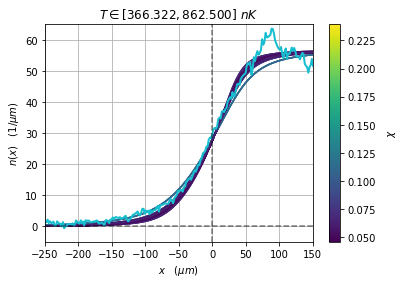

Pour le graphe chi_min = 0.0458079297648815  et chi_max = 0.1115690646449737
(64.682, 559.013) [np.float64(5.172476595384267), np.float64(0.04580792976488147)]


In [303]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize


# Création de la figure et de l'axe
fig, ax1 = plt.subplots()
ax1.set(xlabel="$x \quad (\mu m)$", ylabel="$n(x) \quad (1/\mu m)$")



colors = [
    #"#1f77b4",  # Bleu
    #"#ff7f0e",  # Orange
    #"#2ca02c",  # Vert
    #"#d62728",  # Rouge
    "#9467bd",  # Violet
    "#8c564b",  # Marron
    "#e377c2",  # Rose
    "#7f7f7f",  # Gris
    "#bcbd22",  # Jaune Olive
    "#17becf"   # Cyan
]

# Création du colormap
#norm = Normalize(vmin=min(Liste_Chi), vmax=max(Liste_Chi))
vmin, vmax = min(Liste_Chi) , max(Liste_Chi) 
vmin , vmax = 0 , 100
vmin , vmax = find_nearest_elements(Liste_Chi, vmin, vmax)
print(vmin , vmax) 

norm = Normalize(vmin=vmin, vmax=vmax)

T_ming , T_maxg = 0 ,1000

T_min , T_max = T_maxg , T_ming 

cmap = cm.viridis  # Vous pouvez changer de colormap si vous préférez
chi_min  = vmax
chi_max  = vmin

cmap = cm.viridis  # Vous pouvez changer de colormap si vous préférez
nomb = "theta_edge_1.0_ih1"
tb = "veff_bord"
# Tracé des courbes pour chaque triple
for triple , C in Chi.items():
    mu , T  = triple 
    C = C[chi_ind]
    #print (C)
    if (C  >= vmin and C  <= vmax ) and (T >= T_ming and T <= T_maxg ) :
        # Vérifier et récupérer la couleur associée
        if C < chi_min : chi_min = C
        if C > chi_max : chi_max = C

        if T < T_min : T_min = T 
        if T > T_max : T_max = T 

        color = cmap(norm(C))
    
        filename = f"{date}/density_expansion_nu_{nomb}_{mu:.3f}_{T:.3f}_{tb}.npz"
        data_s = np.load(filename)
        label = f"GHD : $ \\chi  = {C:.3f} , \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK , hydo regyme"
        ax1.plot(data_s[0, :]*Temps_deform, data_s[1, :],  color=color,  label=label)
    
    else:
        #print(f"Pas finie la simul pour le triple : {triple}")
        continue  # Passer à l'itération suivante si time_list est vide

X , Y , label = DONNEES[1]
mask = X < 10*18
ax1.plot(X[mask], Y[mask],  linewidth=2 ,  label=f"donnés du "+ date_donnees + ' : ' + label , color = "#17becf" )



ax1.set(xlabel="$x \quad (\mu m)$", ylabel="$n(x) \quad (1/\mu m)$", 
            title=f"$T \in [{T_min:.3f} , {T_max:.3f}]~nK$ ")



# Configuration des limites et des lignes supplémentaires
plt.xlim([-250 , 150 ])
plt.ylim([-5 , 65 ])
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.grid(True)

# Ajouter une colorbar
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Nécessaire pour générer la colorbar
cbar = plt.colorbar(sm, ax=ax1)
cbar.set_label("$\chi $", rotation=270, labelpad=20)

# Légende
#plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.savefig('graphique_high_res.png', dpi=300) 
plt.show()
print (f"Pour le graphe chi_min = {chi_min:.16f}  et chi_max = {chi_max:.16f}")
triplec = min(Chi, key=Chi.get)
print (triplec , Chi[triplec])

## inf (63.366, 644.287) [np.float64(4.666029229637079), np.float64(2.193316549647088)]
## 2 (62.183, 703.013) [np.float64(184.12154134075186), np.float64(24.346263796731265)]

## expansion

In [25]:
print("date :" , date)
date = '2024-04-24'
DONNEES = f_DONNEES(date) 


#parametre bord 

if date == '2024-02-09' :
    mu = None
    T = None#None
    x0 = None
    Taille = None
    Temps_exp = 50 
    
elif date == '2024-02-29' :
    mu = None
    T = None
    x0 = None
    Taille = None
    Temps_exp = 50

elif date == '2024-04-24' :
    mu = None
    T = "[559,560]"#None#None
    x0 = None#18.339#None
    Taille = None

    Temps_exp = 30


#558.939, 18.339, 22.176
nom = "theta_edge_1.0_ih2"
# Extraction des triples possibles
triples = extract_triples(date, nom, mu, T, x0, Taille)
print("Triples key possibles:", triples.keys())


date : 2024-02-29
Triples key possibles: dict_keys([(64.677, 559.424, 18.339, 22.171), (64.682, 559.042, 18.339, 22.169), (64.677, 559.431, 18.339, 22.171), (64.677, 559.424, 18.339, 22.17), (64.677, 559.427, 18.339, 22.171), (64.677, 559.421, 18.339, 22.171), (64.682, 559.036, 18.339, 22.169), (64.682, 559.039, 18.339, 22.169)])


In [26]:
print(triples)

{(64.677, 559.424, 18.339, 22.171): [0.0, 1.0, 10.0, 11.0, 20.0, 21.0, 30.0], (64.682, 559.042, 18.339, 22.169): [0.0, 1.0, 10.0, 11.0, 20.0, 21.0, 30.0], (64.677, 559.431, 18.339, 22.171): [0.0, 1.0, 10.0, 11.0, 20.0, 21.0, 30.0], (64.677, 559.424, 18.339, 22.17): [0.0, 1.0, 10.0, 11.0, 20.0, 21.0, 30.0], (64.677, 559.427, 18.339, 22.171): [0.0, 1.0, 10.0, 11.0, 20.0, 21.0, 30.0], (64.677, 559.421, 18.339, 22.171): [0.0, 1.0, 10.0, 11.0, 20.0, 21.0, 30.0], (64.682, 559.036, 18.339, 22.169): [0.0, 1.0, 10.0, 11.0, 20.0, 21.0, 30.0], (64.682, 559.039, 18.339, 22.169): [0.0, 1.0, 10.0, 11.0, 20.0, 21.0, 30.0]}


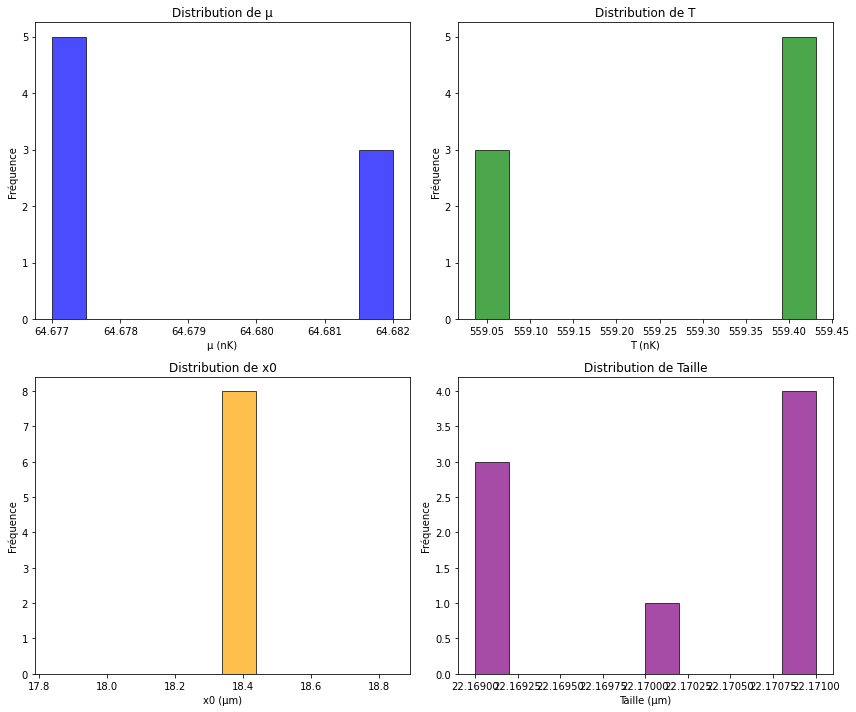

In [27]:
import matplotlib.pyplot as plt

# Exemple des listes sans doublons
Liste_mu = [triple[0] for triple in triples.keys()] 
Liste_T = [triple[1] for triple in triples.keys()] 
Liste_x0 = [triple[2] for triple in triples.keys()] 
Liste_Taille = [triple[3] for triple in triples.keys()]

# Tracer un histogramme pour chaque liste
plt.figure(figsize=(12, 10))  # Taille de la figure globale

# Histogramme pour mu
plt.subplot(2, 2, 1)  # 2 lignes, 2 colonnes, 1er subplot
plt.hist(Liste_mu, bins=10, color='blue', alpha=0.7, edgecolor='black')
plt.title("Distribution de μ")
plt.xlabel("μ (nK)")
plt.ylabel("Fréquence")

# Histogramme pour T
plt.subplot(2, 2, 2)  # 2 lignes, 2 colonnes, 2e subplot
plt.hist(Liste_T, bins=10, color='green', alpha=0.7, edgecolor='black')
plt.title("Distribution de T")
plt.xlabel("T (nK)")
plt.ylabel("Fréquence")

# Histogramme pour x0
plt.subplot(2, 2, 3)  # 2 lignes, 2 colonnes, 3e subplot
plt.hist(Liste_x0, bins=10, color='orange', alpha=0.7, edgecolor='black')
plt.title("Distribution de x0")
plt.xlabel("x0 (µm)")
plt.ylabel("Fréquence")

# Histogramme pour Taille
plt.subplot(2, 2, 4)  # 2 lignes, 2 colonnes, 4e subplot
plt.hist(Liste_Taille, bins=10, color='purple', alpha=0.7, edgecolor='black')
plt.title("Distribution de Taille")
plt.xlabel("Taille (µm)")
plt.ylabel("Fréquence")

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher les histogrammes
plt.show()


In [28]:
def verifier_quadruplet(quadruplet, liste_quadruplets):
    """
    Vérifie si un quadruplet (mu, T, x0, Taille) correspond à un élément dans une liste.
    Si un élément du quadruplet est None, il est considéré comme un joker (wildcard).

    :param quadruplet: Tuple (mu, T, x0, Taille) à vérifier.
    :param liste_quadruplets: Liste des quadruplets disponibles.
    :return: True si une correspondance est trouvée, False sinon.
    """
    for element in liste_quadruplets:
        correspondance = True
        for i in range(4):  # Vérifie les 4 éléments (indices 0 à 3)
            if quadruplet[i] is not None and quadruplet[i] != element[i]:
                correspondance = False
                break
        if correspondance:
            return True
    return False


# Exemple d'utilisation
liste_quadruplets = [
    (10, 20, 30, 40),
    (10, 1000, 30, 40),
    (15, 25, 35, 45),
    (None, 20, 30, None),
    (50, 60, 70, 80)
]

# Vérifications
quadruplet_1 = (10, 20, 30, 40)  # Correspond exactement
quadruplet_2 = (10, None, 30, None)  # Correspond car joker pour T et Taille
quadruplet_3 = (50, 60, None, None)  # Correspond car joker pour x0 et Taille
quadruplet_4 = (100, 200, 300, 400)  # Ne correspond pas

print(verifier_quadruplet(quadruplet_1, liste_quadruplets))  # True
print(verifier_quadruplet(quadruplet_2, liste_quadruplets))  # True
print(verifier_quadruplet(quadruplet_3, liste_quadruplets))  # True
print(verifier_quadruplet(quadruplet_4, liste_quadruplets))  # False


True
True
True
False


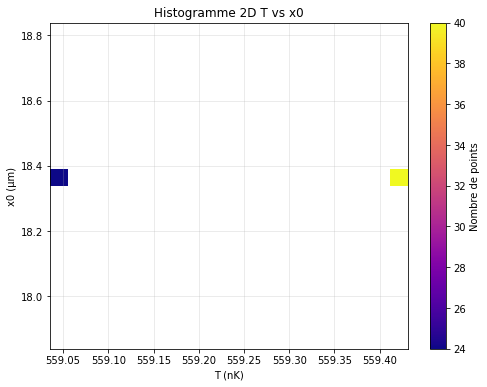

In [29]:
import matplotlib.pyplot as plt
import numpy as np

# Extraire les listes pour chaque paramètre
Liste_mu = [triple[0] for triple in triples.keys()]
Liste_T = [triple[1] for triple in triples.keys()]
Liste_x0 = [triple[2] for triple in triples.keys()]
Liste_Taille = [triple[3] for triple in triples.keys()]


# Fonction pour tracer un histogramme 2D
def plot_2d_histogram(param_x, param_y, mode_x, mode_y, bins=20, cmap='viridis'):
    # Initialisation des données filtrées
    param_x_h, param_y_h = [], []

    # Définition des modes et labels
    mode = {'mu': 0, 'T': 1, 'x0': 2, 'Taille': 3}
    labels = {'mu': "μ (nK)", 'T': "T (nK)", 'x0': "x0 (µm)", 'Taille': "ℓ (µm)"}
    titres = {'mu': "μ", 'T': "T", 'x0': "x0", 'Taille': "ℓ"}
    titre = f"Histogramme 2D {titres[mode_x]} vs {titres[mode_y]}"

    # Filtrer les données correspondant à des triples existants
    for x in param_x:
        for y in param_y:
            liste_parm = [None, None, None, None]
            liste_parm[mode[mode_x]] = x
            liste_parm[mode[mode_y]] = y
            mu_h, T_h, x0_h, Taille_h = liste_parm

            if verifier_quadruplet((mu_h, T_h, x0_h, Taille_h), triples.keys()):  # Vérifier si des triples existent
                param_x_h.append(x)
                param_y_h.append(y)

    # Tracer l'histogramme 2D avec les données filtrées
    plt.figure(figsize=(8, 6))
    plt.hist2d(param_x_h, param_y_h, bins=bins, cmap=cmap, cmin=1)  # cmin=1 pour ignorer les zéros
    plt.colorbar(label="Nombre de points")  # Barre de couleur
    plt.title(titre)
    plt.xlabel(labels[mode_x])
    plt.ylabel(labels[mode_y])
    plt.grid(alpha=0.3)
    plt.show()


# Exemple : Tracer un histogramme 2D entre μ et T
#plot_2d_histogram(
#    param_x=Liste_mu,
#    param_y=Liste_T,
#    mode_x='mu',
#   mode_y='T',
#    bins=20,
#    cmap='plasma'
#)

# Exemple : Tracer un histogramme 2D entre x0 et Taille
#plot_2d_histogram(
#    param_x=Liste_x0,
#    param_y=Liste_Taille,
#    mode_x='x0',
#    mode_y='Taille',
#    bins=20,
#    cmap='plasma'
#)

plot_2d_histogram(
    param_x=Liste_T,
    param_y=Liste_x0,
    mode_x='T',
    mode_y='x0',
    bins=20,
    cmap='plasma'
)


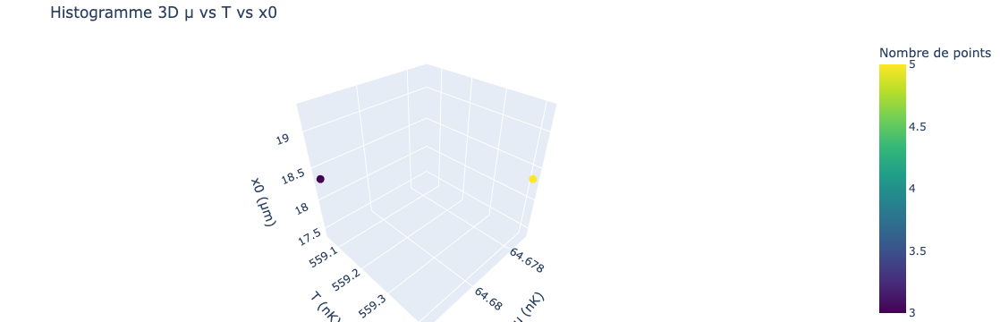

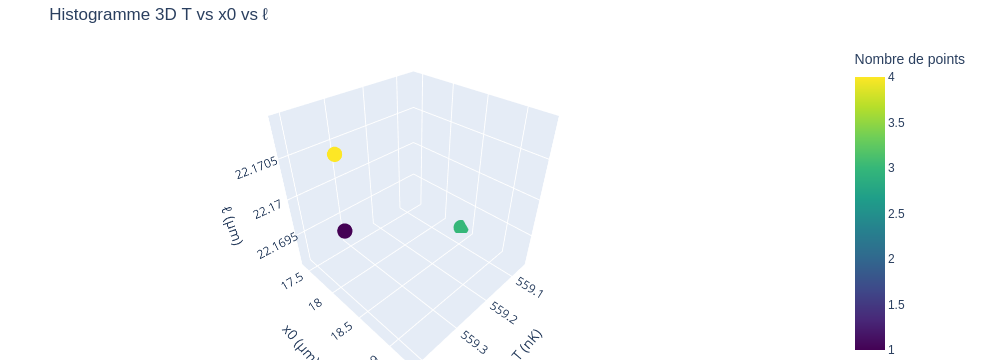

In [30]:
import plotly.graph_objects as go
import numpy as np

# Extraire les listes pour chaque paramètre
Liste_mu = [triple[0] for triple in triples.keys()]
Liste_T = [triple[1] for triple in triples.keys()]
Liste_x0 = [triple[2] for triple in triples.keys()]
Liste_Taille = [triple[3] for triple in triples.keys()]

# Fonction pour tracer un histogramme 3D
def plot_3d_histogram(param_x, param_y, param_z, mode_x, mode_y, mode_z, bins=10):
    """
    Tracer un histogramme 3D interactif avec Plotly.
    """
    mode = {'mu': 0, 'T': 1, 'x0': 2, 'Taille': 3}
    labels = {'mu': "μ (nK)", 'T': "T (nK)", 'x0': "x0 (µm)", 'Taille': "ℓ (µm)"}
    titres = {'mu': "μ", 'T': "T", 'x0': "x0", 'Taille': "ℓ"}

    # Création des bins pour chaque axe
    x_bins = np.linspace(min(param_x), max(param_x), bins + 1)
    y_bins = np.linspace(min(param_y), max(param_y), bins + 1)
    z_bins = np.linspace(min(param_z), max(param_z), bins + 1)

    # Comptage des données dans chaque bin
    hist, edges = np.histogramdd((param_x, param_y, param_z), bins=(x_bins, y_bins, z_bins))

    # Préparer les centres des bins pour le tracé 3D
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    y_centers = (y_bins[:-1] + y_bins[1:]) / 2
    z_centers = (z_bins[:-1] + z_bins[1:]) / 2

    # Générer les coordonnées 3D des points
    x, y, z = np.meshgrid(x_centers, y_centers, z_centers, indexing="ij")
    x, y, z = x.ravel(), y.ravel(), z.ravel()

    # Intensité des points (valeurs de l'histogramme)
    intensities = hist.ravel()

    # Filtrer pour afficher uniquement les points non nuls
    mask = intensities > 0
    x, y, z, intensities = x[mask], y[mask], z[mask], intensities[mask]

    # Création de la figure 3D avec Plotly
    fig = go.Figure(data=[go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers',
        marker=dict(
            size=5,
            color=intensities,
            colorscale='Viridis',
            showscale=True,
            colorbar=dict(title="Nombre de points")
        )
    )])

    # Mise en forme des axes et titre
    fig.update_layout(
        title=f"Histogramme 3D {titres[mode_x]} vs {titres[mode_y]} vs {titres[mode_z]}",
        scene=dict(
            xaxis=dict(title=labels[mode_x]),
            yaxis=dict(title=labels[mode_y]),
            zaxis=dict(title=labels[mode_z])
        ),
        margin=dict(l=0, r=0, b=0, t=40)
    )

    fig.show()


# Exemple : Tracer un histogramme 3D entre μ, T, et x0
plot_3d_histogram(
    param_x=Liste_mu,
    param_y=Liste_T,
    param_z=Liste_x0,
    mode_x='mu',
    mode_y='T',
    mode_z='x0',
    bins=10
)

# Exemple : Tracer un histogramme 3D entre T, x0, et Taille
plot_3d_histogram(
    param_x=Liste_T,
    param_y=Liste_x0,
    param_z=Liste_Taille,
    mode_x='T',
    mode_y='x0',
    mode_z='Taille',
    bins=10
)


In [31]:
# Extraction des paramètres uniques à partir des clés des triples
Liste_mu = sorted(set(triple[0] for triple in triples.keys())) 
Liste_T = sorted(set(triple[1] for triple in triples.keys())) 
Liste_x0 = sorted(set(triple[2] for triple in triples.keys())) 
Liste_Taille = sorted(set(triple[3] for triple in triples.keys()))

# Affichage des listes triées sans doublons
print("Les mu sont :", Liste_mu)
print("Les T sont :", Liste_T)
print("Les x0 sont :", Liste_x0)
print("Les tailles sont :", Liste_Taille)



Les mu sont : [64.677, 64.682]
Les T sont : [559.036, 559.039, 559.042, 559.421, 559.424, 559.427, 559.431]
Les x0 sont : [18.339]
Les tailles sont : [22.169, 22.17, 22.171]


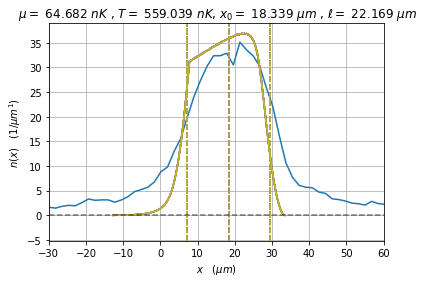

In [32]:
fig, ax1 = plt.subplots()
ax1.set(xlabel="$x \quad (\mu m)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $")
X , Y , label = DONNEES[2]
ax1.plot(X, Y, label=label)
    
for triple , liste_t in triples.items():
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    mu, T, x00, Taille = triple
    ax1.set(xlabel="$x \quad (\mu m)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$, $x_0 =$ {x00:.3f} $\mu m$ , $\\ell =$ {Taille:.3f} $\mu m$")
    time_list = [max(liste_t)]
    time_list = sorted(list(liste_t))[-10:]
    mask = ((np.array(list(liste_t))< max(liste_t)+1)*(np.array(list(liste_t))> max(liste_t)-1))+(np.array(list(liste_t))==0)
    mask = np.isin(np.array(liste_t), [1]) #+ (np.array(list(liste_t)) == 30)
    time_list = sorted(np.array(list(liste_t))[mask])
    #time_list = sorted(np.array(list(liste_t))[-1])
    #plot_graph3(date, nom, triple, time_list , DONNEES)
    for t in time_list:
        filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
        data_s = np.load(filename) 
        X_simul = data_s[0, :] 
        if t > -1 and 1 == 0: 
            if date_donnees == '2024-02-09': t2  = 50
            elif date_donnees == '2024-02-29': t2 = 50
            elif date_donnees == '2024-04-24': t2 = 30
            else: t2 = time_list[-1]
            label = f"$\\rho$, $n$, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK,  $x_0 =$ {x00:.3f} $\mu m$, $\\ell$ = {Taille:.3f} $\\mu$m, $\\tau$ = {t:.3f} $m$s"
            line, = ax1.plot(X_simul * Taille / t * t2, data_s[1, :] * t / t2, label=label)
        else:
            label = f"GHD: $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0 =$ {x00:.3f} $\mu m$, $\\ell$ = {Taille:.3f} $\\mu$m, $\\tau$ = {t:.3f} $m$s"
            line, = ax1.plot(X_simul * Taille, data_s[1, :], label=label)
        
        # Obtenir la couleur de la ligne tracée
        line_color = line.get_color()
        
        # Ajouter les trois barres verticales
        ax1.axvline(x=x00, linestyle='--', color=line_color, alpha=0.7)#, label=f"Barre à $x_0$ = {x00:.3f}")
        ax1.axvline(x=x00 - Taille / 2, linestyle='--', color=line_color)#, alpha=0.7, label=f"Barre à $x_0 - \\ell/2$")
        ax1.axvline(x=x00 + Taille / 2, linestyle='--', color=line_color)#, alpha=0.7, label=f"Barre à $x_0 + \\ell/2$")
plt.xlim([-30 , 60 ])
#plt.axvline(x=x0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.grid(True)
#plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.show()

NameError: name 'find_nearest_elements' is not defined

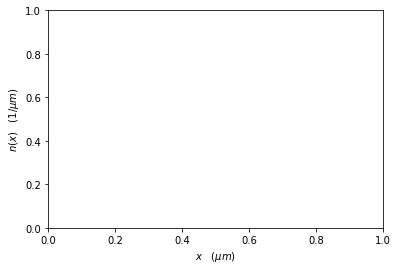

In [33]:
## variable T

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize

# Création de la figure et de l'axe
fig, ax1 = plt.subplots()
ax1.set(xlabel="$x \quad (\mu m)$", ylabel="$n(x) \quad (1/\mu m)$")



colors = [
    #"#1f77b4",  # Bleu
    #"#ff7f0e",  # Orange
    #"#2ca02c",  # Vert
    #"#d62728",  # Rouge
    "#9467bd",  # Violet
    "#8c564b",  # Marron
    "#e377c2",  # Rose
    "#7f7f7f",  # Gris
    "#bcbd22",  # Jaune Olive
    "#17becf"   # Cyan
]

# Création du colormap

#norm = Normalize(vmin=min(triple[1] for triple in triples.keys()), vmax=max(triple[1] for triple in triples.keys()))
Liste_T = [triple[1] for triple in triples.keys()] 
vmin, vmax = min(Liste_T) , max(Liste_T) 
vmin , vmax = 300 , 1600
vmin , vmax = find_nearest_elements(Liste_T, vmin, vmax)

norm = Normalize(vmin=vmin, vmax=vmax)
cmap = cm.viridis  # Vous pouvez changer de colormap si vous préférez
tb = "veff_bord"
nomb = "theta_edge_1.0_ih1"
# Tracé des courbes pour chaque triple
for triple, liste_t in triples.items():
    mu, T, x00, Taille = triple

    if (T >= vmin and T <= vmax ) :
        color = cmap(norm(T))  # Couleur associée à la valeur de T
    
        filename = f"{date}/density_expansion_nu_{nomb}_{mu:.3f}_{T:.3f}_{tb}.npz"
        data_s = np.load(filename)
        label = f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK , hydo regyme"
        ax1.plot(data_s[0, :]*Temps_deform, data_s[1, :],  color=color)# label=label)
    
        
        time_list = sorted(list(liste_t))[-10:]
        mask = np.isin(np.array(liste_t), [0 , 1])
        time_list = sorted(np.array(list(liste_t))[mask])
    
        for t in time_list:
            filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
            data_s = np.load(filename)
            X_simul = data_s[0, :]
            
            if t > -1 and 1 == 0:
                label = f"$\\rho$, $n$, $\\mu = {mu:.3f}$ nK, $T = {T:.3f}$ nK, $x_0 = {x00:.3f}$ $\\mu$m, $\\ell = {Taille:.3f}$ $\\mu$m, $\\tau = {t:.3f}$ ms"
                line, = ax1.plot(X_simul * Taille / t * t2, data_s[1, :] * t / t2, label=label, color=color)
            else:
                label = f"GHD: $\\mu = {mu:.3f}$ nK, $T = {T:.3f}$ nK, $x_0 = {x00:.3f}$ $\\mu$m, $\\ell = {Taille:.3f}$ $\\mu$m, $\\tau = {t:.3f}$ ms"
                line, = ax1.plot(X_simul * Taille, data_s[1, :],  color=color) #label=label,
    
            # Ajouter les barres verticales
            #ax1.axvline(x=x00, linestyle='--', color=color, alpha=0.7)
            #ax1.axvline(x=x00 - Taille / 2, linestyle='--', color=color, alpha=0.7)
            #ax1.axvline(x=x00 + Taille / 2, linestyle='--', color=color, alpha=0.7)

X , Y , label = DONNEES[1]
mask = X < 7*Temps_deform
ax1.plot(X[mask], Y[mask],  linewidth=2 ,  label=f"donnés du "+ date_donnees + ' : ' + label , color = "#17becf" )

if date == "2024-02-09" :
    mub , Tb = 55.722, 406.356
elif date == "2024-02-29" :
    mub , Tb = 56.064, 965.89
elif date == "2024-04-24" :
    mub , Tb = 64.683, 558.939


filename = f"{date}/density_expansion_nu_{nomb}_{mub:.3f}_{Tb:.3f}_{tb}.npz"
data_s = np.load(filename) 
color = cmap(norm(Tb))
ax1.plot(data_s[0, :]*Temps_deform, data_s[1, :] , linewidth=2 , color = color, label=f"GHD : $\\mu$ = {mub:.3f} nK, $T$ = {Tb:.3f} nK , hydo regyme")

ax1.set(
    xlabel="$x \quad (\mu m)$", 
    ylabel="$n(x) \quad (1/\mu m)$"
)
ax1.set_title(
    f"$\\mu = {mub:.3f} \\text{{ nK}}, T = {Tb:.3f} \\text{{ nK}}, x_0 = {x00:.3f} \\mu \\text{{m}}, \\ell = {Taille:.3f} \\mu \\text{{m}}$", 
    color=color
)
ax1.set_title(
    f"$ x_0 = {x00:.3f} ~\\mu \\text{{m}}$", 
    color=color
)
# Initialisation des données
X , Y , label = DONNEES[2]
mask = (X < 70*18)*(X>-50*18)
ax1.plot(X[mask], Y[mask], color='#1f77b4'  , linewidth=2 , label=f"donnés du "+ date_donnees + ' : ' + label )

ax1.axvline(x=x00, linestyle='--', color=color, alpha=0.7)
# Configuration des limites et des lignes supplémentaires
plt.xlim([-50 , 50 ])
plt.ylim([-5 , 45 ])
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.grid(True)

# Ajouter une colorbar
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Nécessaire pour générer la colorbar
cbar = plt.colorbar(sm, ax=ax1)
cbar.set_label("$T \quad (nK)$", rotation=270, labelpad=20)

# Légende
#plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.savefig('graphique_high_res.png', dpi=300) 
plt.show()


In [ ]:
## variable x0 

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize

# Création de la figure et de l'axe
fig, ax1 = plt.subplots()
ax1.set(xlabel="$x \quad (\mu m)$", ylabel="$n(x) \quad (1/\mu m)$")



colors = [
    #"#1f77b4",  # Bleu
    #"#ff7f0e",  # Orange
    #"#2ca02c",  # Vert
    #"#d62728",  # Rouge
    "#9467bd",  # Violet
    "#8c564b",  # Marron
    "#e377c2",  # Rose
    "#7f7f7f",  # Gris
    "#bcbd22",  # Jaune Olive
    "#17becf"   # Cyan
]

# Création du colormap
#norm = Normalize(vmin=min(triple[2] for triple in triples.keys()), vmax=max(triple[2] for triple in triples.keys()))
Liste_x0 = [triple[2] for triple in triples.keys()] 
vmin, vmax = min(Liste_x0) , max(Liste_x0) 
vmin , vmax = 0 , 20
vmin , vmax = find_nearest_elements(Liste_x0, vmin, vmax)

norm = Normalize(vmin=vmin, vmax=vmax)

cmap = cm.viridis  # Vous pouvez changer de colormap si vous préférez

# Tracé des courbes pour chaque triple
for triple, liste_t in triples.items():
    mu, T, x00, Taille = triple

    if (x00 >= vmin and x00 <= vmax ) :
    
        color = cmap(norm(x00))  # Couleur associée à la valeur de T
    
        #filename = f"{date}/density_expansion_nu_{nomb}_{mu:.3f}_{T:.3f}_{tb}.npz"
        #data_s = np.load(filename)
        #label = f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK , hydo regyme"
        #ax1.plot(data_s[0, :]*18, data_s[1, :],  color=color)# label=label)
    
        
        time_list = sorted(list(liste_t))[-10:]
        mask = np.isin(np.array(liste_t), [0 ])
        time_list = sorted(np.array(list(liste_t))[mask])
    
        for t in time_list:
            filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
            data_s = np.load(filename)
            X_simul = data_s[0, :]
            
            if t > -1 and 1 == 0:
                label = f"$\\rho$, $n$, $\\mu = {mu:.3f}$ nK, $T = {T:.3f}$ nK, $x_0 = {x00:.3f}$ $\\mu$m, $\\ell = {Taille:.3f}$ $\\mu$m, $\\tau = {t:.3f}$ ms"
                line, = ax1.plot(X_simul * Taille / t * t2, data_s[1, :] * t / t2, label=label, color=color)
            else:
                label = f"GHD: $\\mu = {mu:.3f}$ nK, $T = {T:.3f}$ nK, $x_0 = {x00:.3f}$ $\\mu$m, $\\ell = {Taille:.3f}$ $\\mu$m, $\\tau = {t:.3f}$ ms"
                line, = ax1.plot(X_simul * Taille, data_s[1, :],  color=color) #label=label,
    
            # Ajouter les barres verticales
            ax1.axvline(x=x00, linestyle='--', color=color, alpha=0.7)
            #ax1.axvline(x=x00 - Taille / 2, linestyle='--', color=color, alpha=0.7)
            #ax1.axvline(x=x00 + Taille / 2, linestyle='--', color=color, alpha=0.7)

X , Y , label = DONNEES[1]
mask = X < 7*Temps_deform
ax1.plot(X[mask], Y[mask],  linewidth=2 ,  label=f"donnés du "+ date_donnees + ' : ' + label , color = "#17becf" )

tb = "veff_bord"
nomb = "theta_edge_1.0_ih1"
filename = f"{date}/density_expansion_nu_{nomb}_{mub:.3f}_{Tb:.3f}_{tb}.npz"
data_s = np.load(filename) 
color = '#ff7f0e'
ax1.plot(data_s[0, :]*18, data_s[1, :] , linewidth=2 , color = color, label=f"GHD : $\\mu$ = {mub:.3f} nK, $T$ = {Tb:.3f} nK , hydo regyme")

ax1.set(
    xlabel="$x \quad (\mu m)$", 
    ylabel="$n(x) \quad (1/\mu m)$"
)
ax1.set_title(
    f"$ x_0 = {x00:.3f} \\mu \\text{{m}}, \\ell = {Taille:.3f} \\mu \\text{{m}}$", 
    color=color
)
ax1.set_title(
    f"$\\mu = {mub:.3f} ~\\text{{ nK}}, T = {Tb:.3f}~ \\text{{ nK}}$", 
    color=color
)
# Initialisation des données
X , Y , label = DONNEES[2]
mask = (X < 70*Temps_deform)*(X>-50*Temps_deform)
ax1.plot(X[mask], Y[mask], color='#1f77b4'  , linewidth=2 , label=f"donnés du "+ date_donnees + ' : ' + label )


# Configuration des limites et des lignes supplémentaires
plt.xlim([-50 , 50 ])
plt.ylim([-5 , 45 ])
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.grid(True)

# Ajouter une colorbar
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Nécessaire pour générer la colorbar
cbar = plt.colorbar(sm, ax=ax1)
cbar.set_label("$x_0 \quad (\mu m)$", rotation=270, labelpad=20)

# Légende
#plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.savefig('graphique_high_res.png', dpi=300) 
plt.show()


In [34]:
# Initialiser un dictionnaire pour stocker les données
Chi = {}

# Créer un tableau pour stocker les lignes du fichier CSV
data = []
p_norme = 2 
print(p_norme , plot_flag )

#print("Triples key possibles:", triples.keys())

# Exemple de boucle pour traiter les différentes combinaisons de T et x0
for triple , liste_t in triples.items():

    #print ("triple :" , triple) 

    liste_t = triples[triple]
    

    mu, T, x00, Taille = triple
    mask = np.isin(np.array(liste_t), [Temps_exp])
    time_list = sorted(np.array(list(liste_t))[mask])
    #print(liste_t , time_list)
    
    
    try:
        t = time_list[0]
        filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
        #print ("filename :" , filename) 
        data_s = np.load(filename)
        X, Y, label = DONNEES[-1]

        if date_donnees == '2024-02-09': mask = (X > -180) & (X < 10)
        elif date_donnees == '2024-02-29': mask = (X > -250) & (X < 25)
        elif date_donnees == '2024-04-24': mask = X < 100 #(X > -110) & (X < 50)
        #else: mask = np.ones_like(X, dtype=bool)  # Par défaut, utiliser toutes les données
    
        # Calcul de chi²
        window_size = 20
        y_smoothed = np.convolve(Y, np.ones(window_size)/window_size, mode='same')
        if not( x00 == 5.373 and Taille == 42.48) :
            #Chi[triple] = calculate_chi_square(X[mask], y_smoothed[mask], data_s[0, :] * Taille, data_s[1, :])
            #Chi[triple] = calculate_max_epsilon_with_plot(X, Y, data_s[0, :] * Taille, data_s[1, :])
            #Chi[triple] = calculate_max_epsilon_with_plot(X[mask], y_smoothed[mask], data_s[0, :] * Taille, data_s[1, :])
            Chi[triple] = calculate_chi_2_max(X[mask], y_smoothed[mask], data_s[0, :] * Taille, data_s[1, :] , p_norme , plot_flag )
            # Ajouter les données pour le fichier CSV
            data.append([T, x00, Chi[triple]])

    except IndexError:
        print(f"Pas finie la simul pour le triple : {triple}")
        continue  # Passer à l'itération suivante si time_list est vide

#Liste_Chi = [chi for triple, chi in Chi.items()]
Liste_Chi = list(Chi.values())
Liste_Chi = [sublist[chi_ind] for sublist in Chi.values()]
print("Liste_Chi" , Liste_Chi )

print ( "Chi :" , Chi)

#print ( "Chi :" , Chi)


# Convertir les données en DataFrame
#df = pd.DataFrame(data, columns=['T', 'x0', 'Sum'])

# Variables d'exemple
#date_analyse = datetime.now().strftime('%Y-%m-%d-%H-%M-%S')  # La date actuelle sous le format souhaité
#mode = 'T-x0-liste-tout'

# Créer le chemin du fichier
#filename = os.path.join(directory, f"Optimisation_{mode}_{date_analyse}.csv")
#print ("filename :" , filename)

# Sauvegarder les données dans un fichier CSV
#df.to_csv(filename, index=False)

# Afficher un aperçu des 5 premières lignes
#print("Aperçu des 5 premières lignes :")
#print(df.head())

NameError: name 'plot_flag' is not defined

1


ValueError: min() arg is an empty sequence

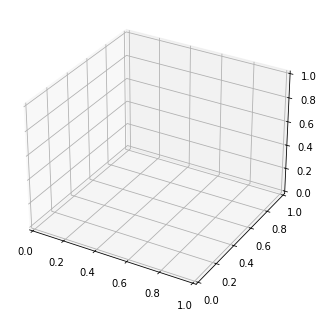

In [35]:
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Extraction des données (T, x0, Chi)
T_values = []
x0_values = []
Chi_values = []
chi_ind = 1 
print (chi_ind)
for triple, chi in Chi.items():
    mu, T, x0, Taille = triple
    T_values.append(T)
    x0_values.append(x0)
    Chi_values.append(chi[chi_ind])

T_values = np.array(T_values)
x0_values = np.array(x0_values)
Chi_values = np.array(Chi_values)

# Création de la figure 3D
fig = plt.figure(figsize=(15, 12))

# Graphe 3D : Chi(T, x0)
ax1 = fig.add_subplot(221, projection='3d')
scatter = ax1.scatter(T_values, x0_values, Chi_values, c=Chi_values, cmap='viridis')
# Projection sur le plan zdir='z' (sur le plan X-Y)
ax1.scatter(T_values, x0_values, np.full_like(Chi_values, min(Chi_values)), c=Chi_values, cmap=cm.coolwarm, marker='x')

# Projection sur le plan zdir='x' (projections des points sur le plan Y-Z)
ax1.scatter(np.full_like(Chi_values, min(T_values)), x0_values, Chi_values, c=Chi_values, cmap=cm.coolwarm, marker='o')

# Projection sur le plan zdir='y' (projections des points sur le plan X-Z)
ax1.scatter(T_values, np.full_like(Chi_values, max(x0_values)), Chi_values, c=Chi_values, cmap=cm.coolwarm, marker='^')


# Ajouter une barre de couleur
cbar = plt.colorbar(scatter, ax=ax1, shrink=0.5, aspect=10)
cbar.set_label(r'$\chi^2$', fontsize=12)

# Labels des axes
ax1.set_xlabel(r'$T$', fontsize=14)
ax1.set_ylabel(r'$x_0$', fontsize=14)
ax1.set_zlabel(r'$\chi^2$', fontsize=14)

# Titre
ax1.set_title(r'Tracé 3D de $\chi^2(T, x_0)$', fontsize=16)

# Projection Chi(T)
ax2 = fig.add_subplot(222)
ax2.scatter(T_values, Chi_values, c=Chi_values, cmap='viridis', edgecolor='k')
ax2.set_xlabel(r'$T$', fontsize=14)
ax2.set_ylabel(r'$\chi^2$', fontsize=14)
ax2.set_title(r'Projection : $\chi^2(T)$', fontsize=16)

# Projection Chi(x0)
ax3 = fig.add_subplot(223)
ax3.scatter(x0_values, Chi_values, c=Chi_values, cmap='viridis', edgecolor='k')
ax3.set_xlabel(r'$x_0$', fontsize=14)
ax3.set_ylabel(r'$\chi^2$', fontsize=14)
ax3.set_title(r'Projection : $\chi^2(x_0)$', fontsize=16)

# Ajustement de l'espace
plt.tight_layout()
plt.show()

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d
from matplotlib import cm
from scipy.interpolate import griddata

# Extraction des données
T_values = []
x0_values = []
Chi_values = []

for triple, chi in Chi.items():
    mu, T, x0, Taille = triple
    T_values.append(T)
    x0_values.append(x0)
    Chi_values.append(chi)

T_values = np.array(T_values)
x0_values = np.array(x0_values)
Chi_values = np.array(Chi_values)

# Création de la grille pour l'interpolation
grid_T, grid_x0 = np.meshgrid(np.linspace(T_values.min(), T_values.max(), 100),
                               np.linspace(x0_values.min(), x0_values.max(), 100))

# Interpolation des valeurs de chi^2
grid_Chi = griddata((T_values, x0_values), Chi_values, (grid_T, grid_x0), method='cubic')

# Création de la figure
fig = plt.figure(figsize=(18, 12))
ax = fig.add_subplot(111, projection='3d')

# Tracé de la surface 3D
ax.plot_surface(grid_T, grid_x0, grid_Chi, rstride=8, cstride=8, alpha=0.6, cmap='viridis')

# Ajout des projections
cset = ax.contour(grid_T, grid_x0, grid_Chi, zdir='z', offset=-100, cmap=cm.coolwarm)
cset = ax.contour(grid_T, grid_x0, grid_Chi, zdir='x', offset=min(T_values), cmap=cm.coolwarm)
cset = ax.contour(grid_T, grid_x0, grid_Chi, zdir='y', offset=max(x0_values), cmap=cm.coolwarm)

# Paramètres des axes
ax.set_xlabel(r'$T$', fontsize=14)
ax.set_ylabel(r'$x_0$', fontsize=14)
ax.set_zlabel(r'$\chi^2$', fontsize=14)

# Affichage de la figure
plt.show()



In [36]:
import numpy as np
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Extraction des données (T, x0, Chi)
T_values = []
x0_values = []
Chi_values = []

for triple, chi in Chi.items():
    mu, T, x0, Taille = triple
    T_values.append(T)
    x0_values.append(x0)
    Chi_values.append(chi[chi_ind])

T_values = np.array(T_values)
x0_values = np.array(x0_values)
Chi_values = np.array(Chi_values)

# Création de la grille pour l'interpolation
grid_T, grid_x0 = np.meshgrid(
    np.linspace(T_values.min(), T_values.max(), 100),
    np.linspace(x0_values.min(), x0_values.max(), 100)
)

# Interpolation des valeurs de Chi^2
grid_Chi = griddata(
    (T_values, x0_values), Chi_values, (grid_T, grid_x0), method='cubic'
)

# Création du graphique interactif avec Plotly
fig = go.Figure()

# Ajout de la surface 3D
fig.add_trace(go.Surface(
    z=grid_Chi,
    x=grid_T,
    y=grid_x0,
    colorscale='Viridis',
    colorbar_title="χ²"
))

# Ajout des points originaux (scatter)
fig.add_trace(go.Scatter3d(
    x=T_values,
    y=x0_values,
    z=Chi_values,
    mode='markers',
    marker=dict(
        size=5,
        color=Chi_values,
        colorscale='Viridis',
        showscale=True
    ),
    name='Points originaux'
))

# Paramètres des axes
fig.update_layout(
    scene=dict(
        xaxis_title="T",
        yaxis_title="x₀",
        zaxis_title="χ²",
    ),
    title="Tracé interactif 3D de χ²(T, x₀)",
    margin=dict(l=0, r=0, b=0, t=40)
)

# Afficher le graphique
fig.show()

# Projections : Chi(T) et Chi(x0)
# Projection Chi(T)
fig_T = go.Figure()
fig_T.add_trace(go.Scatter(
    x=T_values,
    y=Chi_values,
    mode='markers',
    marker=dict(color=Chi_values, colorscale='Viridis'),
    name="Projection : χ²(T)"
))
fig_T.update_layout(
    title="Projection : χ²(T)",
    xaxis_title="T",
    yaxis_title="χ²"
)
fig_T.show()

# Projection Chi(x0)
fig_x0 = go.Figure()
fig_x0.add_trace(go.Scatter(
    x=x0_values,
    y=Chi_values,
    mode='markers',
    marker=dict(color=Chi_values, colorscale='Viridis'),
    name="Projection : χ²(x₀)"
))
fig_x0.update_layout(
    title="Projection : χ²(x₀)",
    xaxis_title="x₀",
    yaxis_title="χ²"
)
fig_x0.show()


ValueError: zero-size array to reduction operation minimum which has no identity

In [37]:
import plotly.graph_objects as go
import numpy as np
from scipy.interpolate import griddata

# Extraction des données
T_values = []
x0_values = []
Chi_values = []

for triple, chi in Chi.items():
    mu, T, x0, Taille = triple
    T_values.append(T)
    x0_values.append(x0)
    Chi_values.append(chi[chi_ind])

T_values = np.array(T_values)
x0_values = np.array(x0_values)
Chi_values = np.array(Chi_values)

# Création de la grille pour l'interpolation
grid_T, grid_x0 = np.meshgrid(np.linspace(T_values.min(), T_values.max(), 100),
                               np.linspace(x0_values.min(), x0_values.max(), 100))

# Interpolation des valeurs de chi^2
grid_Chi = griddata((T_values, x0_values), Chi_values, (grid_T, grid_x0), method='cubic')

# Création de la figure
fig = go.Figure()

# Surface 3D
fig.add_trace(go.Surface(z=grid_Chi, x=grid_T, y=grid_x0, colorscale='viridis', opacity=0.6))

# Projections des contours sur les axes
fig.add_trace(go.Contour(
    z=grid_Chi[:, 0],  # Projection sur le plan Y-Z
    x=grid_T[:, 0],    # Utilise la première colonne (valeurs fixes de x0)
    colorscale='viridis',  # Utilisation de 'viridis' ici pour tester
    showscale=False,
    contours_coloring="lines"
))

fig.add_trace(go.Contour(
    z=grid_Chi[0, :],  # Projection sur le plan X-Z
    y=grid_x0[0, :],   # Utilise la première ligne (valeurs fixes de T)
    colorscale='viridis',
    showscale=False,
    contours_coloring="lines"
))

fig.add_trace(go.Contour(
    z=grid_Chi[:, -1],  # Projection sur le plan X-Y
    y=grid_T[:, -1],    # Utilise la dernière colonne (valeurs fixes de x0)
    colorscale='viridis',
    showscale=False,
    contours_coloring="lines"
))

# Paramètres des axes
fig.update_layout(
    scene=dict(
        xaxis_title=r'$T$',
        yaxis_title=r'$x_0$',
        zaxis_title=r'$\chi^2$'
    ),
    width=1200,
    height=800
)

# Affichage de la figure
fig.show()


ValueError: zero-size array to reduction operation minimum which has no identity

In [38]:
import numpy as np
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Extraction des données (T, x0, Chi)
T_values = []
x0_values = []
Chi_values = []

for triple, chi in Chi.items():
    mu, T, x0, Taille = triple
    T_values.append(T)
    x0_values.append(x0)
    Chi_values.append(chi[chi_ind])

T_values = np.array(T_values)
x0_values = np.array(x0_values)
Chi_values = np.array(Chi_values)

# Vérifications des données
assert not np.any(np.isnan(T_values)), "T_values contient des NaN."
assert not np.any(np.isnan(x0_values)), "x0_values contient des NaN."
assert not np.any(np.isnan(Chi_values)), "Chi_values contient des NaN."

# Création de la grille pour l'interpolation
grid_T, grid_x0 = np.meshgrid(
    np.linspace(T_values.min(), T_values.max(), 100),
    np.linspace(x0_values.min(), x0_values.max(), 100)
)

# Interpolation des valeurs de Chi^2
grid_Chi = griddata(
    (T_values, x0_values), Chi_values, (grid_T, grid_x0), method='cubic'
)

# Remplacez les NaN par une valeur par défaut
grid_Chi = np.nan_to_num(grid_Chi, nan=0.0)

# Graphique 1 : Nuage de points (scatter plot)
fig_scatter = go.Figure()
fig_scatter.add_trace(go.Scatter3d(
    x=T_values,
    y=x0_values,
    z=Chi_values,
    mode='markers',
    marker=dict(
        size=6,
        color=Chi_values,
        colorscale='Viridis',
        showscale=True,
        opacity=0.8
    ),
    name='Nuage de points'
))
fig_scatter.update_layout(
    scene=dict(
        xaxis_title="T",
        yaxis_title="x₀",
        zaxis_title="χ²"
    ),
    title="Nuage de points 3D : χ²(T, x₀)",
    margin=dict(l=0, r=0, b=0, t=40)
)
fig_scatter.show()

# Graphique 2 : Surface avec projections et contours
fig_surface = go.Figure()

# Surface 3D
fig_surface.add_trace(go.Surface(
    z=grid_Chi,
    x=grid_T,
    y=grid_x0,
    colorscale='Viridis',
    colorbar_title="χ²",
    opacity=0.8
))

# Paramètres des axes
fig_surface.update_layout(
    scene=dict(
        xaxis_title="T",
        yaxis_title="x₀",
        zaxis_title="χ²",
    ),
    title="Surface avec projections et contours",
    margin=dict(l=0, r=0, b=0, t=40)
)
fig_surface.show()


ValueError: zero-size array to reduction operation minimum which has no identity

NameError: name 'Liste_Chi' is not defined

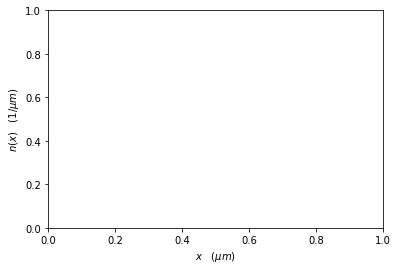

In [39]:
## variable T et x0 

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize


# Création de la figure et de l'axe
fig, ax1 = plt.subplots()
ax1.set(xlabel="$x \quad (\mu m)$", ylabel="$n(x) \quad (1/\mu m)$")



colors = [
    #"#1f77b4",  # Bleu
    #"#ff7f0e",  # Orange
    #"#2ca02c",  # Vert
    #"#d62728",  # Rouge
    "#9467bd",  # Violet
    "#8c564b",  # Marron
    "#e377c2",  # Rose
    "#7f7f7f",  # Gris
    "#bcbd22",  # Jaune Olive
    "#17becf"   # Cyan
]

# Création du colormap
#norm = Normalize(vmin=min(Liste_Chi), vmax=max(Liste_Chi))
vmin, vmax = min(Liste_Chi) , max(Liste_Chi) 
vmin , vmax = 0.7274507386323055 , 1.0180563375618101
vmin , vmax = find_nearest_elements(Liste_Chi, vmin, vmax)

norm = Normalize(vmin=vmin, vmax=vmax)

T_ming , T_maxg = 0 ,1001 
x0_ming , x0_maxg = -30 , 25 

T_min , T_max = T_maxg , T_ming 
x0_min , x0_max = x0_maxg , x0_ming

cmap = cm.viridis  # Vous pouvez changer de colormap si vous préférez
chi_min  = vmax
chi_max  = vmin

cmap = cm.viridis  # Vous pouvez changer de colormap si vous préférez
nomb = "theta_edge_1.0_ih1"
tb = "veff_bord"
# Tracé des courbes pour chaque triple
for triple, C in Chi.items():
    mu, T, x00, Taille = triple
    C = C[chi_ind]
    if  not( x00 == 5.373 and Taille == 42.48) and  (C  >= vmin and C  <= vmax ) \
        and (T >= T_ming and T <= T_maxg ) and (x00 >= x0_ming and x00 <= x0_maxg ):
        # Vérifier et récupérer la couleur associée
        if C < chi_min : chi_min = C
        if C > chi_max : chi_max = C

        if T < T_min : T_min = T 
        if T > T_max : T_max = T 

        if x00 < x0_min : x0_min = x00 
        if x00 > x0_max : x0_max = x00 
        color = cmap(norm(C))
    
        filename = f"{date}/density_expansion_nu_{nomb}_{mu:.3f}_{T:.3f}_{tb}.npz"
        data_s = np.load(filename)
        label = f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK , hydo regyme"
        ax1.plot(data_s[0, :]*Temps_deform, data_s[1, :],  color=color,  label=label)
    
        
        time_list = sorted(list(liste_t))[-10:]
        mask = np.isin(np.array(liste_t), [0 ])
        time_list = sorted(np.array(list(liste_t))[mask])
    
        for t in time_list:
            filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
            data_s = np.load(filename)
            X_simul = data_s[0, :]
            
            if t > -1 and 1 == 0:
                label = f"$\\rho$, $n$, $\\mu = {mu:.3f}$ nK, $T = {T:.3f}$ nK, $x_0 = {x00:.3f}$ $\\mu$m, $\\ell = {Taille:.3f}$ $\\mu$m, $\\tau = {t:.3f}$ ms"
                line, = ax1.plot(X_simul * Taille / t * t2, data_s[1, :] * t / t2, label=label, color=color)
            else:
                label = f"GHD: $\\mu = {mu:.3f}$ nK, $T = {T:.3f}$ nK, $x_0 = {x00:.3f}$ $\\mu$m, $\\ell = {Taille:.3f}$ $\\mu$m, $\\tau = {t:.3f}$ ms"
                label = (
                    f" $\\chi = {C:.3f}$, "
                    f"GHD: $\\mu = {mu:.3f}~nK$, "
                    f"$T = {T:.3f}~nK$, "
                    f"$x_0 = {x00:.3f}~\\mu m$, "
                    f"$\\ell = {Taille:.3f}~\\mu m$, "
                    f"$\\tau = {t:.3f}~ms$"
                )
                line, = ax1.plot(X_simul * Taille, data_s[1, :],  color=color) #label=label,
    
            # Ajouter les barres verticales
            ax1.axvline(x=x00, linestyle='--', color=color, alpha=0.7)
            #ax1.axvline(x=x00 - Taille / 2, linestyle='--', color=color, alpha=0.7)
            #ax1.axvline(x=x00 + Taille / 2, linestyle='--', color=color, alpha=0.7)
    else:
        #print(f"Pas finie la simul pour le triple : {triple}")
        continue  # Passer à l'itération suivante si time_list est vide

X , Y , label = DONNEES[1]
mask = X < 7*18
ax1.plot(X[mask], Y[mask],  linewidth=2 ,  label=f"donnés du "+ date_donnees + ' : ' + label , color = "#17becf" )



filename = f"{date}/density_expansion_nu_{nomb}_{mub:.3f}_{Tb:.3f}_{tb}.npz"
data_s = np.load(filename) 
color = '#ff7f0e'
#ax1.plot(data_s[0, :]*18, data_s[1, :] , linewidth=2 , color = color, label=f"GHD : $\\mu$ = {mub:.3f} nK, $T$ = {Tb:.3f} nK , hydo regyme")

ax1.set(
    xlabel="$x \quad (\mu m)$", 
    ylabel="$n(x) \quad (1/\mu m)$"
)
ax1.set_title(
    f"$ x_0 = {x00:.3f} \\mu \\text{{m}}, \\ell = {Taille:.3f} \\mu \\text{{m}}$", 
    color=color
)
ax1.set_title(
    f"$\\mu = {mub:.3f} ~\\text{{ nK}}, T = {Tb:.3f}~ \\text{{ nK}}$", 
    color=color
)
ax1.set_title(
    f"", 
    color=color
)
ax1.set_title(
    f"$ x_0 = {x00:.3f} \\mu \\text{{m}}", 
    color=color
)
# Initialisation des données
X , Y , label = DONNEES[2]
mask = (X < 70*18)*(X>-50*18)
ax1.plot(X[mask], Y[mask], color='#1f77b4'  , linewidth=2 , label=f"donnés du "+ date_donnees + ' : ' + label )
ax1.set(xlabel="$x \quad (\mu m)$", ylabel="$n(x) \quad (1/\mu m)$", 
            title=f"$T \in [{T_min:.3f} , {T_max:.3f}]~nK$ ,   $~x_0 \in [{x0_min:.3f} , {x0_max:.3f}]~\mu m$")


# Configuration des limites et des lignes supplémentaires
plt.xlim([-250 , 100 ])
plt.ylim([-5 , 65 ])
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.grid(True)

# Ajouter une colorbar
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Nécessaire pour générer la colorbar
cbar = plt.colorbar(sm, ax=ax1)
cbar.set_label("$\chi $", rotation=270, labelpad=20)

# Légende
#plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.savefig('graphique_high_res.png', dpi=300) 
plt.show()
print (f"Pour le graphe chi_min = {chi_min:.16f}  et chi_max = {chi_max:.16f}")
triplec = min(Chi, key=Chi.get)
print (triplec , Chi[triplec])

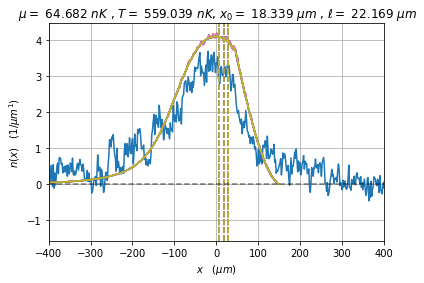

In [40]:
fig, ax1 = plt.subplots()
ax1.set(xlabel="$x \quad (\mu m)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $")
X , Y , label = DONNEES[-1]
ax1.plot(X, Y, label=label)
    
for triple , liste_t in triples.items():
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    mu, T, x00, Taille = triple
    ax1.set(xlabel="$x \quad (\mu m)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$, $x_0 =$ {x00:.3f} $\mu m$ , $\\ell =$ {Taille:.3f} $\mu m$")
    
    time_list = [max(liste_t)]
    time_list = sorted(list(liste_t))[-10:]
    mask = ((np.array(list(liste_t))< max(liste_t)+1)*(np.array(list(liste_t))> max(liste_t)-1))+(np.array(list(liste_t))==0)
    mask = np.isin(np.array(liste_t), [Temps_exp]) #+ (np.array(list(liste_t)) == 30)
    time_list = sorted(np.array(list(liste_t))[mask])
    #time_list = sorted(np.array(list(liste_t))[-1])
    #plot_graph3(date, nom, triple, time_list , DONNEES)
    for t in time_list:
        filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
        data_s = np.load(filename) 
        X_simul = data_s[0, :] 
        if t > -1 and 1 == 0: 
            if date_donnees == '2024-02-09': t2  = 50
            elif date_donnees == '2024-02-29': t2 = 50
            elif date_donnees == '2024-04-24': t2 = 30
            else: t2 = time_list[-1]
            label = f"$\\rho$, $n$, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK,  $x_0 =$ {x00:.3f} $\mu m$, $\\ell$ = {Taille:.3f} $\\mu$m, $\\tau$ = {t:.3f} $m$s"
            line, = ax1.plot(X_simul * Taille / t * t2, data_s[1, :] * t / t2, label=label)
        else:
            label = f"GHD: $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0 =$ {x00:.3f} $\mu m$, $\\ell$ = {Taille:.3f} $\\mu$m, $\\tau$ = {t:.3f} $m$s"
            line, = ax1.plot(X_simul * Taille, data_s[1, :], label=label)
        
        # Obtenir la couleur de la ligne tracée
        line_color = line.get_color()
        
        # Ajouter les trois barres verticales
        ax1.axvline(x=x00, linestyle='--', color=line_color, alpha=0.7)#, label=f"Barre à $x_0$ = {x00:.3f}")
        ax1.axvline(x=x00 - Taille / 2, linestyle='--', color=line_color)#, alpha=0.7, label=f"Barre à $x_0 - \\ell/2$")
        ax1.axvline(x=x00 + Taille / 2, linestyle='--', color=line_color)#, alpha=0.7, label=f"Barre à $x_0 + \\ell/2$")
plt.xlim([-400 , 400 ])
#plt.axvline(x=x0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.grid(True)
#plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.show()

NameError: name 'find_nearest_elements' is not defined

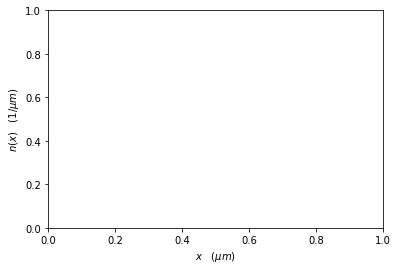

In [41]:
# variable T 

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize

# Création de la figure et de l'axe
fig, ax1 = plt.subplots()
ax1.set(xlabel="$x \quad (\mu m)$", ylabel="$n(x) \quad (1/\mu m)$")


# Initialisation des valeurs pour la colorbar (avec normalisation pour T)
#norm = Normalize(vmin=min(triple[1] for triple in triples.keys()), 
#                 vmax=max(triple[1] for triple in triples.keys()))

Liste_T = [triple[1] for triple in triples.keys()] 
vmin, vmax = min(Liste_T) , max(Liste_T) 
#vmin , vmax = 300, 500 
vmin , vmax = find_nearest_elements(Liste_T, vmin, vmax)

norm = Normalize(vmin=vmin, vmax=vmax)

cmap = cm.viridis  # Choix de la colormap

# Parcourir les triples et tracer les courbes
for triple, C in Chi.items():
    mu, T, x00, Taille = triple

    C = C[chi_ind]
    
    if ( T >= vmin and T <= vmax) :
        # Gestion des temps
        time_list = [max(liste_t)]
        time_list = sorted(list(liste_t))[-10:]
        mask = np.isin(np.array(liste_t), [Temp_exp])  # Filtrer les temps spécifiques
        time_list = sorted(np.array(list(liste_t))[mask])

        time_list = [Temps_exp]
    
        for t in time_list:
            filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
            data_s = np.load(filename)
            X_simul = data_s[0, :]
            
            label = f"GHD: $\\mu = {mu:.3f}~nK$, $T = {T:.3f}~nK$, $x_0 = {x00:.3f}~\mu m$, $\\ell = {Taille:.3f}~\mu m$, $\\tau = {t:.3f}~ms$"

            label = (
                f" $\\chi = {C:.3f}$, "
                f"GHD: $\\mu = {mu:.3f}~nK$, "
                f"$T = {T:.3f}~nK$, "
                f"$x_0 = {x00:.3f}~\\mu m$, "
                f"$\\ell = {Taille:.3f}~\\mu m$, "
                f"$\\tau = {t:.3f}~ms$"
            )
            
            # Couleur en fonction de T
            line_color = cmap(norm(T))
            line, = ax1.plot(X_simul * Taille, data_s[1, :], label=label, color=line_color)
            
            # Ajouter les trois barres verticales
            #ax1.axvline(x=x00, linestyle='--', color=line_color, alpha=0.7)
            #ax1.axvline(x=x00 - Taille / 2, linestyle='--', color=line_color, alpha=0.7)
            #ax1.axvline(x=x00 + Taille / 2, linestyle='--', color=line_color, alpha=0.7)

ax1.set(xlabel="$x \quad (\mu m)$", ylabel="$n(x) \quad (1/\mu m)$", 
            title=f" $x_0 = {x00:.3f}~\mu m$, $\\ell = {Taille:.3f}~\mu m$")

X, Y, label = DONNEES[-1]
ax1.plot(X, Y, color = "#d62728",  alpha=0.5, label=label)

# Limites et grilles
plt.xlim([-400, 400])
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.grid(True)

# Ajouter la colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Nécessaire pour la colorbar
cbar = plt.colorbar(sm, ax=ax1)
cbar.set_label("$T~(nK)$")

# Légende
#plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.savefig('graphique_high_res.png', dpi=300) 
plt.show()


NameError: name 'find_nearest_elements' is not defined

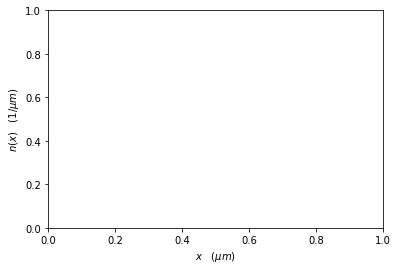

In [42]:
# variable x0

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize

# Création de la figure et de l'axe
fig, ax1 = plt.subplots()
ax1.set(xlabel="$x \quad (\mu m)$", ylabel="$n(x) \quad (1/\mu m)$")



# Initialisation des valeurs pour la colorbar (avec normalisation pour T)
#vmin , vmax = min(triple[2] for triple in triples.keys()) , max(triple[2] for triple in triples.keys())
#vmin , vmax = 16 , 19
#norm = Normalize(vmin=vmin, 
#                 vmax=vmax)

Liste_x0 = [triple[2] for triple in triples.keys()] 
vmin, vmax = min(Liste_x0) , max(Liste_x0) 
##vmin , vmax = 0, 10
vmin , vmax = find_nearest_elements(Liste_x0, vmin, vmax)

norm = Normalize(vmin=vmin, vmax=vmax)

cmap = cm.viridis  # Choix de la colormap

# Parcourir les triples et tracer les courbes
for triple, C0 in Chi.items():
    mu, T, x00, Taille = triple
    if (x00 >= vmin and  x00 <= vmax ) :
        # Gestion des temps
        time_list = [max(liste_t)]
        time_list = sorted(list(liste_t))[-10:]
        mask = np.isin(np.array(liste_t), [Temp_exp])  # Filtrer les temps spécifiques
        time_list = sorted(np.array(list(liste_t))[mask])
        time_list = [Temps_exp]
        for t in time_list:
            filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
            data_s = np.load(filename)
            X_simul = data_s[0, :]
            
            label = f"GHD: $\\mu = {mu:.3f}~nK$, $T = {T:.3f}~nK$, $x_0 = {x00:.3f}~\mu m$, $\\ell = {Taille:.3f}~\mu m$, $\\tau = {t:.3f}~ms$"
            C = C0[chi_ind]
            label = (
                f" $\\chi = {C:.3f}$, "
                f"GHD: $\\mu = {mu:.3f}~nK$, "
                f"$T = {T:.3f}~nK$, "
                f"$x_0 = {x00:.3f}~\\mu m$, "
                f"$\\ell = {Taille:.3f}~\\mu m$, "
                f"$\\tau = {t:.3f}~ms$"
            )
            # Couleur en fonction de T
            line_color = cmap(norm(x00))
            line, = ax1.plot(X_simul * Taille, data_s[1, :], label=label, color=line_color)
            
            # Ajouter les trois barres verticales
            #ax1.axvline(x=x00, linestyle='--', color=line_color, alpha=0.7)
            #ax1.axvline(x=x00 - Taille / 2, linestyle='--', color=line_color, alpha=0.7)
            #ax1.axvline(x=x00 + Taille / 2, linestyle='--', color=line_color, alpha=0.7)

# Limites et grilles

ax1.set(xlabel="$x \quad (\mu m)$", ylabel="$n(x) \quad (1/\mu m)$", 
            title=f"$\\mu = {mu:.3f}~nK$, $T = {T:.3f}~nK$")

X, Y, label = DONNEES[-1]
ax1.plot(X, Y, color = "#d62728",  alpha=0.5, label=label)

plt.xlim([-400, 400])
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.grid(True)

# Ajouter la colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Nécessaire pour la colorbar
cbar = plt.colorbar(sm, ax=ax1)
cbar.set_label("$x_0~(\mu m )$")

# Légende
#plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.savefig('graphique_high_res.png', dpi=300) 
plt.show()

print(Temps_exp)


NameError: name 'Liste_Chi' is not defined

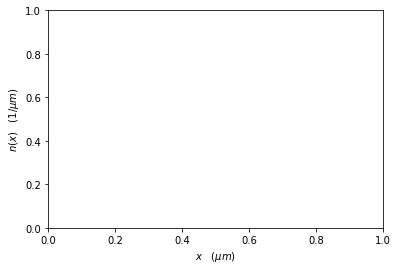

In [43]:
# variable T et x0

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize

# Création de la figure et de l'axe
fig, ax1 = plt.subplots()
ax1.set(xlabel="$x \quad (\mu m)$", ylabel="$n(x) \quad (1/\mu m)$")
#X, Y, label = DONNEES[-1]
#ax1.plot(X, Y, color = "#d62728", label=label)

# Initialisation des valeurs pour la colorbar (avec normalisation pour T)
# Création du colormap



vmin, vmax =min(Liste_Chi), max(Liste_Chi) 
vmin, vmax = 0, 1 
print ( "vmin, vmax : " , vmin, vmax )            
vmin, vmax = find_nearest_elements(Liste_Chi, vmin, vmax)
print ( "vmin, vmax : " , vmin, vmax ) 

norm = Normalize(vmin=vmin, vmax=vmax)

T_ming , T_maxg = 1400 ,1500
x0_ming , x0_maxg = -100, 100

T_min , T_max = T_maxg , T_ming 
x0_min , x0_max = x0_maxg , x0_ming

cmap = cm.viridis  # Vous pouvez changer de colormap si vous préférez
chi_min  = vmax
chi_max  = vmin

#print ( Chi )
# Tracé des courbes pour chaque triple
for triple, C in Chi.items():
    mu, T, x00, Taille = triple
    C = C[chi_ind]
    #print(C)
    if  (C >= vmin and C <= vmax) \
        and (T >= T_ming and T <= T_maxg ) and (x00 >= x0_ming and x00 <= x0_maxg ):
        # Vérifier et récupérer la couleur associée
        if C < chi_min : chi_min = C
        if C > chi_max : chi_max = C

        if T < T_min : T_min = T 
        if T > T_max : T_max = T 

        
        if x00 < x0_min : x0_min = x00 
        if x00 > x0_max : x0_max = x00 
            
        color = cmap(norm(C))
        # Gestion des temps
        #time_list = [max(liste_t)]
        #time_list = sorted(list(liste_t))[-10:]
        #mask = np.isin(np.array(liste_t), [Temps_exp])  # Filtrer les temps spécifiques
        
        #time_list = sorted(np.array(list(liste_t))[mask])

        time_list=[Temps_exp]

        #print(time_list , liste_t)
    
        for t in time_list:
            filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
            data_s = np.load(filename)
            
            #label = f" $\\chi = {Chi:.3f}$,  GHD: $\\mu = {mu:.3f}~nK$, $T = {T:.3f}~nK$, $x_0 = {x00:.3f}~\mu m$, $\\ell = {Taille:.3f}~\mu m$, $\\tau = {t:.3f}~ms$"
            label = (
                f" $\\chi = {C:.3f}$, "
                f"GHD: $\\mu = {mu:.3f}~nK$, "
                f"$T = {T:.3f}~nK$, "
                f"$x_0 = {x00:.3f}~\\mu m$, "
                f"$\\ell = {Taille:.3f}~\\mu m$, "
                f"$\\tau = {t:.3f}~ms$"
            )
            # Couleur en fonction de T
            #line_color = cmap(norm(x00))
            line, = ax1.plot(data_s[0, :] * Taille, data_s[1, :],  color=color )#, label=label)
            #print("la")
            
            # Ajouter les trois barres verticales
            #ax1.axvline(x=x00, linestyle='--', color=line_color, alpha=0.7)
            #ax1.axvline(x=x00 - Taille / 2, linestyle='--', color=line_color, alpha=0.7)
            #ax1.axvline(x=x00 + Taille / 2, linestyle='--', color=line_color, alpha=0.7)

# Limites et grilles

ax1.set(xlabel="$x \quad (\mu m)$", ylabel="$n(x) \quad (1/\mu m)$", 
            title=f"$\\mu = {mu:.3f}~nK$, $T = {T:.3f}~nK$")

ax1.set(xlabel="$x \quad (\mu m)$", ylabel="$n(x) \quad (1/\mu m)$", 
            title=f"$T \in [{T_min:.3f} , {T_max:.3f}]~nK$ ,   $~x_0 \in [{x0_min:.3f} , {x0_max:.3f}]~\mu m$")

X, Y, label = DONNEES[-1]
ax1.plot(X, Y, color = "#d62728",  alpha=0.5, label=label)

print (f"Pour le graphe chi_min = {chi_min:.16f}  et chi_max = {chi_max:.16f}")
triplec = min(Chi, key=Chi.get)
print (triplec , Chi[triplec])

mu, T, x00, Taille = triplec
C = Chi[triplec ]
C = C[ chi_ind ] 
color = cmap(norm(C))
filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{Temps_exp:.3f}.npz"
data_s = np.load(filename)

#label = f" $\\chi = {Chi:.3f}$,  GHD: $\\mu = {mu:.3f}~nK$, $T = {T:.3f}~nK$, $x_0 = {x00:.3f}~\mu m$, $\\ell = {Taille:.3f}~\mu m$, $\\tau = {t:.3f}~ms$"
label = (
    f" $\\chi = {C:.3f}$, "
    f"GHD: $\\mu = {mu:.3f}~nK$, "
    f"$T = {T:.3f}~nK$, "
    f"$x_0 = {x00:.3f}~\\mu m$, "
    f"$\\ell = {Taille:.3f}~\\mu m$, "
    f"$\\tau = {t:.3f}~ms$"
)
# Couleur en fonction de T
#line_color = cmap(norm(x00))
line, = ax1.plot(data_s[0, :] * Taille, data_s[1, :], label=label, color=color)


plt.xlim([-400, 400])
plt.axhline(y=0, color='black', linestyle='--', linewidth=3, alpha=0.5)
plt.grid(True)

# Ajouter la colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Nécessaire pour la colorbar
cbar = plt.colorbar(sm, ax=ax1)
cbar.set_label("$\chi$")

# Légende
plt.legend(loc='upper center', bbox_to_anchor=(2.3, 1), fancybox=True, shadow=True, ncol=1)
plt.savefig('graphique_high_res.png', dpi=300, bbox_inches='tight')
plt.show()



NameError: name 'Liste_Chi' is not defined

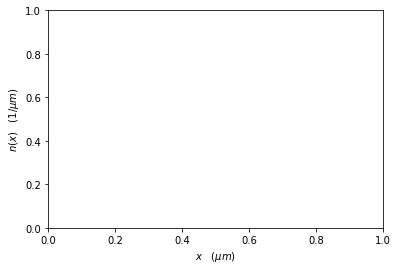

In [44]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize

# Création de la figure et de l'axe
fig, ax1 = plt.subplots()
ax1.set(xlabel="$x \quad (\mu m)$", ylabel="$n(x) \quad (1/\mu m)$")

# Initialisation des valeurs pour la colorbar (avec normalisation pour T)
vmin, vmax = min(Liste_Chi), max(Liste_Chi)
vmin, vmax = 0, 1 
print("vmin, vmax : ", vmin, vmax)
vmin, vmax = find_nearest_elements(Liste_Chi, vmin, vmax)
print("vmin, vmax : ", vmin, vmax)

norm = Normalize(vmin=vmin, vmax=vmax)

T_ming, T_maxg = 0, 10000
x0_ming, x0_maxg = 0, 18.339

T_min, T_max = T_maxg, T_ming
x0_min, x0_max = x0_maxg, x0_ming

cmap = cm.viridis  # Vous pouvez changer de colormap si vous préférez
chi_min = vmax
chi_max = vmin

# Fonction pour associer T à chi
def chi_to_temperature(chi, T_min, T_max):
    # Exemple : linéairement associer chi à T, à ajuster selon votre relation
    return T_min + (T_max - T_min) * (chi - vmin) / (vmax - vmin)

# Tracé des courbes pour chaque triple
for triple, C in Chi.items():
    mu, T, x00, Taille = triple
    C = C[chi_ind]

    if (C >= vmin and C <= vmax) and (T >= T_ming and T <= T_maxg) and (x00 >= x0_ming and x00 <= x0_maxg):
        if C < chi_min: chi_min = C
        if C > chi_max: chi_max = C

        if T < T_min: T_min = T
        if T > T_max: T_max = T

        if x00 < x0_min: x0_min = x00
        if x00 > x0_max: x0_max = x00

        color = cmap(norm(C))  # Obtenir la couleur basée sur chi
        
        # Calculer la température associée à ce chi
        T_for_chi = chi_to_temperature(C, T_min, T_max)

        # Tracer la courbe avec la couleur appropriée
        line, = ax1.plot(data_s[0, :] * Taille, data_s[1, :], color=color, label=f"$\\chi = {C:.3f}$, $T = {T_for_chi:.3f}$")

# Ajouter la colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Nécessaire pour la colorbar
cbar = plt.colorbar(sm, ax=ax1)
cbar.set_label("$\chi$")

# Ajouter des graduations personnalisées sur la colorbar qui correspondent à la température T
cbar_ticks = np.linspace(vmin, vmax, num=6)  # Par exemple, 6 graduations
cbar.set_ticks(cbar_ticks)
cbar.set_ticklabels([f"{chi_to_temperature(chi, T_min, T_max):.3f}" for chi in cbar_ticks])

# Légende
plt.legend(loc='upper center', bbox_to_anchor=(2.3, 1), fancybox=True, shadow=True, ncol=1)
plt.savefig('graphique_high_res.png', dpi=300, bbox_inches='tight')
plt.show()


## Centre avec boite convolué avec gaussienne

UnboundLocalError: local variable 'mask' referenced before assignment

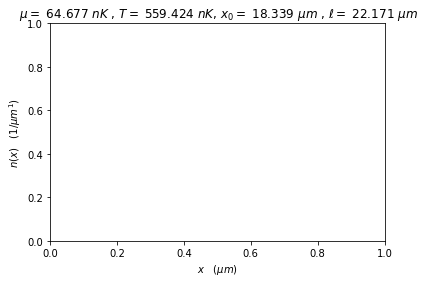

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Fonction porte (sans gaussienne)
def porte(x, centre, largeur, hauteur=1):
    """
    Fonction porte ajustée avec une hauteur.
    x : vecteur de données
    centre : le centre de la porte
    largeur : la largeur de la fenêtre porte
    hauteur : la hauteur de la porte (amplitude)
    """
    return np.where(np.abs(x - centre) <= largeur / 2, hauteur, 0)

# Fonction gaussienne
def gaussian(x, sigma):
    """
    Fonction gaussienne centrée en 0.
    x : vecteur de données
    sigma : écart type de la gaussienne
    """
    return (1 / (np.sqrt(2 * np.pi) * sigma)) * np.exp(-0.5 * (x / sigma) ** 2)

# Convolution de la fonction porte avec une gaussienne
def porte_convolue(x, centre, largeur, hauteur=1, sigma=1):
    """
    Fonction porte convoluée avec une gaussienne.
    x : vecteur de données
    centre : le centre de la porte
    largeur : la largeur de la fenêtre porte
    hauteur : la hauteur de la porte (amplitude)
    sigma : l'écart type de la gaussienne
    """
    porte_values = porte(x, centre, largeur, hauteur)
    gaussian_values = gaussian(x, sigma)
    
    # Convolution discrète
    return porte_values
    #return np.convolve(porte_values, gaussian_values, mode='same') * (x[1] - x[0])

# Fonction pour ajuster la fonction porte convoluée avec gaussienne
def fit_porte_convolue(x_data, y_data, initial_guess):
    """
    Fit une fonction porte convoluée avec une gaussienne aux données simulées.
    x_data : données des positions
    y_data : données des valeurs à ajuster
    initial_guess : estimation initiale des paramètres [centre, largeur, hauteur, sigma]
    """
    def model(x, centre, largeur, hauteur, sigma):
        return porte_convolue(x, centre, largeur, hauteur, sigma)

    # Fit des paramètres du modèle porte convoluée avec gaussienne aux données
    params, covariance = curve_fit(model, x_data, y_data, p0=initial_guess)
    return params, covariance

def plot_graph4(date, nom, triple, time_list, DONNEES):
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    mu, T, x00, Taille = triple
    theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
    ax1.set(xlabel="$x \quad (\mu m)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", 
            title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$, $x_0 =$ {x00:.3f} $\mu m$ , $\\ell =$ {Taille:.3f} $\mu m$")
    
    if DONNEES is not None:
        for Donnees in DONNEES[-2:-1]:
            X, Y, label = Donnees
            if date_donnees == '2024-02-09': x0 = 76.25 - 6.82
            elif date_donnees == '2024-02-29': x0 = -6
            elif date_donnees == '2024-04-24': mask, x0 = (X < 60) * (X > -10), 0  
            else: x0 = X[np.argmax(Y)] 
            X , Y = X[mask], Y[mask]
            ax1.plot((X - x0), Y, label=label)
            initial_guess = [20, 20, 40, 0.001 ]  # Estimation initiale: centre=0, largeur=5, hauteur=1
            params, covariance = fit_porte_convolue(X, Y, initial_guess)
            ax1.plot(X, porte_convolue(X , *params ), label=f"Porte Simul. Fit: centre={params[0]:.3f}, largeur={params[1]:.3f}, hauteur={params[2]:.3f}")
    
    for t in time_list:
        filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
        data_s = np.load(filename)
        
        # Calcul du centre (x0) basé sur la densité maximale
        x0 = data_s[0, np.argmax(data_s[1, :])]
        x0 = 0  # Pour normaliser
        
        X_simul = data_s[0, :] - x0  # Normalisation des positions
        
        # Application de la fonction porte pour ajuster les données
        largeur_fenetre = 500  # Exemple de largeur de la fenêtre porte (à ajuster selon vos besoins)
        hauteur_fenetre = 1  # Hauteur de la fenêtre porte (à ajuster)
        mask_porte = porte(X_simul, centre=0, largeur=largeur_fenetre, hauteur=hauteur_fenetre)
        
        # Appliquer la fonction porte sur les données
        X_simul_porte = X_simul*Taille #X_simul[mask_porte > 0]* Taille
        Y_simul_porte = data_s[1, :]#[mask_porte > 0]
        
        # Fit des données simulées à une fonction porte (on ajuste centre, largeur et hauteur)
        initial_guess = [20, 2, 40, 0.001 ]  # Estimation initiale: centre=0, largeur=5, hauteur=1
        params, covariance = fit_porte_convolue(X_simul_porte, Y_simul_porte, initial_guess)
        
        # Tracer la fonction ajustée (fit)
        #ax1.plot(X_simul_porte,  Y_simul_porte, label=f"Simul. Fit: centre={params[0]:.3f}, largeur={params[1]:.3f}, hauteur={params[2]:.3f}")
        ax1.plot(X_simul_porte, porte_convolue(X_simul_porte, *params ), label=f"Porte Simul. Fit: centre={params[0]:.3f}, largeur={params[1]:.3f}, hauteur={params[2]:.3f}")
        
    # Chargement de rho théorique
    rho_theta_star_discr = np.load(f"{date}/rho_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x00:.3f}.npz")
    theta0 = theta_discr[np.argmax(rho_theta_star_discr)]
    theta0 = 0 
    #ax1.plot((theta_discr - theta0)*t2, rho_theta_star_discr, label=f"$\\rho^\\star \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m")

# Création de la figure
fig, ax1 = plt.subplots()

for triple, liste_t in triples.items():
    # Appliquer le filtre porte
    mask = np.isin(np.array(liste_t), [0, 1])  # Vous pouvez ajouter d'autres conditions ici, comme [0, 1, 30]
    
    # Liste des temps filtrés
    time_list = sorted(np.array(list(liste_t))[mask])
    
    # Tracer les graphiques
    plot_graph4(date, nom, triple, time_list, DONNEES)

# Affichage du graphique
plt.grid(True)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.show()


date : 2024-04-24
A = 99.99999999985164 x0 = 18.85715326445854 $\ell$ = 9.756724909501337 $\sigma$ = 10.920340971185135
Largeur à mi-hauteur (FWHM) approximative : 28.16469785521172


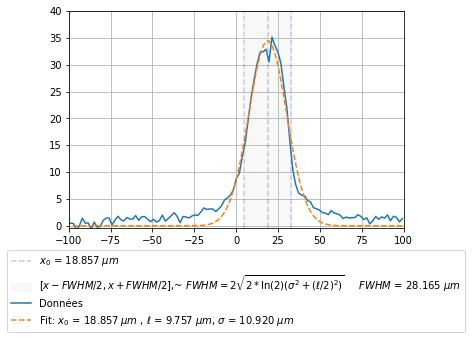

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.special import erf

date = '2024-04-24'
print("date :" , date)
DONNEES = f_DONNEES(date)

# Modèle de la porte convoluée avec une gaussienne
def gaussian_convolved_rect(x, A , x0 , Taille , sigma):
    return (A / 2) * (erf((x + Taille / 2 - x0) / (np.sqrt(2) * sigma)) - erf((x - Taille / 2 - x0) / (np.sqrt(2) * sigma)))

# Données simulées (par exemple)
x_data = np.linspace(-10, 10, 1000)
y_data = gaussian_convolved_rect(x_data, 5, 0, 2 , 2) + np.random.normal(0, 0.2, len(x_data))  # y = porte convoluée + bruit

Donnees = DONNEES[-2]
X, Y, label = Donnees
mask = (X < 100) * (X > -100)
x_data , y_data = X[mask], Y[mask]
# Ajustement de la fonction aux données

lower_bounds = [0, -10, 22-100 , 0 ]  # bornes inférieures
upper_bounds = [100, 18+10, 22+100, 100]    # bornes supérieures

# Ajustement de la fonction porte convoluée avec une gaussienne aux données
popt, pcov = curve_fit(gaussian_convolved_rect, x_data, y_data, p0=[(lower_bounds[0] + upper_bounds[0])/2, (lower_bounds[1] + upper_bounds[1])/2, (lower_bounds[2] + upper_bounds[2])/2, (lower_bounds[3] + upper_bounds[3])/2], bounds=(lower_bounds, upper_bounds))

#popt, pcov = curve_fit(gaussian_convolved_rect, x_data, y_data, p0=[30, 20, 2])

# Paramètres ajustés : largeur de la porte, centre, écart-type de la gaussienne
A , x0 , Taille , sigma = popt
print("A =" , A ,"x0 =",  x0 , "$\ell$ =",  Taille , "$\sigma$ =" ,  sigma)
#plt.text(0.1, 0.9, f"A = {A}, x0 = {x0}, $\\ell$ = {Taille}, $\\sigma$ = {sigma}", fontsize=12)


# Calcul de la FWHM (Largeur à mi-hauteur) approximative en utilisant sigma et w
FWHM = Taille #2 * np.sqrt(2 * np.log(2)) * np.sqrt(sigma**2 + (Taille / 2)**2)
FWHM = 2 * np.sqrt(2 * np.log(2)) * np.sqrt(sigma**2 + (Taille / 2)**2)

print(f"Largeur à mi-hauteur (FWHM) approximative : {FWHM}")

# Tracer les données et le modèle ajusté
plt.axvline(x=x0 - FWHM/2, color='blue', linestyle='--' , alpha = 0.2 )
plt.axvline(x=x0 + FWHM/2, color='blue', linestyle='--' , alpha = 0.2)
plt.axvline(x=x0, color='black', linestyle='--' , alpha = 0.2 , label = f"$x_0$ = {x0:.3f} $\mu m$" )
plt.fill_betweenx(x_data, x0 - FWHM/2  , x0 + FWHM/2, color='grey', alpha=0.05, label="$[x-FWHM/2,x+FWHM/2]$,~ $FWHM = 2 \sqrt{2*\ln(2) ( \sigma^2 + (\\ell/2)^2)}$" + f"     $FWHM$ = {FWHM:.3f} $\mu m$")

plt.plot(x_data, y_data, label='Données')
plt.plot(x_data, gaussian_convolved_rect(x_data, *popt), label=f"Fit: $x_0$ = {x0:.3f} $\mu m$ , $\\ell$ = {Taille:.3f} $\mu m$, $\\sigma$ = {sigma:.3f} $\mu m$", linestyle='--')


plt.ylim([-0.5 , 40 ])
plt.xlim([-100, 100 ])
plt.grid()
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), borderaxespad=0.)



# Calcul de la FWHM (Largeur à mi-hauteur) approximative
# Fonction convoluée à son maximum
#max_value = np.max(gaussian_convolved_rect(x_data, *popt))

# Définir le seuil de mi-hauteur (50% du maximum)
#half_max = max_value / 2

# Trouver les indices où la fonction dépasse le seuil
#indices_above_half_max = np.where(gaussian_convolved_rect(x_data, *popt) > half_max)[0]

# Largeur approximative entre ces indices
#width_at_half_max = x_data[indices_above_half_max[-1]] - x_data[indices_above_half_max[0]]

#print(f"Largeur à mi-hauteur (FWHM) approximative : {width_at_half_max} , {mu} , {sigma} , {mu}")

plt.savefig(f"Figures/ajustement_rec_gaussienne_donnee_{date}_1ms_x0={x0:.3f}_Taille={Taille:.3f}_sigma={sigma:.3f}.pdf", bbox_inches='tight', dpi = 300)
plt.savefig(f"Figures/ajustement_rec_gaussienne_donnee_{date}_1ms_x0={x0:.3f}_Taille={Taille:.3f}_sigma={sigma:.3f}.svg", bbox_inches='tight', dpi = 300)
plt.show()

In [51]:
2.0128*np.log(2)

np.float64(1.3951666450310578)

In [52]:
np.log(np.exp(1))

np.float64(1.0)

34.49952094506475 18.85751788047359 11.285405878593014


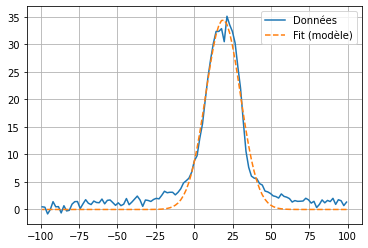

Largeur à mi-hauteur (FWHM) approximative : 26.57509997922094


In [53]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.special import erf

# Modèle de la porte convoluée avec une gaussienne
def gaussian(x, A, mu, sigma):
    return A*np.exp(-(x-mu)**2/(2*sigma**2))

Donnees = DONNEES[-2]
X, Y, label = Donnees
mask = (X < 100) * (X > -100)
x_data , y_data = X[mask], Y[mask]
# Ajustement de la fonction aux données

lower_bounds = [0,0, 0]  # bornes inférieures
upper_bounds = [100, 500, 300,]    # bornes supérieures

# Ajustement de la fonction porte convoluée avec une gaussienne aux données
popt, pcov = curve_fit(gaussian, x_data, y_data, p0=[25, 0, 50], bounds=(lower_bounds, upper_bounds))


# Paramètres ajustés : largeur de la porte, centre, écart-type de la gaussienne
A, mu, sigma = popt
print(A, mu, sigma)

# Tracer les données et le modèle ajusté
plt.plot(x_data, y_data, label='Données')
plt.plot(x_data, gaussian(x_data, *popt), label='Fit (modèle)', linestyle='--')
plt.grid()
plt.legend()
plt.show()


FWHM = 2 * np.sqrt(2 * np.log(2)) * sigma

print(f"Largeur à mi-hauteur (FWHM) approximative : {FWHM}")

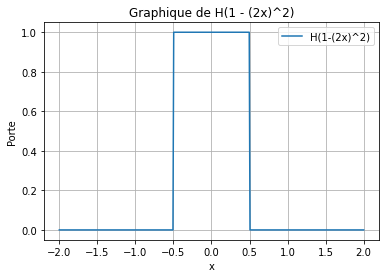

In [56]:
import numpy as np
import matplotlib.pyplot as plt

# Fonction Heaviside
def Heaviside(x):
    return np.where(x >= 0, 1, 0)

# Fonction porte de rayon 1
def Porte(x):
    return np.where(np.abs(x) <= 1, 1, 0)

# Fonction combinée H((2x)^2 - A)
def H_porte(x):
    return Heaviside(A-(2*x)**2)

# Générer des valeurs pour x
x = np.linspace(-2, 2, 400)

# A est un paramètre pour la fonction H_porte
y = H_porte(x)

# Tracer le résultat
plt.plot(x, y, label=f'H(1-(2x)^2)')
plt.xlabel('x')
plt.ylabel('Porte')
plt.title('Graphique de H(1 - (2x)^2)')
plt.grid(True)
plt.legend()
plt.show()


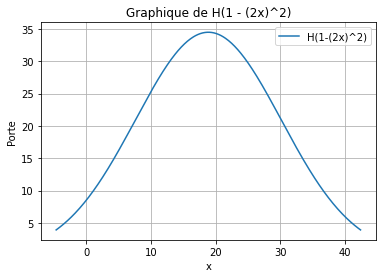

In [81]:
def gaussian_convolved_rect(x, A, x0 , l, sigma):
    return (A/ 2) * (erf((x + l / 2 - x0) / (np.sqrt(2) * sigma)) - erf((x - l / 2 - x0) / (np.sqrt(2) * sigma)))




# A est un paramètre pour la fonction H_porte
A = 488.4184894419905 
x0 = 18.85752096292564
l = 1.9981480552665294 
sigma = 11.270630742565332 

# Générer des valeurs pour x
x = np.linspace(x0 - l/2 - 2*sigma , x0 + l/2 + 2*sigma, 400)

y =  gaussian_convolved_rect(x, A, x0 , l, sigma)
#y =  gaussian_convolved_rect(x, 488.4184894419905 18.85752096292564 1.9981480552665294 11.270630742565332)



# Tracer le résultat
plt.plot(x, y, label=f'H(1-(2x)^2)')
plt.xlabel('x')
plt.ylabel('Porte')
plt.title('Graphique de H(1 - (2x)^2)')
plt.grid(True)
plt.legend()
plt.show()

22.56179322908434 18.0 11.0


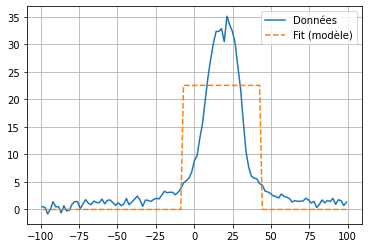

Largeur à mi-hauteur (FWHM) approximative : 25.903020495340442


In [59]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.special import erf

# Modèle de la porte convoluée avec une gaussienne
def Porte(x, A, mu, sigma):
    return A*H_porte((x-mu)/sigma)

Donnees = DONNEES[-2]
X, Y, label = Donnees
mask = (X < 100) * (X > -100)
x_data , y_data = X[mask], Y[mask]
# Ajustement de la fonction aux données

lower_bounds = [0,0, 0]  # bornes inférieures
upper_bounds = [100, 500, 300,]    # bornes supérieures

# Ajustement de la fonction porte convoluée avec une gaussienne aux données
popt, pcov = curve_fit(Porte, x_data, y_data, p0=[35, 18, 22/2], bounds=(lower_bounds, upper_bounds))


# Paramètres ajustés : largeur de la porte, centre, écart-type de la gaussienne
A, mu, sigma = popt
print(A, mu, sigma)

# Tracer les données et le modèle ajusté
plt.plot(x_data, y_data, label='Données')
plt.plot(x_data, Porte(x_data, *popt), label='Fit (modèle)', linestyle='--')
plt.grid()
plt.legend()
plt.show()


FWHM = 2 * np.sqrt(2 * np.log(2)) * sigma

print(f"Largeur à mi-hauteur (FWHM) approximative : {FWHM}")

In [48]:
26/18

1.4444444444444444

## Voir les données

In [3]:
print(date_donnees)
date_donnees = '2024-04-24'
print(date_donnees)
DONNEES = f_DONNEES(date_donnees) 

NameError: name 'date_donnees' is not defined

In [4]:
%matplotlib inline
for X , Y , label in DONNEES[:] : plt.plot ( X , Y , label = label )  
plt.xlabel(r"$x \quad (\mu m)$")  # Label de l'axe des X (avec notation LaTeX)
plt.ylabel(r"$n(x) \quad (1/\mu m^1)$")  # Label de l'axe des Y (avec notation LaTeX)
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
#plt.title(r"$\mu = $ {0:.3f} nK, $T = $ {1:.3f} nK, $\ell = $ {2:.3f} $\mu m$".format(mu, T, Taille))
plt.legend()
plt.show()

X , Y , label = DONNEES[2]
plt.plot ( X , Y , label = label )
mask = (X > -20)*(X < 60)
plt.plot ( X[mask] , Y[mask] ,label = "pour $N_{at}$")
plt.xlabel(r"$x \quad (\mu m)$")  # Label de l'axe des X (avec notation LaTeX)
plt.ylabel(r"$n(x) \quad (1/\mu m^1)$")  # Label de l'axe des Y (avec notation LaTeX)
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.legend()
plt.show()
Nat_0 = sum(Y[mask])
print ( Nat_0 )

X , Y , label = DONNEES[1]
plt.plot ( X , Y , label = label )

if date_donnees == "2024-02-09" : mask = (X > -220)*(X < 50)  
elif date_donnees == "2024-02-29" : mask = (X > -220)*(X < 50)
elif date_donnees == "2024-04-24" : mask = (X > -200)*(X < 50) 
    
plt.plot ( X[mask] , Y[mask] , label = "pour $N_{at}$")
plt.xlabel(r"$x \quad (\mu m)$")  # Label de l'axe des X (avec notation LaTeX)
plt.ylabel(r"$n(x) \quad (1/\mu m^1)$")  # Label de l'axe des Y (avec notation LaTeX)
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.legend()
plt.show()


X , Y , label = DONNEES[3]
plt.plot ( X , Y , label = label )


if date_donnees == '2024-02-09': mask = (X > -180) & (X < 10)
elif date_donnees == '2024-02-29': mask = (X > -220) & (X < 10)
elif date_donnees == '2024-04-24': mask = (X > -110) & (X < 50)

mask = (X > -400) & (X < 400)       
  
plt.plot ( X[mask] , Y[mask] , label = "pour $N_{at}$")
plt.xlabel(r"$x \quad (\mu m)$")  # Label de l'axe des X (avec notation LaTeX)
plt.ylabel(r"$n(x) \quad (1/\mu m^1)$")  # Label de l'axe des Y (avec notation LaTeX)
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.legend()
plt.show()
Nat_1 = integrale(X[mask], Y[mask])
print ('nat ' ,  Nat_1)


print((Nat_1-Nat_0)/Nat_0)

X , Y , label = DONNEES[2]
plt.plot ( X , Y , label = label )


if date_donnees == '2024-02-09': x0 , Taille = 18.3 , 24.2
elif date_donnees == '2024-02-29': x0 , Taille = 18.3 , 24.2
elif date_donnees == '2024-04-24': x0 , Taille = 18.3 , 24.2

mask = (X >= x0 -Taille/2)*(X<x0 + Taille/2) 

        
  
plt.plot ( X[mask] , Y[mask] , label = "pour $N_{at}$")
plt.xlabel(r"$x \quad (\mu m)$")  # Label de l'axe des X (avec notation LaTeX)
plt.ylabel(r"$n(x) \quad (1/\mu m^1)$")  # Label de l'axe des Y (avec notation LaTeX)
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.legend()
plt.show()
Nat_1 = integrale(X[mask], Y[mask])
print ('nat ' ,  Nat_1)




NameError: name 'DONNEES' is not defined

## Asymetry 

In [35]:
#print(date_donnees)
date_donnees = '2024-04-24'
print(date_donnees)
DONNEES = f_DONNEES(date_donnees) 
X , Y , label = DONNEES[3]

2024-04-24


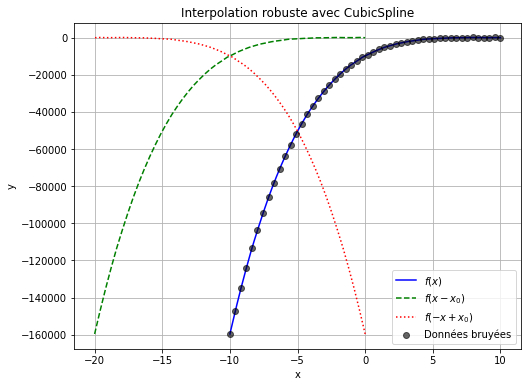

In [36]:
### test

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import CubicSpline

# Exemple de données bruitées
x = np.linspace(-10, 10, 50)  # 50 points entre -10 et 10
xx = x - 10 
y = (xx) **2  - xx**4 + np.random.normal(0, 50, size=x.shape)  # Fonction avec bruit

# Créer un objet CubicSpline pour l'interpolation
cs = CubicSpline(x, y, bc_type='natural')  # Utilisation de conditions aux bords naturelles

# Définir x0 (valeur de décalage)
x0 = 10

# Créer un vecteur dense de x pour un tracé plus lisse
x_vals = np.linspace(-10, 10, 1000)  # 1000 points pour un tracé plus précis

# Calculer les valeurs de y pour chaque transformation
y_original = cs(x_vals)  # f(x)
y_shifted = cs(x_vals - x0)  # f(x - x0)
y_flipped = cs(-x_vals - x0)  # f(-x + x0)

# Tracer les fonctions
plt.figure(figsize=(8, 6))
plt.plot(x_vals, y_original, label='$f(x)$', color='blue')
#plt.plot(x_vals, y_shifted, label='$f(x - x_0)$', color='green', linestyle='--')
plt.plot(x-x0, y, label='$f(x - x_0)$', color='green', linestyle='--')
#plt.plot(x_vals, y_flipped, label='$f(-x + x_0)$', color='red', linestyle=':')
plt.plot(-x -x0, y, label='$f(-x + x_0)$', color='red', linestyle=':')
plt.scatter(x, y, color='black', zorder=5, label='Données bruyées', alpha=0.6)
plt.title('Interpolation robuste avec CubicSpline')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid(True)
plt.show()


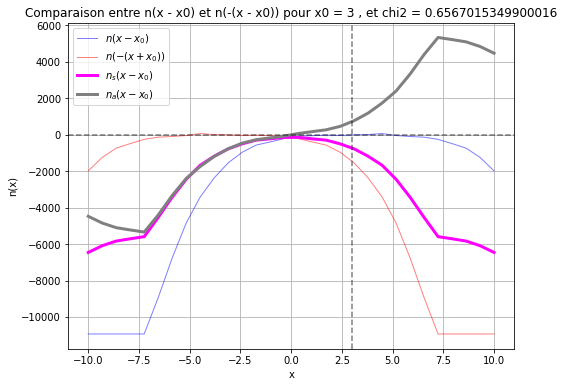

Chi²: 0.6567015349900016


NameError: name 'CHI2' is not defined

<Figure size 576x432 with 0 Axes>

In [37]:


import numpy as np
import matplotlib.pyplot as plt

def norme(x , p ):
    if p == 0 : return float('inf') if any (el != 0 for el in x ) else 0
    elif p == float('inf') : return np.max(np.abs(x))
    else : return np.power(np.sum(np.power(np.abs(x),p)), 1/p)

def chi_squared_and_plot(x, y, x0, sigma=None):
    """
    Fonction pour calculer le chi² entre n(x) et n(-(x - x0)) et tracer les deux fonctions.

    Arguments:
    - x: liste ou tableau des valeurs de x.
    - y: liste ou tableau des valeurs n(x) associées à chaque x.
    - x0: décalage pour la transformation de x vers -(x - x0).
    - sigma: incertitude sur y (optionnel). Si non fourni, une incertitude de 1 est supposée.

    Retourne:
    - La valeur du chi².
    """

    # Fonction d'interpolation de n(x) (renvoie 0 si x est en dehors des bornes)
    def n(x_val):
        if x_val < min(x):
            return y[0]  # Retourne 0 si x est hors des bornes
        elif x_val > max(x):
            return y[-1]

        from scipy.interpolate import CubicSpline

        # Créer l'interpolateur spline cubique
        spline = CubicSpline(x, y)

        # Générer des points à interpoler
        y_new = spline(x_val)
        return y_new#np.interp(x_val, x, y)  # Interpolation linéaire

    # Calcul des différences entre n(x) et n(-(x - x0))
    #diff = [(n(xi-x0) - n(-xi - x0)) for xi in x]
    #n_x = [n(xi)for xi in x]
    n_x_minus_x0 = [n(xi-x0)for xi in x]
    #n_neg_x_plus_x0 = [n(-(xi-x0))for xi in x]
    n_neg_x_minus_x0 = [n(-xi-x0)for xi in x]

    n_neg_x_minus_x0 = [item if isinstance(item, np.float64) else item.item() for item in n_neg_x_minus_x0]
    n_x_minus_x0 = [item if isinstance(item, np.float64) else item.item() for item in n_x_minus_x0]

    n_s = (np.array(n_x_minus_x0) + np.array(n_neg_x_minus_x0))/2
    n_a = (np.array(n_x_minus_x0) - np.array(n_neg_x_minus_x0))/2

    #print (n_x_minus_x0 )

    # Vérification de la taille des deux listes et de leurs types
    #print(f"\nType et taille des listes :")
    #print(f"n_x_minus_x0 : type = {type(n_x_minus_x0)}, taille = {len(n_x_minus_x0)}")
    #print(f"n_neg_x_minus_x0 : type = {type(n_neg_x_minus_x0)}, taille = {len(n_neg_x_minus_x0)}")


    # Vérification de la présence de NaN dans les deux listes
    #if np.any(np.isnan(n_x_minus_x0)):
    #    print("La liste n_x_minus_x0 contient des NaN.")
    #else:
    #    print("La liste n_x_minus_x0 ne contient pas de NaN.")
    
    #if np.any(np.isnan(n_neg_x_minus_x0)):
    #    print("La liste n_neg_x_minus_x0 contient des NaN.")
    #else:
    #    print("La liste n_neg_x_minus_x0 ne contient pas de NaN.")
    
    # Vérification de la taille des deux listes
    #if len(n_x_minus_x0) == len(n_neg_x_minus_x0):
    #    print(f"Les deux listes ont la même taille : {len(n_x_minus_x0)} éléments.")
    #else:
    #    print(f"Les listes ont des tailles différentes : n_x_minus_x0 = {len(n_x_minus_x0)}, n_neg_x_minus_x0 = {len(n_neg_x_minus_x0)}.")
    
    # Si les tailles sont égales, on peut calculer la différence
    #if len(n_x_minus_x0) == len(n_neg_x_minus_x0):
    #    diff = np.array(n_x_minus_x0) - np.array(n_neg_x_minus_x0)
    #    print(f"Différence calculée avec {len(diff)} éléments.")
    #else:
    #    print("Les tailles des listes ne correspondent, donc la différence ne peut pas être calculée.")

    diff = np.array(n_x_minus_x0) - np.array(n_neg_x_minus_x0)

    # Calcul de chi²
    if sigma is None:sigma = np.ones_like(y)  # Si sigma n'est pas spécifié, on prend une incertitude de 1

    #chi2 = np.sum((np.array(diff) ** 2) / (np.array(sigma) ** 2))
    #chi2 = np.sum((np.array(diff) ** 2) / (np.array(n_x_minus_x0) ** 2))
    chi2 = norme(diff/2, 2)/norme(n_x_minus_x0 , 2)
    
    
    # Tracé des deux fonctions : n(x - x0) et n(-(x - x0))
    x_vals = x
    #x_vals = np.linspace(min(x) - 1, max(x) + 1, 500)  # Création d'une plage x fine pour le tracé

    # Calcul des valeurs n(x - x0) et n(-(x - x0)) pour chaque x
    #n_x = [n(xv) for xv in x_vals]
    #n_x_minus_x0 = [n(xv - x0) for xv in x_vals]
    #n_neg_x_plus_x0 = [n(-(xv - x0)) for xv in x_vals]

    # Tracé des deux courbes
    plt.figure(figsize=(8, 6))
    #plt.plot(x_vals, n_x, label=r'$n(x)$', color='blue')
    plt.plot(x_vals, n_x_minus_x0, label=r'$n(x - x_0)$', color='blue' ,linewidth=1, alpha=0.5 )
    #plt.plot(x_vals, n_neg_x_plus_x0, label=r'$n(-(x - x_0))$', color='red', linestyle='--')
    plt.plot(x_vals, n_neg_x_minus_x0, label=r'$n(-(x + x_0))$', color='red' , linewidth=1, alpha=0.5)
    plt.plot(x_vals, n_s, label=r'$n_s(x - x_0)$', color='magenta', linestyle='-' , linewidth=3)
    plt.plot(x_vals, n_a, label=r'$n_a(x - x_0)$', color='grey', linestyle='-' , linewidth=3)
    #plt.scatter(x, y, color='black', label='Données originales')
    plt.title(f'Comparaison entre n(x - x0) et n(-(x - x0)) pour x0 = {x0} , et chi2 = {chi2}')
    plt.axvline(x=x0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
    plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
    plt.xlabel('x')
    plt.ylabel('n(x)')
    plt.legend()
    plt.grid(True)
    plt.show()

    return chi2

# Exemple d'utilisation
x = np.linspace(-10, 10, 30)
y = x**2 + x**3 -x**4 + np.random.normal(0, 55, size=x.shape) # Par exemple n(x) = x^2
x0 = 3  # Décalage

# Appel de la fonction chi_squared_and_plot
chi2_value = chi_squared_and_plot(x, y, x0)
print("Chi²:", chi2_value)

#CHI2 = np.array([chi_squared_and_plot(x, y, x0, sigma=None) for x0 in x])

plt.figure(figsize=(8, 6))
plt.plot(x, CHI2, label=f'$\\chi^2$', color='blue')
plt.title(f'Comparaison entre n(x - x0) et n(-(x - x0)) pour x0 = {x0}')
plt.axvline(x=x0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.xlabel('$x_0$')
plt.ylabel(f'$\\chi^2$')
plt.legend()
plt.grid(True)
plt.show()

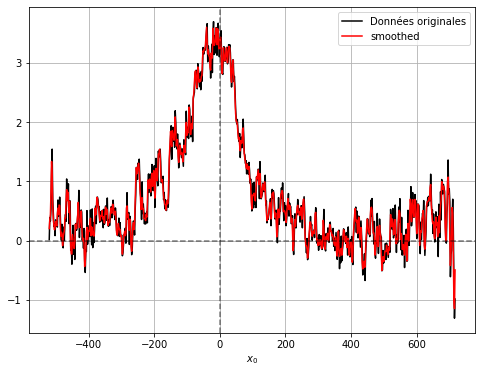

In [38]:
# il faut lisser sinom beaucoup d'extremum 

window_size = 2
y_smoothed = np.convolve(Y, np.ones(window_size)/window_size, mode='same')
plt.figure(figsize=(8, 6))

plt.plot(X, Y, color='black', label='Données originales')
plt.plot(X, y_smoothed, label=f'smoothed', color='red' , linewidth=1.5 )
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.xlabel('$x_0$')
plt.legend()
plt.grid(True)
plt.show()

2024-04-24


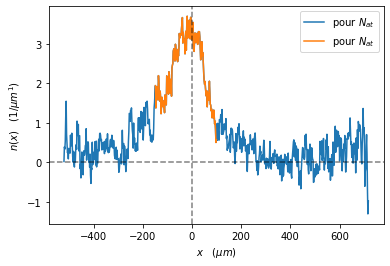

In [39]:
print(date_donnees)
if date_donnees == '2024-02-09': mask = (X > -200) & (X < 50)
elif date_donnees == '2024-02-29': 
    mask = (X > -220) & (X < 20)
    MASK = (X>0)*(X<150) 
    p0 =  117 # Estimation initiale pour x0
elif date_donnees == '2024-04-24': 
    mask = (X > -150) & (X < 100)
    MASK = (X>10)*(X<20) 
    p0 =  17 # Estimation initiale pour x0
plt.plot ( X , Y , label = "pour $N_{at}$")
plt.plot ( X[mask] , Y[mask] , label = "pour $N_{at}$")
plt.xlabel(r"$x \quad (\mu m)$")  # Label de l'axe des X (avec notation LaTeX)
plt.ylabel(r"$n(x) \quad (1/\mu m^1)$")  # Label de l'axe des Y (avec notation LaTeX)
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.legend()
plt.show()

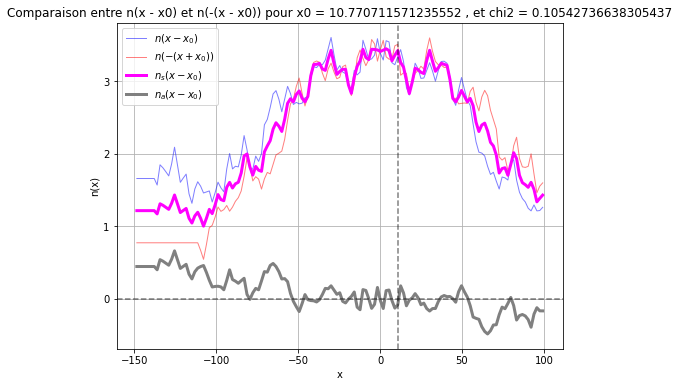

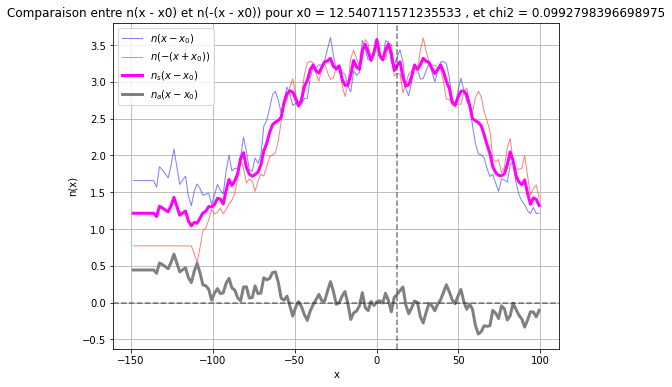

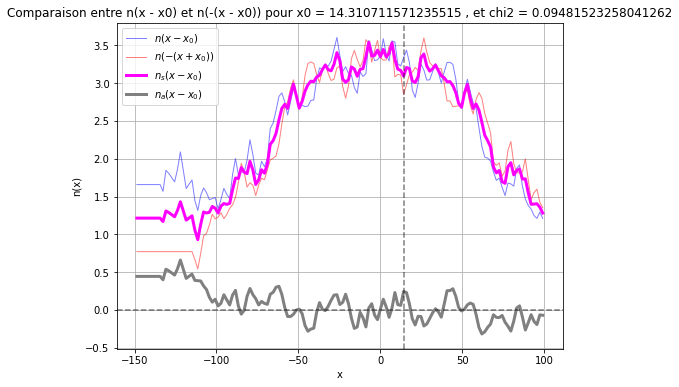

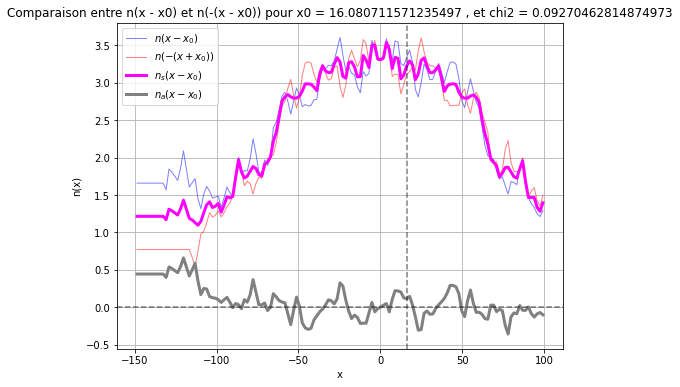

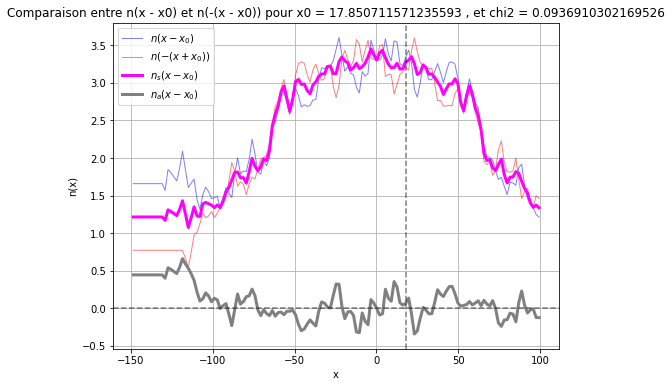

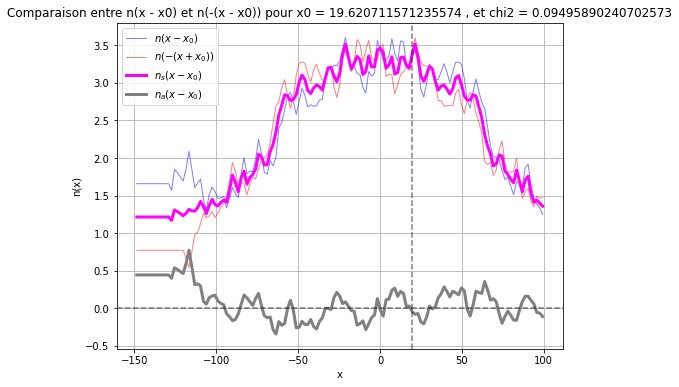

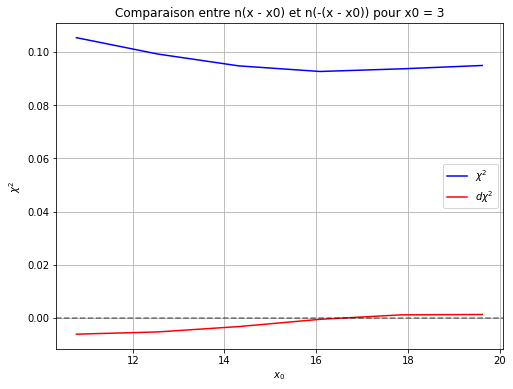

In [40]:
# Calculer la fonction 
#MASK = mask
#CHI2 = np.array([chi_squared_and_plot(np.flip(X[mask]), np.flip(Y[mask]), x0, sigma=None) for x0 in np.flip(X[MASK])])
CHI2 = np.array([chi_squared_and_plot(np.flip(X[mask]), np.flip(y_smoothed[mask]), x0, sigma=None) for x0 in np.flip(X[MASK])])
plt.figure(figsize=(8, 6))
plt.plot(np.flip(X[MASK]), CHI2, label=f'$\\chi^2$', color='blue')
plt.plot(np.flip(X[MASK]), np.gradient(CHI2), label=f'$d\\chi^2$', color='red')
plt.title(f'Comparaison entre n(x - x0) et n(-(x - x0)) pour x0 = {x0}')
#plt.axvline(x=x0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
#plt.xlim([90 , 120 ])
#plt.ylim([-100, 200 ])
plt.xlabel('$x_0$')
plt.ylabel(f'$\\chi^2$')
plt.legend()
plt.grid(True)
plt.show()

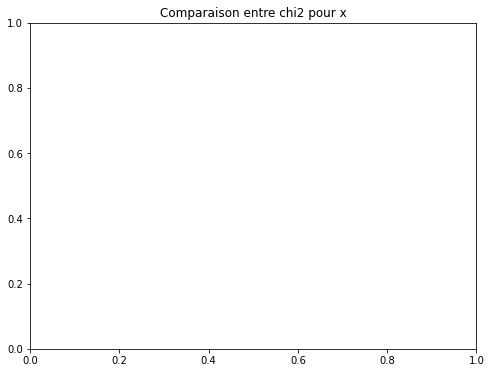

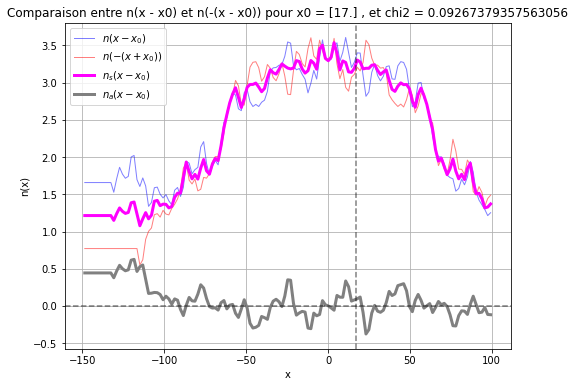

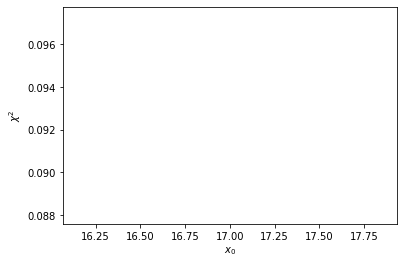

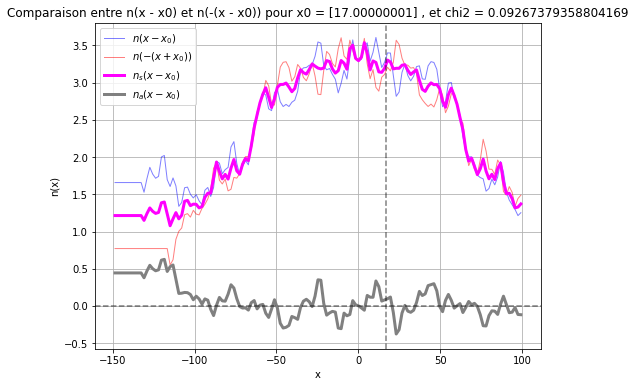

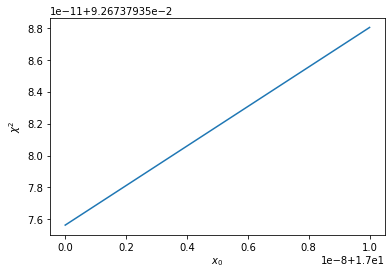

...

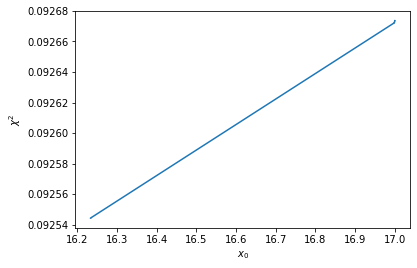

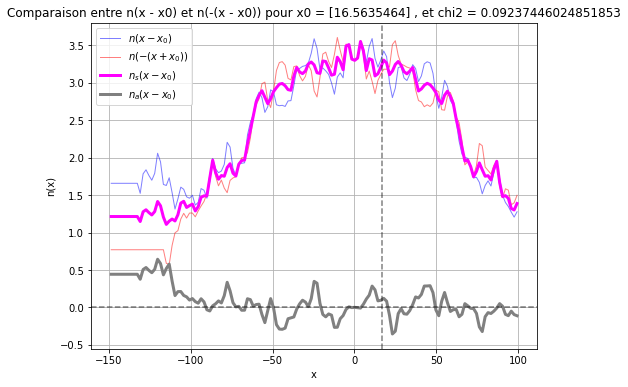

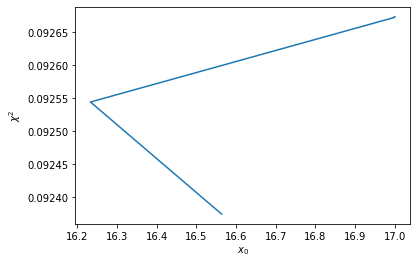

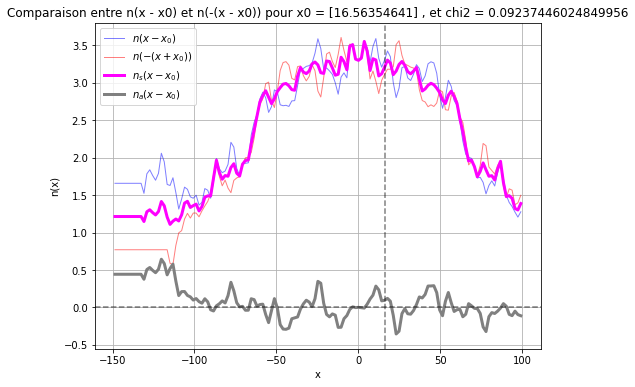

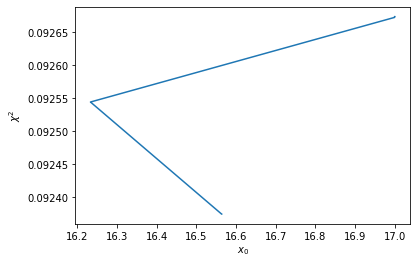

Optimisation terminée. x0 optimisé : 16.5635464024733, Chi-carré final : 0.09237446024851853


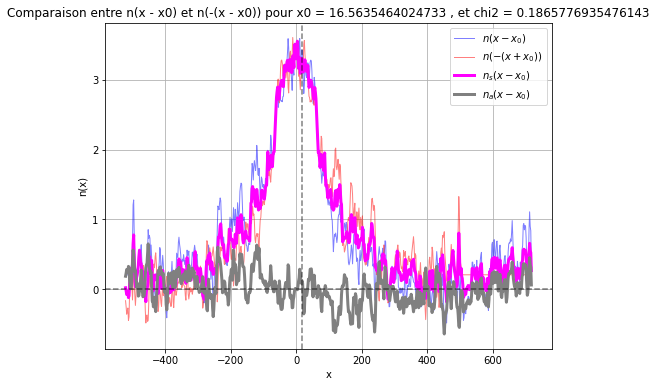

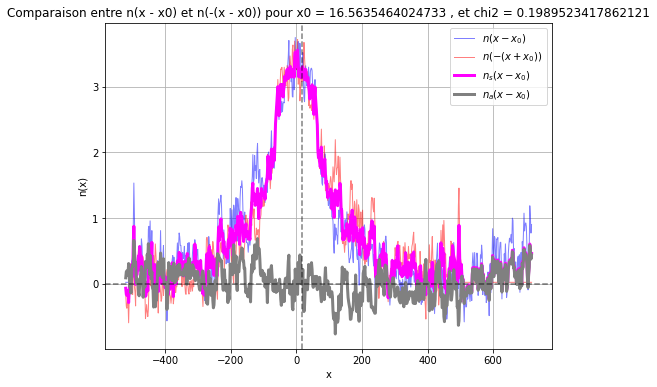

np.float64(0.1989523417862121)

In [41]:
#Cercher min 

import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize

X0 , YChi2 = [] , []
plt.figure(figsize=(8, 6))
plt.title(f'Comparaison entre chi2 pour x')
# Fonction à minimiser (chi-carré en fonction de x0)
def objective_function(x0, x, y):
    chi = chi_squared_and_plot(x, y, x0)
    X0.append(x0)
    YChi2.append(chi)
    plt.plot( X0 , YChi2 ) 
    plt.xlabel('$x_0$')
    plt.ylabel(f'$\\chi^2$')
    plt.show()
    return chi


# Paramètres d'initialisation
#p0 =  117 # Estimation initiale pour x0
lower_bound = 0.5*p0  # Borne inférieure pour x0
upper_bound = 1.5*p0  # Borne supérieure pour x0

# Utilisation de scipy.optimize.minimize pour trouver le minimum de chi-carré
result = minimize(
    objective_function,  # Fonction objectif
    p0,  # Estimation initiale de x0
    args=(np.flip(X[mask]), np.flip(y_smoothed[mask])),  # Arguments supplémentaires (x_data, y_data)
    #args=(np.flip(X[mask]), np.flip(Y[mask])),  # Arguments supplémentaires (x_data, y_data)
    bounds=[(lower_bound, upper_bound)],  # Bornes pour x0
    method='L-BFGS-B'  # Méthode de quasi-Newton avec bornes
)

# Résultat de l'optimisation
print(f"Optimisation terminée. x0 optimisé : {result.x[0]}, Chi-carré final : {result.fun}")


chi_squared_and_plot(np.flip(X), np.flip(y_smoothed), result.x[0])
chi_squared_and_plot(np.flip(X), np.flip(Y), result.x[0])

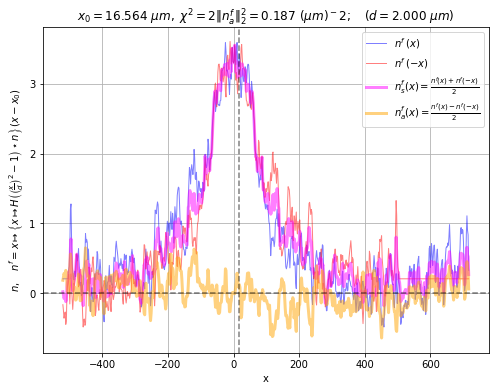

In [42]:
# Fonction d'interpolation de n(x) (renvoie 0 si x est en dehors des bornes)
def n(x_val):
    if x_val < min(x):
        return y[0]  # Retourne 0 si x est hors des bornes
    elif x_val > max(x):
        return y[-1]

    from scipy.interpolate import CubicSpline

    # Créer l'interpolateur spline cubique
    spline = CubicSpline(x, y)

    # Générer des points à interpoler
    y_new = spline(x_val)
    return y_new#np.interp(x_val, x, y)  # Interpolation linéaire

x , y = np.flip(X), np.flip(y_smoothed)
#x , y = np.flip(X), np.flip(Y)

x0 = result.x[0]
n_x_minus_x0 = [n(xi-x0)for xi in x]

n_neg_x_minus_x0 = [n(-xi-x0)for xi in x]

n_neg_x_minus_x0 = [item if isinstance(item, np.float64) else item.item() for item in n_neg_x_minus_x0]
n_x_minus_x0 = [item if isinstance(item, np.float64) else item.item() for item in n_x_minus_x0]

n_s = (np.array(n_x_minus_x0) + np.array(n_neg_x_minus_x0))/2
n_a = (np.array(n_x_minus_x0) - np.array(n_neg_x_minus_x0))/2


diff = np.array(n_x_minus_x0) - np.array(n_neg_x_minus_x0)

# Calcul de chi²
sigma = None
if sigma is None:sigma = np.ones_like(y)  # Si sigma n'est pas spécifié, on prend une incertitude de 1

chi2 = np.sum((np.array(diff) ** 2) / (np.array(sigma) ** 2))
chi2 = norme(diff/2, 2)/norme(n_x_minus_x0 , 2)

x_vals = x

# Tracé des deux courbes
plt.figure(figsize=(8, 6))
#plt.plot(x_vals, n_x, label=r'$n(x)$', color='blue')
plt.plot(x_vals, n_x_minus_x0, label=r'$n^f \,(x)$', color='blue' ,  linewidth=1, alpha=0.5 )


#plt.plot(x_vals, n_neg_x_plus_x0, label=r'$n(-(x - x_0))$', color='red', linestyle='--')
plt.plot(x_vals, n_neg_x_minus_x0, label=r'$n^f \,(-x )$', color='red',  linewidth=1, alpha=0.5)
plt.plot(x_vals, n_s, label=r'$n_s^f(x) = \frac{n^f(x) + n^f(-x)}{2}$', color='magenta', linestyle='-' , linewidth=3 , alpha = 0.5 )
plt.plot(x_vals, n_a, label=r'$n_a^f(x) = \frac{n^f(x) - n^f(-x)}{2}$', color='orange', linestyle='-' , linewidth=3 , alpha = 0.5 ) 
#plt.scatter(X, Y, color='black', label=r'Données originales $n(x)$')
plt.title(
    f'$x_0 = {x0:.3f}~\mu m, \; \\chi^2 = 2 \\Vert n_a^f \\Vert^2_2 = {chi2:.3f}~(\mu m)^{-2}; \quad (d = {window_size:.3f}~\mu m)$'
)
plt.axvline(x=x0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.xlabel('x')
plt.ylabel(r'$n , \quad n^f = x \mapsto \left \{x \mapsto H\left(\left(\frac{x}{d}\right)^2 - 1\right) \star n \right\}\, ( x -x_0 ) $ ')
plt.legend()
plt.grid(True)
plt.savefig('graphique_transparent.png', transparent=True)
plt.savefig('graphique_high_res.png', dpi=300) 
plt.show()


In [62]:
colors = [
    #"#1f77b4",  # Bleu
    #"#ff7f0e",  # Orange
    #"#2ca02c",  # Vert
    #"#d62728",  # Rouge
    "#9467bd",  # Violet
    "#8c564b",  # Marron
    "#e377c2",  # Rose
    "#7f7f7f",  # Gris
    "#bcbd22",  # Jaune Olive
    "#17becf"   # Cyan
]

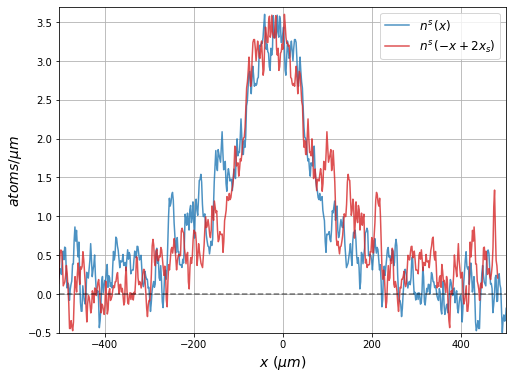

In [64]:
# Tracé des deux courbes
plt.figure(figsize=(8, 6))
#plt.plot(x_vals, n_x, label=r'$n(x)$', color='blue')
#plt.plot(x_vals, n_x_minus_x0, label=r'$n^f \,(x)$', color='blue' ,  linewidth=1, alpha=0.5 )
#plt.plot(X+x0, Y, label=r'$n \,(x -x_0)$', color="#1f77b4" ,  linewidth=1.5, alpha=0.8 )
#plt.plot(X+x0, y_smoothed, label=r'$n^s \,(+x)$', color="#1f77b4" ,  linewidth=1.5, alpha=0.8 )
plt.plot(X, y_smoothed, label=r'$n^s \,(x)$', color="#1f77b4" ,  linewidth=1.5, alpha=0.8 )


#plt.plot(x_vals, n_neg_x_plus_x0, label=r'$n(-(x - x_0))$', color='red', linestyle='--')
#plt.plot(x_vals, n_neg_x_minus_x0, label=r'$n^f \,(-x )$', color='red',  linewidth=1, alpha=0.5)
#plt.plot(-X-x0, Y, label=r'$n \,(-x-x_0 )$', color="#d62728",  linewidth=1.5, alpha=0.8)
#plt.plot(-X-x0, y_smoothed, label=r'$n^s \,(-x)$', color="#d62728",  linewidth=1.5, alpha=0.8)
plt.plot(-X-2*x0, y_smoothed, label=r'$n^s \,(-x+2x_s)$', color="#d62728" ,  linewidth=1.5, alpha=0.8 )

#plt.plot(X+x0, y_smoothed, label=r'$n^f \,(x)$', color="#7f7f7f" ,  linewidth=1.5, alpha=1 )
#plt.plot(-X-x0, y_smoothed, label=r'$n^f \,(-x)$', color="#8c564b",  linewidth=1.5, alpha=1)
#plt.plot(x_vals, n_s, label=r'$n_s^f(x) = \frac{n^f(x) + n^f(-x)}{2}$', color='magenta', linestyle='-' , linewidth=3 , alpha = 0.5 )
#plt.plot(x_vals, n_a, label=r'$n_a^f(x) = \frac{n^f(x) - n^f(-x)}{2}$', color='orange', linestyle='-' , linewidth=3 , alpha = 0.5 ) 
#plt.scatter(X, Y, color='black', label=r'Données originales $n(x)$')
#plt.title(
#    f'$x_s = {x0:.3f}~\mu m, \; \\chi = \\Vert n_a^s \\Vert_2/\\Vert n^s \\Vert_2= {chi2:.3f}; \quad (d = {window_size:.0f}~\mu m)$',
#    fontsize=14, color='black'
#)
#plt.axvline(x=X[-1]+x0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
#plt.axvline(x=-X[-1]-x0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.xlim([X[-1]+x0 , -X[-1]-x0])
plt.ylim([-0.5 , 3.7])
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.xlabel(r'$x~(\mu m)$', fontsize=14, color='black')#, fontweight='bold')
#plt.ylabel(r'$n^s ~\colon~ x \mapsto \left \{n \star \left(y \mapsto   H\left(\left(\frac{y}{d}\right)^2 - 1\right) \right) \right\}\, ( x -x_c ) ~~(1/\mu m )$ ' , fontsize=14, color='black' )
#plt.ylabel(r'$n^s = \left \{n \star \left(y \mapsto   H\left(\left(\frac{y}{d}\right)^2 - 1\right) \right) \right\} ~~(1/\mu m )$ ' , fontsize=14, color='black' )
plt.ylabel(r'$atoms/\mu m $ ' , fontsize=14, color='black' )

plt.legend(fontsize=12)
plt.grid(True)
plt.savefig('graphique_transparent.png', transparent=True)
plt.savefig('graphique_high_res.png', dpi=300) 
plt.show()

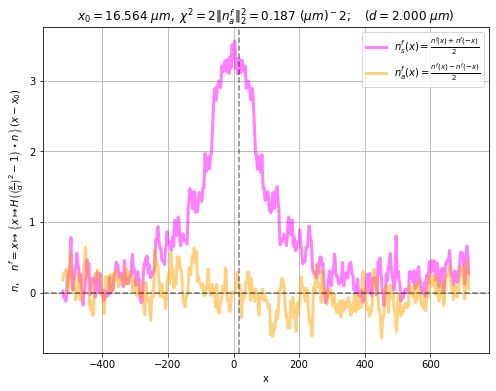

In [45]:
# Tracé des deux courbes
plt.figure(figsize=(8, 6))
#plt.plot(x_vals, n_x, label=r'$n(x)$', color='blue')
plt.plot(x_vals, n_s, label=r'$n_s^f(x) = \frac{n^f(x) + n^f(-x)}{2}$', color='magenta', linestyle='-' , linewidth=3 , alpha = 0.5 )
plt.plot(x_vals, n_a, label=r'$n_a^f(x) = \frac{n^f(x) - n^f(-x)}{2}$', color='orange', linestyle='-' , linewidth=3 , alpha = 0.5 ) 
#plt.scatter(X, Y, color='black', label=r'Données originales $n(x)$')
plt.title(
    f'$x_0 = {x0:.3f}~\mu m, \; \\chi^2 = 2 \\Vert n_a^f \\Vert^2_2 = {chi2:.3f}~(\mu m)^{-2}; \quad (d = {window_size:.3f}~\mu m)$'
)
plt.axvline(x=x0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.xlabel('x')
plt.ylabel(r'$n , \quad n^f = x \mapsto \left \{x \mapsto H\left(\left(\frac{x}{d}\right)^2 - 1\right) \star n \right\}\, ( x -x_0 ) $ ')
plt.legend()
plt.grid(True)
plt.savefig('graphique_transparent.png', transparent=True)
plt.savefig('graphique_high_res.png', dpi=300) 
plt.show()

## Premier estimation de taille et centre sur expension 1ms

NameError: name 'time_list' is not defined

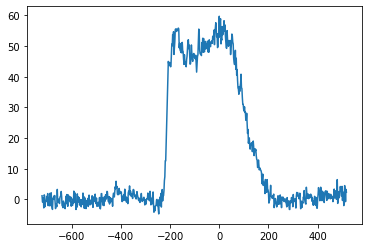

In [106]:
X , Y , label = DONNEES[0]
        #ax1.plot((X-x0)/t, Y*t/Taille, label=label + ' t : ' + str (t))
if date_donnees == '2024-02-09':x0 = 76.25 - 6.82
        #elif date_donnees == '2024-02-29':x0 = 0
else :x0 = X[np.argmax(Y)]
            
plt.plot((X-x0), Y, label=label)
print (time_list[-1] )
mu, T, Taille = triple
filename = f"{date}/density_expansion_nu_{nom}_{mup:.3f}_{T:.3f}_{Taille:.3f}_{time_list[-1]:.3f}.npz"
data_s = np.load(filename) 
x0 = data_s[0,np.argmax(data_s[1, :])]
x0=0
X_simul = data_s[0, :] - x0
Y_simul = data_s[1,:]
plt.plot(X_simul*Taille , Y_simul)
plt.xlim(-500, 250) 
plt.show()

print(filename)


bord_gauche :  33.19021868848222  ; bord_droite : -21.6797813115179
centre : 5.7552186884821595
Taille bord -54.87000000000012
le nombre d'atome est  1829.1394473725968


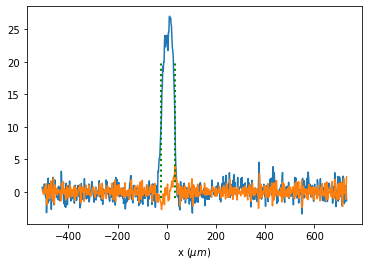

In [107]:
## premier ajustement de x0 et Taille

def taille(X,Y):
    
    bord_gauche = X[np.argmax(np.gradient(Y))]
    bord_droite = X[np.argmin(np.gradient(Y))]
    print ("bord_gauche : ", bord_gauche , ' ; bord_droite :' , bord_droite)
    
    print("centre :", (bord_gauche+bord_droite)/2)
    
    plt.plot(X,Y) 
    plt.plot(X,np.gradient(Y))
    plt.vlines(x=bord_droite, ymin=-1, ymax=20, colors='green', ls=':', lw=2)
    plt.vlines(x=bord_gauche, ymin=-1, ymax=20, colors='green', ls=':', lw=2)
    #plt.xlim([-50 , 50])
    plt.xlabel('x $(\mu m)$')
    #plt.show()
    
    Taille_exp = bord_droite - bord_gauche 
    print ("Taille bord" , Taille_exp)
    
    print("le nombre d'atome est " , np.sum(Y[Y>0])*abs(X[1]-X[0]))

X , Y , label = DONNEES[2]

taille(X,Y)

## evoulition 1 bord 

In [284]:
def plot_graph2_edge(date, nom, triple, time_list , DONNEES  , id_donnes = -1):
    #mu, T, x00, Taille = triple
    mu, T= triple
    # Charger les données
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    # Créer un graphique pour la densité multipliée par le temps en fonction de la position/temps
    
    filename = f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz"
    #print ( 'filename =' ,filename )
    theta_discr = np.load(filename)
    #ax1.set(xlabel="$x/\\tau\quad (\mu m / ms ) $", ylabel="$n(x)*\\tau/\ell\quad ( ms/\mu m^2 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x00:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
    ax1.set(xlabel="$x/\\tau\quad (\mu m / ms ) $", ylabel="$n(x)*\\tau/\ell\quad ( ms/\mu m^2 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ ")
    
    if date_donnees == '2024-02-09': t  = 50
    elif date_donnees == '2024-02-29':t = 50
    elif date_donnees == '2024-04-24':t = 30
    else : t = time_list[-1] 
    
    if DONNEES != None :
        for Donnees in [DONNEES[id_donnes]] :        
            X , Y , label = Donnees
            if date_donnees == '2024-02-09':x0 = 76.25 - 6.82
            elif date_donnees == '2024-02-29':x0 = - 6
            elif date_donnees == '2024-04-24':x0 = 0 
            else :x0 = X[np.argmax(Y)]

            X = X#-x0
            ax1.plot(X/t, Y, label=label)
    #print ( 'mu , T , Taille = ' , mu, T, Taille)
    #print ( 'time_list , ' , time_list)
    for t in time_list:
        filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{t:.3f}.npz"
        #print ( 'filename =' ,filename )
        #data_s = np.load(filename) 
        #x0 = data_s[0,np.argmax(data_s[1, :])]
        #x0 =0
        #X_simul = data_s[0, :] #- x0
        #print ( data_s , data_s.size )
        #ax1.plot(X_simul/t*Taille, data_s[1, :]*t/Taille, label=f"$\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , $\\tau$ = {t:.3f} $m$s")
    
    t = "veff_bord"
    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{t}.npz"
    #nom2 = "theta_edge_1.0_ih2"
    #ta = time_list[0]
    #filename = f"{date}/density_expansion_nu_{nom2}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{ta:.3f}.npz"
    #print ( 'filename =' ,filename )
    data_s = np.load(filename) 
    x0 = data_s[0,np.argmax(data_s[1, :])]
    x0 =0
    X_simul = data_s[0, :] #- x0
    
    #np.savez(f"PourIsa/donne.npz", [X/t , Y*t/Taille])
    #np.savez(f"PourIsa/simul_mu-{mu:.3f}_T-{T:.3f}_Taille-{Taille:.3f}_.npz", [X_simul/ta*Taille , data_s[1, :]*t/Taille])
    
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    filename = f"{date}/rho_{nom2[:index_last_underscore]}_discr_{nom2[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x00:.3f}.npz"
    #print ( 'filename =' ,filename )
    #rho_theta_star_discr = np.load(filename) 
    #theta0 = theta_discr[np.argmax(rho_theta_star_discr)]
    #theta0 =  0 
    #ax1.plot(theta_discr-theta0, rho_theta_star_discr, label=f"$\\rho^\\star \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x00:.3f} $\\mu$m , $\\ell$ = {Taille:.3f} $\\mu$m")
    if DONNEES != None : 
        mask = (X>-2000)*(X<2500)
        #print ( ' mask :' , mask )
        if id_donnes == -1 : return calculate_chi_square(X[mask]/t, Y[mask]*t/Taille, X_simul/t*Taille , data_s[1, :]*t/Taille)
        if id_donnes == 2 : 
            #print ( id_donnes)
            return calculate_chi_square(X[mask]/Temps_deform, Y[mask], X_simul, data_s[1, :])
    return 0


def plot_graph3_edge(date, nom, triple, time_list):
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    #mu, T, x00, Taille = triple
    mu, T= triple
    theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
    #ax1.set(xlabel="$x \quad (\mu m)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x00:.3f} $\mu m$, $\\ell =$ {Taille:.3f} $\mu m$")
    ax1.set(xlabel="$x \quad (\mu m)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ ")
    
    
    if len(time_list) != 1 or time_list[0] != 0 : 
        for t in time_list:
            #print ( t )
            if nom ==  "theta_edge_1.0_ih1":
                filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{t:.3f}.npz"
            elif nom ==  "theta_edge_1.0_ih2" :
                filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
            data_s = np.load(filename) 
            #x0 = data_s[0,np.argmax(data_s[1, :])]
            X_simul = data_s[0, :] #- x0
            ax1.plot(X_simul*Taille, data_s[1, :], label=f"simul : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
    #deformation = (len(time_list) < 2
    else  : #deformation :
        t = "veff_bord"
        filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{t}.npz"
        data_s = np.load(filename) 
        #x0 = data_s[0,np.argmax(data_s[1, :])]
        X_simul = data_s[0, :] #- x0
        ax1.plot(X_simul*Temps_deform, data_s[1, :], label=f"simul : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\mu$m , t = {t} $\\mu$s")

    
nom = "theta_edge_1.0_ih1"

mup = None
T = None#None
x0 = None
Taille = None#22.140#22.825#27.866241455078125None

nom2 = "theta_edge_1.0_ih1"
# Extraction des triples possibles
triples2 = extract_triples(date, nom2, mup, T, x0, Taille)
print("Triples possibles:", triples2)
nom1 = "theta_edge_1.0_ih1"
triples1 = extract_triples(date, nom1, mup, T)
print("Triples possibles:", triples1)



Triples possibles: {(53.311, 957.977): [0.0], (59.368, 800.0): [0.0], (53.311, 769.35): [0.0], (53.311, 372.27): [0.0], (62.249, 700.0): [0.0], (53.311, 800.605): [0.0], (53.311, 956.261): [0.0], (53.311, 978.364): [0.0], (53.311, 800.291): [0.0], (53.311, 958.286): [0.0], (53.311, 299.998): [0.0], (20.762, 1350.0): [0.0], (53.311, 800.595): [0.0], (53.311, 997.524): [0.0], (53.311, 880.999): [0.0], (53.311, 958.275): [0.0], (59.7, 795.571): [0.0], (53.311, 1205.002): [0.0], (53.311, 793.614): [0.0], (53.311, 314.454): [0.0], (53.311, 820.3): [0.0], (53.311, 959.552): [0.0], (-28.641, 2000.0): [0.0], (53.311, 302.889): [0.0], (53.311, 1384.051): [0.0], (53.311, 769.355): [0.0], (53.311, 800.286): [0.0], (53.311, 1204.988): [0.0], (53.311, 800.587): [0.0], (53.311, 661.348): [0.0], (53.311, 956.267): [0.0], (53.311, 977.631): [0.0], (53.311, 966.419): [0.0], (53.311, 793.382): [0.0], (53.311, 314.452): [0.0], (53.311, 820.29): [0.0], (53.311, 799.995): [0.0], (53.311, 793.609): [0.0], (

NameError: name 'triples2' is not defined

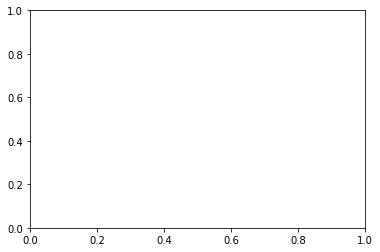

In [10]:

chi2 = {} 
fig, ax1 = plt.subplots()
for triple2 , liste_t in triples2.items():
    #mup2, T2, x02, Taille2 = triple2
    mup2, T2 = triple2
    triples11 = extract_triples(date, nom1, mup2, T2)
    #print ('la' , triples11 , ' la ' , mup2, T2, x02, Taille2)
    time_list = triples11[(mup2, T2)]
    #time_list = list(liste_t)
    #print("laaaa ", time_list)
    if len(time_list) != 0 : chi2[triple2] = plot_graph2_edge(date, nom1, triple2, time_list , DONNEES , 2)

print("chi2 :" ,chi2)
# Trouver la clé avec la valeur minimale
triple = min(chi2, key=chi2.get)
print("Clé avec la valeur minimale:", triple)

fig, ax1 = plt.subplots()
X , Y , label = DONNEES[1]
mask = X < 7*18
ax1.plot(X[mask], Y[mask], label=f"donnés du "+ date + ' : ' + label )
X , Y , label = DONNEES[2]
ax1.plot(X[mask], Y[mask], label=f"donnés du "+ date + ' : ' + label)
#mup, T, x0, Taille = triple
mup, T = triple
triples1 = extract_triples(date, nom1, mup, T, Taille)
triple1 = (mup, T)
liste_t =  triples1[triple1]
time_list = [max(liste_t)]
time_list = list(liste_t)
plot_graph3_edge(date, nom1, triple, time_list )
    
nom = "theta_edge_1.0_ih2"
triples = extract_triples(date, nom, mup, T, x0, Taille)
print("Triples possibles:", triples)
liste_t =  triples[triple]
liste_t = np.array(liste_t)
mask = (liste_t > 0)*(liste_t < 2) 
print (liste_t[mask])
plot_graph3_edge(date, nom, triple, liste_t[mask] )
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.xlim([-100 , 100])
plt.grid(True)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)

plt.show()

nom = "theta_edge_1.0_ih1"
triples = extract_triples(date, nom, mup, T, Taille)
fig, ax1 = plt.subplots()
X , Y , label = DONNEES[1]
mask = X < 7*18
ax1.plot(X[mask]/18, Y[mask], label=f"donnés du "+ date + ' : ' + label )
X , Y , label = DONNEES[2]
#ax1.plot(X[mask]/18, Y[mask], label=f"donnés du "+ date + ' : ' + label)
for triple , liste_t in triples2.items():
    mup2, T2, x02, Taille2 = triple2
    triples11 = extract_triples(date, nom1, mup2, T2, Taille2)
    #print ('la' , triples11)
    time_list = triples11[(mup2, T2)]
    #time_list = list(liste_t)
    #print("laaaa aa ", time_list)
    plot_graph3_edge(date, nom1, triple, time_list )
    
nom = "theta_edge_1.0_ih2"
triples = extract_triples(date, nom, mup, T, Taille)
print("Triples possibles:", triples)
for triple , liste_t in triples.items():
    #time_list = [max(liste_t)]
    time_list = list(liste_t)
    liste_t = np.array(liste_t)
    mask = (liste_t > 0)*(liste_t < 2) 
    #print (liste_t[mask])
    plot_graph3_edge(date, nom, triple, liste_t[mask] )
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.grid(True)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)

plt.show()



In [112]:
# sumulation Deuxieme ajustement de x0 et Taille  

nom = "theta_edge_1.0_ih1"
triple = min(chi2, key=chi2.get)
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
mu, T, x0, Taille = triple
t = "veff_bord"
filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{t}.npz"
data_s = np.load(filename) 
X_simul , Y_simul = data_s[0, :] ,  data_s[1, :] #- x0
fig, ax1 = plt.subplots()
ax1.set(xlabel="$x \quad (\mu m/m s)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$")
ax1.plot(X_simul, Y_simul, label=f"simul : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t} $\\mu$s")

# donnees bors 18 ms 
X , Y , label = DONNEES[1]
mask = X < 7*18
ax1.plot(X[mask]/18, Y[mask], label=f"donnés du "+ date + ' : ' + label )

#donne expenssion 1ms 
X , Y , label = DONNEES[2]
mask = X < 7*18
ax1.plot(X[mask]/18, Y[mask], label=f"donnés du "+ date + ' : ' + label )
## je cherche le centre x00
x , y = X/18 , Y
def model(x , A , sigma , x0 , b ):  
    from scipy import special
    return A/2*(np.exp(-(x-x0)**2/sigma**2)) + b 

mask = (x > -100)*(x < 1400) 
eps = 1e-3
yerr = np.full (len(y[mask]) , eps ) 
ax1.plot(x[mask],y[mask] )

p0 = [ 60 , 1 , 0, 0 ]
from scipy.optimize import curve_fit

popt , pcov = curve_fit(model , x[mask] , y[mask] , sigma = yerr , p0 = np.array(p0), 
                            bounds = ([0, 0 , 0 , - 5  ],[100 , 1000 , 1000 , 5 ])
                           )

#popt = p0
print(popt)
A , sigma , x00 , b = popt 
#x00 = 30/18
print( "center :" , x00*18)
ax1.set_xlim(-20/18, 60/18)  # Limite de X de -20 à 60
ax1.set_ylim(-10, 40)
ax1.plot( x , model(x , *popt) , label = "fit")
ax1.axvline(x=x00, color='blue', linestyle='--', label=f'Vertical line at x={x00}')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)
plt.show()

## nombre atome apres expenssion à 30ms Nat_donnees1
Donnees=DONNEES[-1]         
X , Y , label = Donnees
mask = (X > -400)*(X < 400)
#mask = (X > -20)*(X < 60)
Nat_donnees1 = integrale(X[mask], Y[mask])
print ( 'Nat :' , Nat_donnees1 ) 

## determiner \ell  d 
from scipy.signal import savgol_filter
window_size = 3  # Taille de la fenêtre
poly_order = 2   # Degré du polynôme
y_smooth = savgol_filter(y, window_length=window_size, polyorder=poly_order)
f_interp = interp1d(x, np.where(y_smooth>0 , y_smooth , 0 ) , kind='linear')

def f(d):
    from scipy.signal import savgol_filter
    window_size = 1  # Taille de la fenêtre
    poly_order = 1   # Degré du polynôme
    X_simul , Y_simul
    y_smooth = Y_simul #savgol_filter(Y_simul, window_length=window_size, polyorder=poly_order)
    f_interp = interp1d(X_simul*18, y_smooth , kind='linear')
    flagu_plot = 0
    if flagu_plot :
        plt.plot(X_simul*18 , Y_simul)
        Donnees=DONNEES[-1]         
        X , Y , label = Donnees
        plt.plot(X , Y)
        plt.plot(X_simul*18 , f_interp(X_simul*18))
        plt.axvline(x=x00-d/2, color='blue', linestyle='--', linewidth=1.5, alpha=0.5)
        plt.axvline(x=x00+d/2, color='blue', linestyle='--', linewidth=1.5, alpha=0.5)
        plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
        plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
        
        plt.grid(True)
        plt.show()
    
    # Intégration sur un intervalle fini
    integral_value, _ = quad(f_interp, x00*18 - d/2, x00*18 + d/2)
    #print ("d : " , d , " , integral_value : ", integral_value, "integral_value - Nat_donnees1 :",integral_value - Nat_donnees1)
    
    return (integral_value - Nat_donnees1*(100-3.2931429180009575)/100)/ Nat_donnees1

def dichotomie(a, b, tol=1e-6, max_iter=100):
    # Vérifier que les signes de f(a) et f(b) sont opposés
    if f(a) * f(b) > 0:
        print("La méthode de dichotomie échoue, car les signes de f(a) et f(b) sont identiques.")
        return None
    
    # Initialisation
    iteration = 0
    while (b - a) / 2 > tol and iteration < max_iter:
        m = (a + b) / 2  # Milieu de l'intervalle
        if f(m) == 0:  # Si f(m) est suffisamment proche de zéro
            return m
        elif f(m) * f(a) < 0:  # La racine est dans [a, m]
            b = m
        else:  # La racine est dans [m, b]
            a = m
        iteration += 1
    
    # Retourner la valeur approximative de la racine
    return (a + b) / 2

# Exemple d'utilisation
a = 1
b = 60
racine = dichotomie(a, b , 1/Nat_donnees1 , 1000)
print(f"La racine estimée est : {racine}")


print ( x00 -racine/2/18 , x00+racine/2/18)
print ( x00*18)

ValueError: min() arg is an empty sequence

In [113]:
x = np.linspace(0, 620, 10)
plt.plot(x , (np.array([f(d) for d in x]))*100 , label = "pourssantage d'ecart avec le nombre apres expenssion")
plt.axvline(x=racine, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.legend()
plt.show()

NameError: name 'f' is not defined

## recupérer courbes finales

In [377]:
###
print ("date :" , date)

mu = None
T = 325.088#None
x0 = 0#None
Taille = None

nom = "theta_edge_1.0_ih2"
# Extraction des triples possibles
triples = extract_triples(date, nom, mu, T, x0, Taille)
print("Triples key possibles:", triples.keys())

# Accéder à la première clé du dictionnaire
first_key = list(triples.keys())[0]

# Décomposer la clé (qui est un tuple) en plusieurs variables
mu, T, x0, Taille = first_key

date : 2024-02-09
Triples key possibles: dict_keys([(56.106, 325.088, -0.0, 39.479)])


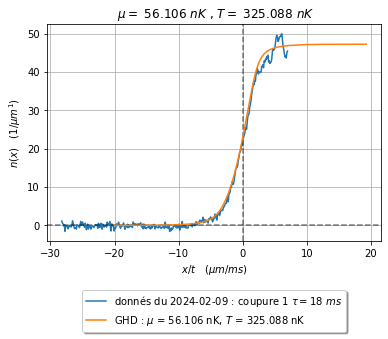

In [378]:
#Triples key possibles: #dict_keys([(64.529, 558.939, 18.339, 22.176), (64.529, 558.939, 18.339, 28.07), (64.529, 558.939, 18.339, 33.506)])
#mup, T, x0 , Taille = 64.529, 558.939,  18.339, 33.506
#triples = extract_triples(date, nom2, mup, T, x0 , Taille)

fig, ax1 = plt.subplots()
X , Y , label = DONNEES[1]
mask = X < 7*18
ax1.plot(X[mask]/18, Y[mask], label=f"donnés du "+ date_donnees + ' : ' + label )
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore

theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
ax1.set(xlabel="$x/t \quad (\mu m/m s)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ ")
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
t = "veff_bord"
nom = "theta_edge_1.0_ih1"
filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{t}.npz"
data_s = np.load(filename) 
#x0 = data_s[0,np.argmax(data_s[1, :])]
X_simul = data_s[0, :] #- x0
ax1.plot(X_simul, data_s[1, :], label=f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK")
plt.grid(True)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.show()

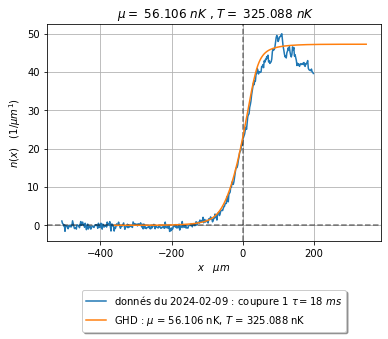

In [379]:
#Triples key possibles: #dict_keys([(64.529, 558.939, 18.339, 22.176), (64.529, 558.939, 18.339, 28.07), (64.529, 558.939, 18.339, 33.506)])
#mup, T, x0 , Taille = 64.529, 558.939,  18.339, 33.506
#triples = extract_triples(date, nom2, mup, T, x0 , Taille)

fig, ax1 = plt.subplots()
X , Y , label = DONNEES[1]
mask = X < 10*20
ax1.plot(X[mask], Y[mask], label=f"donnés du "+ date_donnees + ' : ' + label )
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore

theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
ax1.set(xlabel="$x \quad \mu m  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ ")
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
t = "veff_bord"
nom = "theta_edge_1.0_ih1"
filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{t}.npz"
data_s = np.load(filename) 
#x0 = data_s[0,np.argmax(data_s[1, :])]
X_simul = data_s[0, :] #- x0
ax1.plot(X_simul*18, data_s[1, :], label=f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK")
plt.grid(True)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.show()

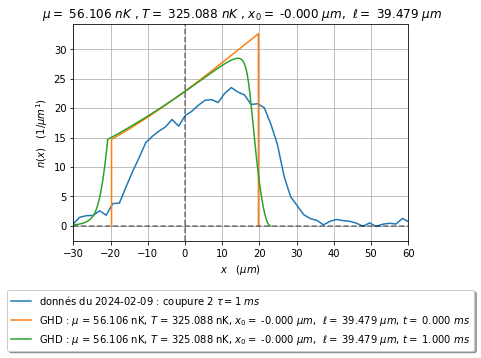

In [380]:
#mup, T, x0 , Taille = 64.529, 558.939,  18.339, 22.176#33.506
#triples = extract_triples(date, nom, mup, T, x0 ,  Taille)
fig, ax1 = plt.subplots()
X , Y , label = DONNEES[2]
mask = (X < 7*18)*(X>-5*18)
ax1.plot(X[mask], Y[mask], label=f"donnés du "+ date_donnees + ' : ' + label )
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore

theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
ax1.set(xlabel="$x \quad (\mu m)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")

nom = "theta_edge_1.0_ih2"
for t in [0 , 1 ]:
    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}_{t:.3f}.npz"
    data_s = np.load(filename) 
    #x0 = data_s[0,np.argmax(data_s[1, :])]title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x00:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
    X_simul = data_s[0, :] #- x0
    ax1.plot(X_simul*Taille, data_s[1, :], label=f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$, $t =$ {t:.3f} $m s$")
plt.xlim([-30 , 60 ])
plt.axvline(x=x0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.grid(True)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.show()

filename = 2024-02-09/rho_theta_edge_1.0_discr_ih2_56.106_325.088_-0.000.npz
filename = 2024-02-09/rho_theta_edge_1.0_discr_moy_ih2_56.106_325.088_-0.000_39.479.npz


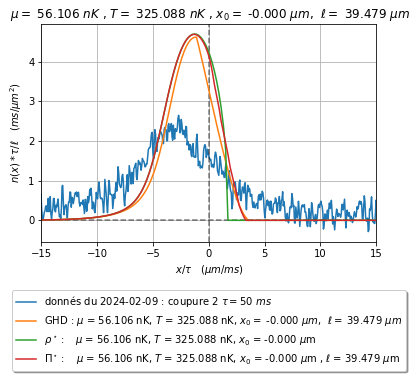

In [381]:

triples = extract_triples(date, nom, mup, T, Taille)
fig, ax1 = plt.subplots()
X , Y , label = DONNEES[-1]
mask = X < 20*30
ax1.plot(X[mask]/30, Y[mask]*30/Taille, label=f"donnés du "+ date_donnees + ' : ' + label )
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore

theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
ax1.set(xlabel="$x/\\tau \quad (\mu m/m s)  $", ylabel="$n(x)*\\tau/\\ell \quad ( ms/\mu m^2 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)

nom = "theta_edge_1.0_ih2"
for t in [50 ]:
    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}_{t:.3f}.npz"
    data_s = np.load(filename) 
    #x0 = data_s[0,np.argmax(data_s[1, :])]title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x00:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
    X_simul = data_s[0, :] #- x0
    ax1.plot(X_simul/t*Taille, data_s[1, :]*t/Taille, label=f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")

index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_star_discr = np.load(filename)
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_moy_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_discr_moy = np.load(filename)
theta0 = theta_discr[np.argmax(rho_theta_star_discr)]
theta0 =  0 
ax1.plot(theta_discr-theta0, rho_theta_star_discr, label=f"$\\rho^\\star : \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x0:.3f} $\\mu$m")
ax1.plot(theta_discr-theta0, rho_theta_discr_moy, label=f"$\\Pi^\\star : \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x0:.3f} $\\mu$m , $\\ell$ = {Taille:.3f} $\\mu$m")
ax1.set_xlim(-15, 15)     
plt.grid(True)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.savefig('graphique_transparent.png', transparent=True)
plt.savefig('graphique_high_res.png', dpi=300) 
plt.show()

filename = 2024-02-09/rho_theta_edge_1.0_discr_ih2_56.106_325.088_-0.000.npz
filename = 2024-02-09/rho_theta_edge_1.0_discr_moy_ih2_56.106_325.088_-0.000_39.479.npz


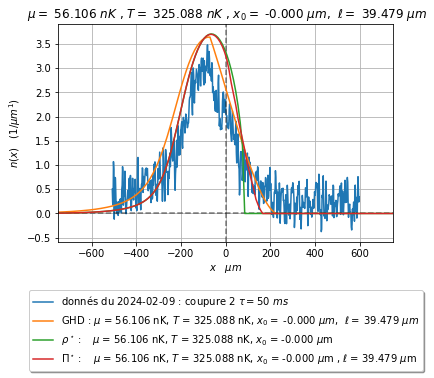

In [382]:

triples = extract_triples(date, nom, mup, T, Taille)
fig, ax1 = plt.subplots()
X , Y , label = DONNEES[-1]
mask = X < 20*30
ax1.plot(X[mask], Y[mask], label=f"donnés du "+ date_donnees + ' : ' + label )
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore

theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
ax1.set(xlabel="$x \quad \mu m  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)

nom = "theta_edge_1.0_ih2"
for t in [50 ]:
    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}_{t:.3f}.npz"
    data_s = np.load(filename) 
    #x0 = data_s[0,np.argmax(data_s[1, :])]title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x00:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
    X_simul = data_s[0, :] #- x0
    ax1.plot(X_simul*t, data_s[1, :], label=f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")

index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_star_discr = np.load(filename)
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_moy_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_discr_moy = np.load(filename)
theta0 = theta_discr[np.argmax(rho_theta_star_discr)]
theta0 =  0 
ax1.plot(theta_discr*t, rho_theta_star_discr/t*Taille, label=f"$\\rho^\\star : \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x0:.3f} $\\mu$m")
ax1.plot(theta_discr*t, rho_theta_discr_moy/t*Taille, label=f"$\\Pi^\\star : \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x0:.3f} $\\mu$m , $\\ell$ = {Taille:.3f} $\\mu$m")
ax1.set_xlim(-15*t, 15*t)     
plt.grid(True)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.savefig('graphique_transparent.png', transparent=True)
plt.savefig('graphique_high_res.png', dpi=300) 
plt.show()

In [848]:
print("date :" , date)

mu = None
T = 558.839#None#None
x0 = 18.339#None
Taille = None

Temps_exp = 30 

nom = "theta_edge_1.0_ih2"
# Extraction des triples possibles
triples = extract_triples(date, nom, mu, T, x0, Taille)
print("Triples key possibles:", triples.keys())

# Accéder à la première clé du dictionnaire
first_key = list(triples.keys())[0]

# Décomposer la clé (qui est un tuple) en plusieurs variables
mu, T, x0, Taille = first_key

date : 2024-04-24
Triples key possibles: dict_keys([(64.684, 558.839, 18.339, 22.169)])


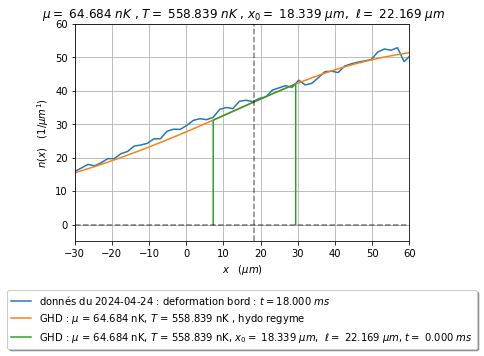

In [849]:
#Triples key possibles: #dict_keys([(64.529, 558.939, 18.339, 22.176), (64.529, 558.939, 18.339, 28.07), (64.529, 558.939, 18.339, 33.506)])
#mup, T, x0 , Taille = 64.529, 558.939,  18.339, 33.506
#triples = extract_triples(date, nom2, mup, T, x0 , Taille)

fig, ax1 = plt.subplots()
X , Y , label = DONNEES[1]
mask = X < 7*18
ax1.plot(X[mask], Y[mask], label=f"donnés du "+ date_donnees + ' : ' + label )

t = "veff_bord"
nom = "theta_edge_1.0_ih1"
filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{t}.npz"
data_s = np.load(filename) 
#x0 = data_s[0,np.argmax(data_s[1, :])]
X_simul = data_s[0, :] #- x0
ax1.plot(X_simul*18, data_s[1, :], label=f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK , hydo regyme")



ax1.set(xlabel="$x \quad (\mu m)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")

nom = "theta_edge_1.0_ih2"
for t in [0]:
    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}_{t:.3f}.npz"
    data_s = np.load(filename) 
    #x0 = data_s[0,np.argmax(data_s[1, :])]title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x00:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
    X_simul = data_s[0, :] #- x0
    ax1.plot(X_simul*Taille, data_s[1, :], label=f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$, $t =$ {t:.3f} $m s$")
plt.xlim([-30 , 60 ])
plt.ylim([-5 , 60 ])
plt.axvline(x=x0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.grid(True)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.show()

NameError: name 'DONNEES' is not defined

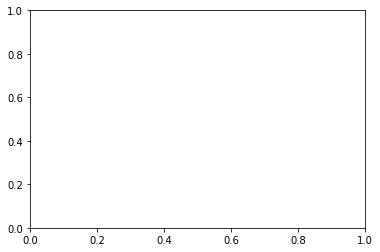

In [2]:
#Triples key possibles: #dict_keys([(64.529, 558.939, 18.339, 22.176), (64.529, 558.939, 18.339, 28.07), (64.529, 558.939, 18.339, 33.506)])
#mup, T, x0 , Taille = 64.529, 558.939,  18.339, 33.506
#triples = extract_triples(date, nom2, mup, T, x0 , Taille)

import scipy.optimize as op
import numpy as np
import matplotlib.pyplot as plt

fig, ax1 = plt.subplots()
X , Y , label = DONNEES[1]
mask = X < 7*18
ax1.plot(X[mask], Y[mask], label=f"donnés du "+ date_donnees + ' : ' + label , color = "#17becf" )

t = "veff_bord"
nom = "theta_edge_1.0_ih1"
filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{t}.npz"
data_s = np.load(filename) 
#x0 = data_s[0,np.argmax(data_s[1, :])]
X_simul = data_s[0, :] #- x0
ax1.plot(X_simul*18, data_s[1, :], color = '#ff7f0e', label=f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK , hydo regyme")

mu = None
T = 558.959#None#None
x0 =15.959##15.958#None
Taille = None

nom = "theta_edge_1.0_ih2"
# Extraction des triples possibles
triples = extract_triples(date, nom, mu, T, x0, Taille)
print("Triples key possibles:", triples.keys())

# Accéder à la première clé du dictionnaire
first_key = list(triples.keys())[0]

# Décomposer la clé (qui est un tuple) en plusieurs variables
mu, T, x0, Taille = first_key

t = "veff_bord"
nom = "theta_edge_1.0_ih1"
filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{t}.npz"
data_s = np.load(filename) 
#x0 = data_s[0,np.argmax(data_s[1, :])]
X_simul = data_s[0, :] #- x0
ax1.plot(X_simul*18, data_s[1, :], color = 'red' , label=f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK , hydo regyme")


X , Y , label = DONNEES[2]
mask = (X < 70*18)*(X>-50*18)
ax1.plot(X[mask], Y[mask], color='#1f77b4' ,label=f"donnés du "+ date_donnees + ' : ' + label )

ax1.set(xlabel="$x \quad (\mu m)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
colors = [
    #"#1f77b4",  # Bleu
    #"#ff7f0e",  # Orange
    #"#2ca02c",  # Vert
    #"#d62728",  # Rouge
    "#9467bd",  # Violet
    "#8c564b",  # Marron
    "#e377c2",  # Rose
    "#7f7f7f",  # Gris
    "#bcbd22",  # Jaune Olive
    "#17becf"   # Cyan
]
idc = 0 
nom = "theta_edge_1.0_ih2"
for t in [0,1]:
    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}_{t:.3f}.npz"
    data_s = np.load(filename) 
    #x0 = data_s[0,np.argmax(data_s[1, :])]title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x00:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
    X_simul = data_s[0, :] #- x0
    ax1.plot(X_simul*Taille, data_s[1, :], color = colors[idc], label=f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$, $t =$ {t:.3f} $m s$")
    idc += 1
plt.xlim([-140 , 140 ])
plt.ylim([-5 , 60 ])
plt.axvline(x=x0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.grid(True)
#plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.savefig('graphique_transparent.png', transparent=True)
plt.savefig('graphique_high_res.png', dpi=300) 
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_64.683_558.959_15.959_22.894_50.000.npz'

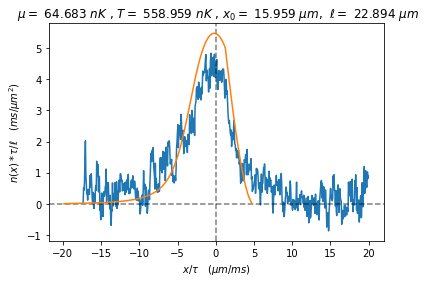

In [851]:

triples = extract_triples(date, nom, mup, T, Taille)
fig, ax1 = plt.subplots()
X , Y , label = DONNEES[-1]
mask = X < 20*30
ax1.plot(X[mask]/Temps_exp, Y[mask]*Temps_exp/Taille, label=f"donnés du "+ date_donnees + ' : ' + label )
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore

theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
ax1.set(xlabel="$x/\\tau \quad (\mu m/m s)  $", ylabel="$n(x)*\\tau/\\ell \quad ( ms/\mu m^2 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)

nom = "theta_edge_1.0_ih2"
for t in [30 , 50 ]:
    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}_{t:.3f}.npz"
    data_s = np.load(filename) 
    #x0 = data_s[0,np.argmax(data_s[1, :])]title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x00:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
    X_simul = data_s[0, :] #- x0
    ax1.plot(X_simul/t*Taille, data_s[1, :]*t/Taille, label=f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")

index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_star_discr = np.load(filename)
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_moy_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_discr_moy = np.load(filename)
theta0 = theta_discr[np.argmax(rho_theta_star_discr)]
theta0 =  0 
ax1.plot(theta_discr-theta0, rho_theta_star_discr, label=f"$\\rho^\\star : \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x0:.3f} $\\mu$m")
ax1.plot(theta_discr-theta0, rho_theta_discr_moy, label=f"$\\Pi^\\star : \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x0:.3f} $\\mu$m , $\\ell$ = {Taille:.3f} $\\mu$m")
ax1.set_xlim(-15, 15)     
plt.grid(True)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
plt.savefig('graphique_high_res.png', dpi=300)
plt.show()

filename = 2024-04-24/rho_theta_edge_1.0_discr_ih2_64.683_558.959_15.959.npz
filename = 2024-04-24/rho_theta_edge_1.0_discr_moy_ih2_64.683_558.959_15.959_22.894.npz


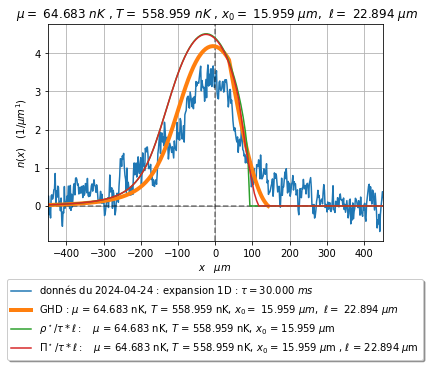

In [852]:
triples = extract_triples(date, nom, mup, T, Taille)
fig, ax1 = plt.subplots()
X , Y , label = DONNEES[-1]
mask = X < 20*30
ax1.plot(X[mask], Y[mask], label=f"donnés du "+ date_donnees + ' : ' + label )
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore

theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
ax1.set(xlabel="$x \quad \mu m  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)

nom = "theta_edge_1.0_ih2"
for t in [Temps_exp ]:
    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}_{t:.3f}.npz"
    data_s = np.load(filename) 
    #x0 = data_s[0,np.argmax(data_s[1, :])]title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x00:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
    X_simul = data_s[0, :] #- x0
    ax1.plot(X_simul*Taille, data_s[1, :], linewidth=4 , label=f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")

index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_star_discr = np.load(filename)
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_moy_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_discr_moy = np.load(filename)
theta0 = theta_discr[np.argmax(rho_theta_star_discr)]
theta0 =  0 
ax1.plot(theta_discr*t, rho_theta_star_discr/t*Taille, label=f"$\\rho^\\star/\\tau*\\ell : \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x0:.3f} $\\mu$m")
ax1.plot(theta_discr*t, rho_theta_discr_moy/t*Taille, label=f"$\\Pi^\\star/\\tau*\\ell : \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x0:.3f} $\\mu$m , $\\ell$ = {Taille:.3f} $\\mu$m")
ax1.set_xlim(-15*30, 15*30)     
plt.grid(True)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=True, ncol=1)
plt.savefig('graphique_high_res.png', dpi=300)
plt.show()

## Pour articles 

In [10]:
#print(date_donnees)
date_donnees = '2024-04-24'
#date_donnees = '2025-01-23'
print(date_donnees)
DONNEES = f_DONNEES(date_donnees) 
X , Y , label = DONNEES[3]
date = date_donnees

2024-04-24


In [14]:
#print("date :" , date)
date = '2025-01-23'

#parametre bord 

if date in ['2024-02-09' , '2024-02-09_1']  :
    mu_b = None
    T_b = 353#406.356#None
    x0 =None
    Taille = None
    Temps_deform = 18 
    
elif date in  ['2024-02-29','2024-02-29_1']  :
    mu_b = None
    T_b = "[930,940]"#981.816#981.813#None
    x0 = None
    Taille = None
    Temps_deform = 28 


elif date in  ['2024-04-24' , '2024-04-24_1', '2025-01-23'] :
    mu_b = None
    T_b = 559.421#558.942#None
    x0 = 18.339#None
    Taille = None

    Temps_deform = 18 

  

 

nom = "theta_edge_1.0_ih2"
# Extraction des triples possibles
triples_b = extract_triples(date, nom, mu_b, T_b, x0, Taille)
print("Triples key possibles:", triples_b.keys())

# Accéder à la première clé du dictionnaire
first_key_b = list(triples_b.keys())[-1]

# Décomposer la clé (qui est un tuple) en plusieurs variables
mu_b, T_b , x0_b , Taille_b = first_key_b

Triples key possibles: dict_keys([(64.676, 559.421, 18.339, 22.089)])


In [18]:
#Parametre expension

##

if date in ['2024-02-09' , '2024-02-09_1']  :
    mu = None
    T = 353#934.588#None#None
    x0 =0 #3.0##15.958#None
    Taille = None
    Temps_exp = 50



elif date in  ['2024-02-29','2024-02-29_1']  :
    mu = None
    T = 1350.008#None#None
    x0 =-3.18##15.958#None
    Taille = None
    Temps_exp = 50


elif date in  ['2024-04-24' , '2024-04-24_1', '2025-01-23'] :
    mu = None
    T = 559.421#1468.853#1630.575#None#None
    x0 = 18.339#17.853##15.958#None
    Taille = None
    Temps_exp = 30



# Extraction des triples possibles
triples = extract_triples(date, nom, mu, T, x0, Taille)
print("Triples key possibles:", triples.keys())

# Accéder à la première clé du dictionnaire
first_key = list(triples.keys())[0]

# Décomposer la clé (qui est un tuple) en plusieurs variables
mu, T, x0, Taille = first_key

Triples key possibles: dict_keys([(64.676, 559.421, 18.339, 22.089)])


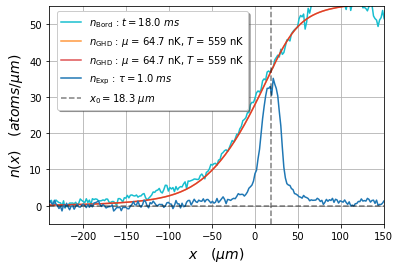

In [19]:
#Triples key possibles: #dict_keys([(64.529, 558.939, 18.339, 22.176), (64.529, 558.939, 18.339, 28.07), (64.529, 558.939, 18.339, 33.506)])
#mup, T, x0 , Taille = 64.529, 558.939,  18.339, 33.506
#triples = extract_triples(date, nom2, mup, T, x0 , Taille)


fig, ax1 = plt.subplots()

# Tracer bord fit 
X , Y , label = DONNEES[1]
mask = X < 718
#ax1.plot(X[mask], Y[mask], label=f"donnés du "+ date_donnees + ' : ' + label , color = "#17becf" )
ax1.plot(X[mask], Y[mask], label=label , color = "#17becf" )

t = "veff_bord"
nom = "theta_edge_1.0_ih1"
filename = f"{date}/density_expansion_nu_{nom}_{mu_b:.3f}_{T_b:.3f}_{t}.npz"
data_s = np.load(filename) 
ax1.plot(data_s[0, :] * Temps_deform, data_s[1, :], color='#ff7f0e', linewidth=1.5, alpha=0.8,
         label=f"$n_{{\mathrm{{GHD}}}}$ : $\\mu$ = {mu_b:.1f} nK, $T$ = {T_b:.0f} nK ")


# tracer expanssion 0 et 2 ms et bord
nom = "theta_edge_1.0_ih2"


t = "veff_bord"
nom = "theta_edge_1.0_ih1"
filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{t}.npz"
data_s = np.load(filename) 
#x0 = data_s[0,np.argmax(data_s[1, :])]
X_simul = data_s[0, :] #- x0
ax1.plot(X_simul*Temps_deform, data_s[1, :], color = "#d62728" , linewidth=1.5, alpha=0.8 , label=f"$n_{{\mathrm{{GHD}}}}$ : $\\mu$ = {mu:.1f} nK, $T$ = {T:.0f} nK")


X , Y , label = DONNEES[2]
mask = (X < 100*Temps_deform)*(X>-100*Temps_deform)
#ax1.plot(X[mask], Y[mask], color='#1f77b4' ,label=f"donnés du "+ date_donnees + ' : ' + label )
ax1.plot(X[mask], Y[mask], color='#1f77b4' ,label= label )

ax1.set(xlabel="$x \quad (\mu m)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
ax1.set(xlabel="$x \quad (\mu m)  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" " )
ax1.set_xlabel("$x \quad (\mu m)$", fontsize=14)
ax1.set_ylabel("$n(x) \quad (atoms/\mu m)$", fontsize=14)
ax1.set_title("", fontsize=16)

colors = [
    #"#1f77b4",  # Bleu
    #"#ff7f0e",  # Orange
    #"#2ca02c",  # Vert
    #"#d62728",  # Rouge
    "#9467bd",  # Violet
    "#8c564b",  # Marron
    "#e377c2",  # Rose
    "#7f7f7f",  # Gris
    "#bcbd22",  # Jaune Olive
    "#17becf"   # Cyan
]
idc = 0 
nom = "theta_edge_1.0_ih2"
for t in [0,1]:
    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}_{t:.3f}.npz"
    data_s = np.load(filename) 
    #x0 = data_s[0,np.argmax(data_s[1, :])]title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x00:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
    X_simul = data_s[0, :] #- x0
    #ax1.plot(X_simul*Taille, data_s[1, :], color = colors[idc], label=f"GHD : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$, $t =$ {t:.3f} $m s$")
    idc += 1
plt.xlim([-240 , 150 ])
plt.ylim([-5 , 55 ])
plt.axvline(x=x0, color='black', linestyle='--', linewidth=1.5, alpha=0.5 , label = f"$x_0 = {x0:.1f}~\mu m$")
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.grid(True)
plt.legend(loc='upper center', bbox_to_anchor=(0.31, 1), fancybox=True, shadow=True, ncol=1)
plt.savefig('graphique_transparent.png', transparent=True)
plt.savefig('graphique_high_res.png', dpi=300 , bbox_inches='tight') 
plt.show()

$n_{\mathrm{GHD}}$ : $\mu$ = $64.7 \, \mathrm{nK}$
             $T$ = $559 \, \mathrm{nK}$
           $x_0$ = $18.3 \, \mu \mathrm{m}$
          $\ell$ = $22.1 \, \mu \mathrm{m}$
$n_{\mathrm{GHD}}$ : $\mu$ = $64.7 \, \mathrm{nK}$
             $T$ = $559 \, \mathrm{nK}$
           $x_0$ = $18.3 \, \mu \mathrm{m}$
          $\ell$ = $22.1 \, \mu \mathrm{m}$
filename = 2025-01-23/rho_theta_edge_1.0_discr_ih2_64.676_559.421_18.339.npz
filename = 2025-01-23/rho_theta_edge_1.0_discr_moy_ih2_64.676_559.421_18.339_22.089.npz


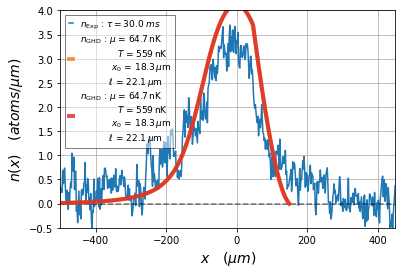

In [20]:
fig, ax1 = plt.subplots()
X , Y , label = DONNEES[-1]
mask = X < 20*Temps_exp
#ax1.plot(X[mask], Y[mask], color = "#1f77b4" , label=f"donnés du "+ date_donnees + ' : ' + label )
ax1.plot(X[mask], Y[mask], color = "#1f77b4" , label=label )
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore

theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
ax1.set(xlabel="$x \quad \mu m  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
ax1.set(xlabel="$x \quad \mu m  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" ")
ax1.set_xlabel("$x \quad (\mu m)$", fontsize=14)
ax1.set_ylabel("$n(x) \quad (atoms/\mu m)$", fontsize=14)
ax1.set_title("", fontsize=16)

#plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)

nom = "theta_edge_1.0_ih2"
for t in [Temps_exp ]:

    filename = f"{date}/density_expansion_nu_{nom}_{mu_b:.3f}_{T_b:.3f}_{x0_b:.3f}_{Taille_b:.3f}_{t:.3f}.npz"
    data_s = np.load(filename) 
    #ligne_1 = f"$n_{{\mathrm{{GHD}}}}$: $\mu = {mu_b:.1f} \, \mathrm{{nK}}$,"
    #label = f"$n_{{\mathrm{{GHD}}}}$: $\mu = {mu_b:.1f} \, \mathrm{{nK}}$,\n ~~  {$T = {T_b:.0f} \, \mathrm{{nK}}$,:>15} \n ~~  $x_0 = {x0_b:>10.1f} \, \mu \mathrm{{m}}$, \n ~~ $\ell = {Taille_b:>10.1f} \, \mu \mathrm{{m}}$"
    #label = f"$n_{{\mathrm{{GHD}}}}$: $\begin{array}{l} jjjj \end{array}$ $\mu = {mu_b:.1f} \, \mathrm{{nK}}$,\n ~~  $T = {T_b:.0f} \, \mathrm{{nK}}$, \n ~~  $x_0 = {x0_b:.1f} \, \mu \mathrm{{m}}$, \n ~~ $\ell = {Taille_b:.1f} \, \mu \mathrm{{m}}$"
    # Dictionnaire avec les informations à afficher
    data = {
        r"$n_{\mathrm{GHD}}$ : $\mu$": f"${mu_b:.1f} \, \mathrm{{nK}}$",
        r"$T$": f"${T_b:.0f} \, \mathrm{{nK}}$",
        r"$x_0$": f"${x0_b:.1f} \, \mu \mathrm{{m}}$",
        r"$\ell$": f"${Taille_b:.1f} \, \mu \mathrm{{m}}$"
    }
    
    # Construction de chaque ligne avec une boucle
    lines = []
    # Définir la largeur de la clé et de la valeur
    key_width = 15 #max(len(key) for key in data.keys())  # Largeur maximale pour les clés
    value_width = 15#max(len(value) for value in data.values())  # Largeur maximale pour les valeurs
    
    for key, value in data.items():
        # On aligne les clés à gauche et les valeurs à droite avec un espace autour du signe égal
        line = f"{key:>{key_width}} = {value:<{value_width}}"
        lines.append(line)
    
    # Joindre les lignes avec des sauts de ligne
    label = "\n ".join(lines)
    
    print(label)


    ax1.plot(data_s[0, :] * Taille, 
         data_s[1, :], 
         linewidth=4, 
         color='#ff7f0e', 
         alpha=0.8, 
         label=label
            )

    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}_{t:.3f}.npz"
    data_s = np.load(filename) 

    # Dictionnaire avec les informations à afficher
    label=f"$n_{{\mathrm{{GHD}}}}$: $\\mu = {mu:.1f} \, \mathrm{{nK}}$, $T = {T:.0f} \, \mathrm{{nK}}$, $x_0 = {x0:.1f} \, \mu \mathrm{{m}}$, $\\ell = {Taille:.1f} \, \mu \mathrm{{m}}$"
    
    data = {
        r"$n_{\mathrm{GHD}}$ : $\mu$": f"${mu:.1f} \, \mathrm{{nK}}$",
        r"$T$": f"${T:.0f} \, \mathrm{{nK}}$",
        r"$x_0$": f"${x0:.1f} \, \mu \mathrm{{m}}$",
        r"$\ell$": f"${Taille:.1f} \, \mu \mathrm{{m}}$"
    }
    
    # Construction de chaque ligne avec une boucle
    lines = []
    # Définir la largeur de la clé et de la valeur
    key_width = 15 #max(len(key) for key in data.keys())  # Largeur maximale pour les clés
    value_width = 15#max(len(value) for value in data.values())  # Largeur maximale pour les valeurs
    
    for key, value in data.items():
        # On aligne les clés à gauche et les valeurs à droite avec un espace autour du signe égal
        line = f"{key:>{key_width}} = {value:<{value_width}}"
        lines.append(line)
    
    # Joindre les lignes avec des sauts de ligne
    label = "\n ".join(lines)
    
    print(label)

        
    ax1.plot(
        data_s[0, :] * Taille,  # X : données des abscisses, multipliées par Taille
        data_s[1, :],  # Y : données des ordonnées
        linewidth=4,  # Épaisseur de la ligne
        color="#d62728",  # Couleur de la ligne (code hexadécimal)
        alpha=0.8,  # Transparence de la ligne (0 = transparent, 1 = opaque)
        label=label
        )

    
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_star_discr = np.load(filename)
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_moy_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_discr_moy = np.load(filename)
theta0 = theta_discr[np.argmax(rho_theta_star_discr)]
theta0 =  0 
#ax1.plot(theta_discr*t, rho_theta_star_discr/t*Taille, label=f"$\\rho^\\star/\\tau*\\ell : \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x0:.3f} $\\mu$m")
#ax1.plot(theta_discr*t, rho_theta_discr_moy/t*Taille, label=f"$\\Pi^\\star/\\tau*\\ell : \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x0:.3f} $\\mu$m , $\\ell$ = {Taille:.3f} $\\mu$m")
ax1.set_xlim(-10*Temps_exp, 10*Temps_exp)  
plt.ylim([-0.5 , 4.0 ])
plt.xlim([-500, 450 ])

plt.grid(True)
# Personnalisation de la légende
ax1.legend(
    loc='upper left',             # Position de la légende
    #bbox_to_anchor=(0.3, 1),    # Ajuste la position avec un ancrage spécifique
    #loc='best', 
    bbox_to_anchor=(0, 1),
    fancybox=False,                  # Ajouter une bordure arrondie
    shadow=False,                    # Ajouter une ombre
    ncol=1,                         # Nombre de colonnes pour les entrées de la légende
    fontsize=9,                    # Taille de la police
    framealpha=0.5,                 # Transparence du fond de la légende (0: transparent, 1: opaque)
    facecolor='w',                  # Couleur de fond de la légende
    edgecolor='black',              # Couleur du bord de la légende
    #title='Légende de l\'expérience', # Titre de la légende
    title_fontsize='large',         # Taille de la police du titre
    labelspacing=0.1,               # Espacement entre les labels de la légende
    handlelength=0.5,               # Longueur des poignées des items de la légende
    handleheight=1.5,               # Hauteur des poignées des items de la légende
    columnspacing=0,               # Espacement entre les colonnes
    alignment = 'right',
)
plt.savefig('graphique_high_res.png', dpi=300 , bbox_inches='tight')
plt.show()

$n_{\mathrm{GHD}}$ : $\mu$ = $64.7 \, \mathrm{nK}$
             $T$ = $559 \, \mathrm{nK}$
           $x_0$ = $18.3 \, \mu \mathrm{m}$
          $\ell$ = $22.1 \, \mu \mathrm{m}$
filename = 2025-01-23/rho_theta_edge_1.0_discr_ih2_64.676_559.421_18.339.npz
filename = 2025-01-23/rho_theta_edge_1.0_discr_moy_ih2_64.676_559.421_18.339_22.089.npz
$\Pi_{ \{x_0 , \ell\} } /\tau$ : $\mu$ = $64.7 \, \mathrm{nK}$
             $T$ = $559 \, \mathrm{nK}$
           $x_0$ = $18.3 \, \mu \mathrm{m}$
          $\ell$ = $22.1 \, \mu \mathrm{m}$
$\rho ( x_0 , \cdot ) /\tau*\ell$ = $64.7 \, \mathrm{nK}$
             $T$ = $559 \, \mathrm{nK}$
           $x_0$ = $18.3 \, \mu \mathrm{m}$
          $\ell$ = $22.1 \, \mu \mathrm{m}$


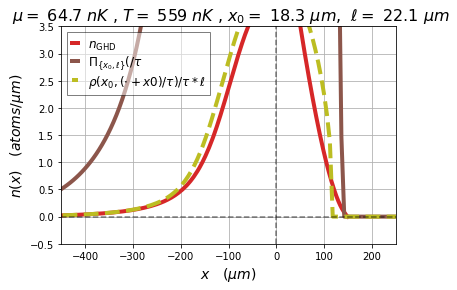

In [21]:

fig, ax1 = plt.subplots()
X , Y , label = DONNEES[-1]
mask = X < 20*Temps_exp
#ax1.plot(X[mask], Y[mask], label=f"donnés du "+ date_donnees + ' : ' + label )
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore

theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
ax1.set(xlabel="$x \quad \mu m  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu_b:.3f} $nK$ , $T =$ {T_b:.3f} $nK$ , $x_0 =$ {x0_b:.3f} $\mu m$,  $\\ell =$ {Taille_b:.3f} $\mu m$")
ax1.set_xlabel("$x \quad (\mu m)$", fontsize=14)
ax1.set_ylabel("$n(x) \quad (atoms/\mu m)$", fontsize=14)
ax1.set_title(f" $\\mu = $ {mu_b:.1f} $nK$ , $T =$ {T_b:.0f} $nK$ , $x_0 =$ {x0_b:.1f} $\mu m$,  $\\ell =$ {Taille_b:.1f} $\mu m$", fontsize=16)

nom = "theta_edge_1.0_ih2"
for t in [Temps_exp ]:
    
    filename = f"{date}/density_expansion_nu_{nom}_{mu_b:.3f}_{T_b:.3f}_{x0_b:.3f}_{Taille_b:.3f}_{t:.3f}.npz"
    data_s = np.load(filename) 
    label = f"$n_{{GHD}}$ : $\\mu$ = {mu_b:.3f} nK, $T$ = {T_b:.3f} nK, $x_0$ = {x0_b:.3f} $\\mu m$, $\\ell$ = {Taille_b:.3f} $\\mu m$"
    label = label.replace("\t", " ")  # Remplacer les tabulations par des espaces

    # Dictionnaire avec les informations à afficher
    data = {
        r"$n_{\mathrm{GHD}}$ : $\mu$": f"${mu_b:.1f} \, \mathrm{{nK}}$",
        r"$T$": f"${T_b:.0f} \, \mathrm{{nK}}$",
        r"$x_0$": f"${x0_b:.1f} \, \mu \mathrm{{m}}$",
        r"$\ell$": f"${Taille_b:.1f} \, \mu \mathrm{{m}}$"
    }
    
    # Construction de chaque ligne avec une boucle
    lines = []
    # Définir la largeur de la clé et de la valeur
    key_width = 15 #max(len(key) for key in data.keys())  # Largeur maximale pour les clés
    value_width = 15#max(len(value) for value in data.values())  # Largeur maximale pour les valeurs
    
    for key, value in data.items():
        # On aligne les clés à gauche et les valeurs à droite avec un espace autour du signe égal
        line = f"{key:>{key_width}} = {value:<{value_width}}"
        lines.append(line)
    
    # Joindre les lignes avec des sauts de ligne
    label = "\n ".join(lines)
    
    print(label)
    label = r"$n_{\mathrm{GHD}}$"
    ax1.plot(data_s[0, :]*Taille_b, data_s[1, :], linewidth=4, color="#d62728", 
         label=label)

index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu_b:.3f}_{T_b:.3f}_{x0_b:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_star_discr = np.load(filename)
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_moy_{nom[index_last_underscore+1:]}_{mu_b:.3f}_{T_b:.3f}_{x0_b:.3f}_{Taille_b:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_discr_moy = np.load(filename)
theta0 = theta_discr[np.argmax(rho_theta_star_discr)]
theta0 =  x0/t 

#######################################
label = f"$\\Pi_{{ \\{{x_0 , \\ell\\}} }} /\\tau : \\quad \\mu$ = {mu_b:.3f} nK, $T$ = {T_b:.3f} nK, $x_0$ = {x0_b:.3f} $\\mu$m , $\\ell$ = {Taille_b:.3f} $\\mu$"
# Dictionnaire avec les informations à afficher
data = {
    r"$\Pi_{ \{x_0 , \ell\} } /\tau$ : $\mu$": f"${mu_b:.1f} \, \mathrm{{nK}}$",
    r"$T$": f"${T_b:.0f} \, \mathrm{{nK}}$",
    r"$x_0$": f"${x0_b:.1f} \, \mu \mathrm{{m}}$",
    r"$\ell$": f"${Taille_b:.1f} \, \mu \mathrm{{m}}$"
}

# Construction de chaque ligne avec une boucle
lines = []
# Définir la largeur de la clé et de la valeur
key_width = 15 #max(len(key) for key in data.keys())  # Largeur maximale pour les clés
value_width = 15#max(len(value) for value in data.values())  # Largeur maximale pour les valeurs

for key, value in data.items():
    # On aligne les clés à gauche et les valeurs à droite avec un espace autour du signe égal
    line = f"{key:>{key_width}} = {value:<{value_width}}"
    lines.append(line)

# Joindre les lignes avec des sauts de ligne
label = "\n ".join(lines)

print(label)
#######################################
label = r"$\Pi_{ \{x_0 , \ell\} }( /\tau$"    
ax1.plot((theta_discr+theta0)*t, rho_theta_discr_moy/t*Taille, linewidth=4, color="#8c564b", 
         label=label)

#######################################
# Dictionnaire avec les informations à afficher
data = {
    r"$\rho ( x_0 , \cdot ) /\tau*\ell$": f"${mu_b:.1f} \, \mathrm{{nK}}$",
    r"$T$": f"${T_b:.0f} \, \mathrm{{nK}}$",
    r"$x_0$": f"${x0_b:.1f} \, \mu \mathrm{{m}}$",
    r"$\ell$": f"${Taille_b:.1f} \, \mu \mathrm{{m}}$"
}

# Construction de chaque ligne avec une boucle
lines = []
# Définir la largeur de la clé et de la valeur
key_width = 15 #max(len(key) for key in data.keys())  # Largeur maximale pour les clés
value_width = 15#max(len(value) for value in data.values())  # Largeur maximale pour les valeurs

for key, value in data.items():
    # On aligne les clés à gauche et les valeurs à droite avec un espace autour du signe égal
    line = f"{key:>{key_width}} = {value:<{value_width}}"
    lines.append(line)

# Joindre les lignes avec des sauts de ligne
label = "\n ".join(lines)

print(label)

#######################################
label = r"$\rho ( x_0 , (\cdot+x0)/\tau ) /\tau*\ell$"    
ax1.plot((theta_discr+theta0)*t, 
         rho_theta_star_discr/t*Taille , 
         linewidth=4 , 
         linestyle='--', 
         color = "#bcbd22", 
         label=label)
plt.ylim([-0.5 , 3.5 ])
plt.xlim([-450, 250 ])    
plt.grid(True)
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
# Personnalisation de la légende
ax1.legend(
    loc='upper left',             # Position de la légende
    #bbox_to_anchor=(0.3, 1),    # Ajuste la position avec un ancrage spécifique
    #loc='best', 
    bbox_to_anchor=(0, 1),
    fancybox=False,                  # Ajouter une bordure arrondie
    shadow=False,                    # Ajouter une ombre
    ncol=1,                         # Nombre de colonnes pour les entrées de la légende
    fontsize=12,                    # Taille de la police
    framealpha=0.5,                 # Transparence du fond de la légende (0: transparent, 1: opaque)
    facecolor='w',                  # Couleur de fond de la légende
    edgecolor='black',              # Couleur du bord de la légende
    #title='Légende de l\'expérience', # Titre de la légende
    title_fontsize='large',         # Taille de la police du titre
    labelspacing=0.1,               # Espacement entre les labels de la légende
    handlelength=0.5,               # Longueur des poignées des items de la légende
    handleheight=1.5,               # Hauteur des poignées des items de la légende
    columnspacing=0,               # Espacement entre les colonnes
    alignment = 'right',
)
plt.savefig('graphique_high_res.png', dpi=300 , bbox_inches='tight')
plt.show()

$n_{\mathrm{GHD}}$ : $\mu$ = $64.7 \, \mathrm{nK}$
             $T$ = $559 \, \mathrm{nK}$
           $x_0$ = $18.3 \, \mu \mathrm{m}$
          $\ell$ = $22.1 \, \mu \mathrm{m}$
filename = 2025-01-23/rho_theta_edge_1.0_discr_ih2_64.676_559.421_18.339.npz
filename = 2025-01-23/rho_theta_edge_1.0_discr_moy_ih2_64.676_559.421_18.339_22.089.npz
$\Pi_{ \{x_0 , \ell\} } /\tau$ : $\mu$ = $64.7 \, \mathrm{nK}$
             $T$ = $559 \, \mathrm{nK}$
           $x_0$ = $18.3 \, \mu \mathrm{m}$
          $\ell$ = $22.1 \, \mu \mathrm{m}$
$\rho ( x_0 , (\cdot+x_0)/\tau ) /\tau*\ell$ = $64.7 \, \mathrm{nK}$
             $T$ = $559 \, \mathrm{nK}$
           $x_0$ = $18.3 \, \mu \mathrm{m}$
          $\ell$ = $22.1 \, \mu \mathrm{m}$


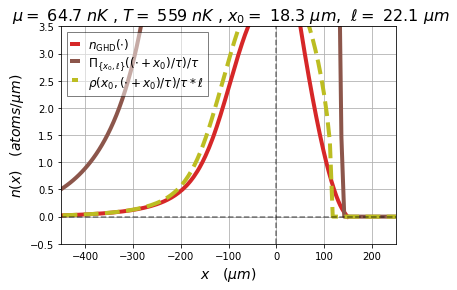

In [22]:

fig, ax1 = plt.subplots()
X , Y , label = DONNEES[-1]
mask = X < 20*Temps_exp
#ax1.plot(X[mask], Y[mask], label=f"donnés du "+ date_donnees + ' : ' + label )
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore

theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
ax1.set(xlabel="$x \quad \mu m  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x0:.3f} $\mu m$,  $\\ell =$ {Taille:.3f} $\mu m$")
ax1.set_xlabel("$x \quad (\mu m)$", fontsize=14)
ax1.set_ylabel("$n(x) \quad (atoms/\mu m)$", fontsize=14)
ax1.set_title(f" $\\mu = $ {mu:.1f} $nK$ , $T =$ {T:.0f} $nK$ , $x_0 =$ {x0:.1f} $\mu m$,  $\\ell =$ {Taille:.1f} $\mu m$", fontsize=16)

nom = "theta_edge_1.0_ih2"
for t in [Temps_exp ]:
    
    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}_{t:.3f}.npz"
    data_s = np.load(filename) 
    label = f"$n_{{GHD}}$ : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x0:.3f} $\\mu m$, $\\ell$ = {Taille:.3f} $\\mu m$"
    label = label.replace("\t", " ")  # Remplacer les tabulations par des espaces

    # Dictionnaire avec les informations à afficher
    data = {
        r"$n_{\mathrm{GHD}}$ : $\mu$": f"${mu:.1f} \, \mathrm{{nK}}$",
        r"$T$": f"${T:.0f} \, \mathrm{{nK}}$",
        r"$x_0$": f"${x0:.1f} \, \mu \mathrm{{m}}$",
        r"$\ell$": f"${Taille:.1f} \, \mu \mathrm{{m}}$"
    }
    
    # Construction de chaque ligne avec une boucle
    lines = []
    # Définir la largeur de la clé et de la valeur
    key_width = 15 #max(len(key) for key in data.keys())  # Largeur maximale pour les clés
    value_width = 15#max(len(value) for value in data.values())  # Largeur maximale pour les valeurs
    
    for key, value in data.items():
        # On aligne les clés à gauche et les valeurs à droite avec un espace autour du signe égal
        line = f"{key:>{key_width}} = {value:<{value_width}}"
        lines.append(line)
    
    # Joindre les lignes avec des sauts de ligne
    label = "\n ".join(lines)
    
    print(label)
    label = r"$n_{\mathrm{GHD}}(\cdot)$"
    ax1.plot(data_s[0, :]*Taille, data_s[1, :], linewidth=4, color="#d62728", 
         label=label)

index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_star_discr = np.load(filename)
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_moy_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}_{x0:.3f}_{Taille:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_discr_moy = np.load(filename)
theta0 = theta_discr[np.argmax(rho_theta_star_discr)]
theta0 =  x0/t 

#######################################
label = f"$\\Pi_{{ \\{{x_0 , \\ell\\}} }} /\\tau : \\quad \\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $x_0$ = {x0:.3f} $\\mu$m , $\\ell$ = {Taille:.3f} $\\mu$"
# Dictionnaire avec les informations à afficher
data = {
    r"$\Pi_{ \{x_0 , \ell\} } /\tau$ : $\mu$": f"${mu:.1f} \, \mathrm{{nK}}$",
    r"$T$": f"${T:.0f} \, \mathrm{{nK}}$",
    r"$x_0$": f"${x0:.1f} \, \mu \mathrm{{m}}$",
    r"$\ell$": f"${Taille:.1f} \, \mu \mathrm{{m}}$"
}

# Construction de chaque ligne avec une boucle
lines = []
# Définir la largeur de la clé et de la valeur
key_width = 15 #max(len(key) for key in data.keys())  # Largeur maximale pour les clés
value_width = 15#max(len(value) for value in data.values())  # Largeur maximale pour les valeurs

for key, value in data.items():
    # On aligne les clés à gauche et les valeurs à droite avec un espace autour du signe égal
    line = f"{key:>{key_width}} = {value:<{value_width}}"
    lines.append(line)

# Joindre les lignes avec des sauts de ligne
label = "\n ".join(lines)

print(label)
#######################################
label = r"$\Pi_{ \{x_0 , \ell\} }((\cdot+x_0)/\tau ) /\tau$"    
ax1.plot((theta_discr+theta0)*t, rho_theta_discr_moy/t*Taille, linewidth=4, color="#8c564b", 
         label=label)

#######################################
# Dictionnaire avec les informations à afficher
data = {
    r"$\rho ( x_0 , (\cdot+x_0)/\tau ) /\tau*\ell$": f"${mu:.1f} \, \mathrm{{nK}}$",
    r"$T$": f"${T:.0f} \, \mathrm{{nK}}$",
    r"$x_0$": f"${x0:.1f} \, \mu \mathrm{{m}}$",
    r"$\ell$": f"${Taille:.1f} \, \mu \mathrm{{m}}$"
}

# Construction de chaque ligne avec une boucle
lines = []
# Définir la largeur de la clé et de la valeur
key_width = 15 #max(len(key) for key in data.keys())  # Largeur maximale pour les clés
value_width = 15#max(len(value) for value in data.values())  # Largeur maximale pour les valeurs

for key, value in data.items():
    # On aligne les clés à gauche et les valeurs à droite avec un espace autour du signe égal
    line = f"{key:>{key_width}} = {value:<{value_width}}"
    lines.append(line)

# Joindre les lignes avec des sauts de ligne
label = "\n ".join(lines)

print(label)

#######################################
label = r"$\rho ( x_0 , (\cdot+x_0)/\tau ) /\tau*\ell$"    
ax1.plot((theta_discr+theta0)*t, 
         rho_theta_star_discr/t*Taille , 
         linewidth=4 , 
         linestyle='--', 
         color = "#bcbd22", 
         label=label)
plt.ylim([-0.5 , 3.5 ])
plt.xlim([-450, 250 ])    
plt.grid(True)
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
# Personnalisation de la légende
ax1.legend(
    loc='upper left',             # Position de la légende
    #bbox_to_anchor=(0.3, 1),    # Ajuste la position avec un ancrage spécifique
    #loc='best', 
    bbox_to_anchor=(0, 1),
    fancybox=False,                  # Ajouter une bordure arrondie
    shadow=False,                    # Ajouter une ombre
    ncol=1,                         # Nombre de colonnes pour les entrées de la légende
    fontsize=12,                    # Taille de la police
    framealpha=0.5,                 # Transparence du fond de la légende (0: transparent, 1: opaque)
    facecolor='w',                  # Couleur de fond de la légende
    edgecolor='black',              # Couleur du bord de la légende
    #title='Légende de l\'expérience', # Titre de la légende
    title_fontsize='large',         # Taille de la police du titre
    labelspacing=0.1,               # Espacement entre les labels de la légende
    handlelength=0.5,               # Longueur des poignées des items de la légende
    handleheight=1.5,               # Hauteur des poignées des items de la légende
    columnspacing=0,               # Espacement entre les colonnes
    alignment = 'right',
)
plt.savefig('graphique_high_res.png', dpi=300 , bbox_inches='tight')
plt.show()

In [24]:
theta_discr_exp = [-20.         -19.77398602 -19.54797204 -19.32195806 -19.09594407
 -18.86993009 -18.64391611 -18.41790213 -18.19188815 -17.96587417
 -17.73986019 -17.51384621 -17.28783222 -17.06181824 -16.83580426
 -16.60979028 -16.3837763  -16.15776232 -15.93174834 -15.70573435
 -15.47972037 -15.25370639 -15.02769241 -14.80167843 -14.57566445
 -14.34965047 -14.12363648 -13.8976225  -13.67160852 -13.44559454
 -13.21958056 -12.99356658 -12.7675526  -12.54153862 -12.31552463
 -12.08951065 -11.86349667 -11.63748269 -11.41146871 -11.18545473
 -10.95944075 -10.73342676 -10.50741278 -10.2813988  -10.05538482
  -9.82937084  -9.60335686  -9.37734288  -9.1513289   -8.92531491
  -8.69930093  -8.47328695  -8.24727297  -8.02125899  -7.79524501
  -7.56923103  -7.34321704  -7.11720306  -6.89118908  -6.6651751
  -6.43916112  -6.21314714  -5.98713316  -5.76111918  -5.53510519
  -5.30909121  -5.08307723  -4.85706325  -4.63104927  -4.40503529
  -4.17902131  -3.95300732  -3.72699334  -3.50097936  -3.27496538
  -3.0489514   -2.82293742  -2.59692344  -2.37090945  -2.14489547
  -1.91888149  -1.69286751  -1.46685353  -1.24083955  -1.01482557
  -0.78881159  -0.5627976   -0.33678362  -0.11076964   0.11524434
   0.34125832   0.5672723    0.79328628   1.01930027   1.24531425
   1.47132823   1.69734221   1.92335619   2.14937017   2.37538415
   2.37538425   2.39167286   2.40796146   2.42425006   2.44053866
   2.45682727   2.47311587   2.48940447   2.50569307   2.52198168
   2.53827028   2.55455888   2.57084748   2.58713609   2.60342469
   2.61971329   2.63600189   2.6522905    2.6685791    2.6848677
   2.7011563    2.71744491   2.73373351   2.75002211   2.76631071
   2.78259932   2.79888792   2.81517652   2.83146512   2.84775373
   2.86404233   2.88033093   2.89661953   2.91290814   2.92919674
   2.94548534   2.96177394   2.97806255   2.99435115   3.01063975
   3.02692835   3.04321696   3.05950556   3.07579416   3.09208276
   3.10837137   3.12465997   3.14094857   3.15723717   3.17352578
   3.18981438   3.20610298   3.22239158   3.23868019   3.25496879
   3.27125739   3.28754599   3.3038346    3.3201232    3.3364118
   3.3527004    3.36898901   3.38527761   3.40156621   3.41785481
   3.43414342   3.45043202   3.46672062   3.48300923   3.49929783
   3.51558643   3.53187503   3.54816364   3.56445224   3.58074084
   3.59702944   3.61331805   3.62960665   3.64589525   3.66218385
   3.67847246   3.69476106   3.71104966   3.72733826   3.74362687
   3.75991547   3.77620407   3.79249267   3.80878128   3.82506988
   3.84135848   3.85764708   3.87393569   3.89022429   3.90651289
   3.92280149   3.9390901    3.9553787    3.9716673    3.9879559 ]

SyntaxError: invalid syntax. Perhaps you forgot a comma? (3771591889.py, line 1)

In [29]:
theta_discr_exp = np.array([
    -20.0, -19.77398602, -19.54797204, -19.32195806, -19.09594407,
    -18.86993009, -18.64391611, -18.41790213, -18.19188815, -17.96587417,
    -17.73986019, -17.51384621, -17.28783222, -17.06181824, -16.83580426,
    -16.60979028, -16.3837763, -16.15776232, -15.93174834, -15.70573435,
    -15.47972037, -15.25370639, -15.02769241, -14.80167843, -14.57566445,
    -14.34965047, -14.12363648, -13.8976225, -13.67160852, -13.44559454,
    -13.21958056, -12.99356658, -12.7675526, -12.54153862, -12.31552463,
    -12.08951065, -11.86349667, -11.63748269, -11.41146871, -11.18545473,
    -10.95944075, -10.73342676, -10.50741278, -10.2813988, -10.05538482,
    -9.82937084, -9.60335686, -9.37734288, -9.1513289, -8.92531491,
    -8.69930093, -8.47328695, -8.24727297, -8.02125899, -7.79524501,
    -7.56923103, -7.34321704, -7.11720306, -6.89118908, -6.6651751,
    -6.43916112, -6.21314714, -5.98713316, -5.76111918, -5.53510519,
    -5.30909121, -5.08307723, -4.85706325, -4.63104927, -4.40503529,
    -4.17902131, -3.95300732, -3.72699334, -3.50097936, -3.27496538,
    -3.0489514, -2.82293742, -2.59692344, -2.37090945, -2.14489547,
    -1.91888149, -1.69286751, -1.46685353, -1.24083955, -1.01482557,
    -0.78881159, -0.5627976, -0.33678362, -0.11076964, 0.11524434,
    0.34125832, 0.5672723, 0.79328628, 1.01930027, 1.24531425,
    1.47132823, 1.69734221, 1.92335619, 2.14937017, 2.37538415,
    2.37538425, 2.39167286, 2.40796146, 2.42425006, 2.44053866,
    2.45682727, 2.47311587, 2.48940447, 2.50569307, 2.52198168,
    2.53827028, 2.55455888, 2.57084748, 2.58713609, 2.60342469,
    2.61971329, 2.63600189, 2.6522905, 2.6685791, 2.6848677,
    2.7011563, 2.71744491, 2.73373351, 2.75002211, 2.76631071,
    2.78259932, 2.79888792, 2.81517652, 2.83146512, 2.84775373,
    2.86404233, 2.88033093, 2.89661953, 2.91290814, 2.92919674,
    2.94548534, 2.96177394, 2.97806255, 2.99435115, 3.01063975,
    3.02692835, 3.04321696, 3.05950556, 3.07579416, 3.09208276,
    3.10837137, 3.12465997, 3.14094857, 3.15723717, 3.17352578,
    3.18981438, 3.20610298, 3.22239158, 3.23868019, 3.25496879,
    3.27125739, 3.28754599, 3.3038346, 3.3201232, 3.3364118,
    3.3527004, 3.36898901, 3.38527761, 3.40156621, 3.41785481,
    3.43414342, 3.45043202, 3.46672062, 3.48300923, 3.49929783,
    3.51558643, 3.53187503, 3.54816364, 3.56445224, 3.58074084,
    3.59702944, 3.61331805, 3.62960665, 3.64589525, 3.66218385,
    3.67847246, 3.69476106, 3.71104966, 3.72733826, 3.74362687,
    3.75991547, 3.77620407, 3.79249267, 3.80878128, 3.82506988,
    3.84135848, 3.85764708, 3.87393569, 3.89022429, 3.90651289,
    3.92280149, 3.9390901, 3.9553787, 3.9716673, 3.9879559
])
print(theta_discr_exp)

[-20.         -19.77398602 -19.54797204 -19.32195806 -19.09594407
 -18.86993009 -18.64391611 -18.41790213 -18.19188815 -17.96587417
 -17.73986019 -17.51384621 -17.28783222 -17.06181824 -16.83580426
 -16.60979028 -16.3837763  -16.15776232 -15.93174834 -15.70573435
 -15.47972037 -15.25370639 -15.02769241 -14.80167843 -14.57566445
 -14.34965047 -14.12363648 -13.8976225  -13.67160852 -13.44559454
 -13.21958056 -12.99356658 -12.7675526  -12.54153862 -12.31552463
 -12.08951065 -11.86349667 -11.63748269 -11.41146871 -11.18545473
 -10.95944075 -10.73342676 -10.50741278 -10.2813988  -10.05538482
  -9.82937084  -9.60335686  -9.37734288  -9.1513289   -8.92531491
  -8.69930093  -8.47328695  -8.24727297  -8.02125899  -7.79524501
  -7.56923103  -7.34321704  -7.11720306  -6.89118908  -6.6651751
  -6.43916112  -6.21314714  -5.98713316  -5.76111918  -5.53510519
  -5.30909121  -5.08307723  -4.85706325  -4.63104927  -4.40503529
  -4.17902131  -3.95300732  -3.72699334  -3.50097936  -3.27496538
  -3.048951

$n_{\mathrm{GHD}}$ : $\mu$ = $64.7 \, \mathrm{nK}$
             $T$ = $559 \, \mathrm{nK}$
           $x_0$ = $18.3 \, \mu \mathrm{m}$
          $\ell$ = $22.1 \, \mu \mathrm{m}$
nombre atome GDH  840.7650190800799
filename = 2025-01-23/rho_theta_edge_1.0_discr_ih2_64.676_559.421_18.339.npz
filename = 2025-01-23/rho_theta_edge_1.0_discr_moy_ih2_64.676_559.421_18.339_22.089.npz
filename = 2025-01-23/Pi_theta_edge_1.0_ih2_64.676_559.421_18.339_22.089_0.000.npz
$\Pi_{ \{x_0 , \ell\} } /\tau$ : $\mu$ = $64.7 \, \mathrm{nK}$
             $T$ = $559 \, \mathrm{nK}$
           $x_0$ = $18.3 \, \mu \mathrm{m}$
          $\ell$ = $22.1 \, \mu \mathrm{m}$
t : 30
nombre atome Pi  21623.675521424688
$\rho ( x_0 , (\cdot+x_0)/\tau ) /\tau*\ell$ = $64.7 \, \mathrm{nK}$
             $T$ = $559 \, \mathrm{nK}$
           $x_0$ = $18.3 \, \mu \mathrm{m}$
          $\ell$ = $22.1 \, \mu \mathrm{m}$


/tmp/ipykernel_1422099/279579048.py:563: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  integral_value, _ = quad(f, np.min(x), np.max(x))


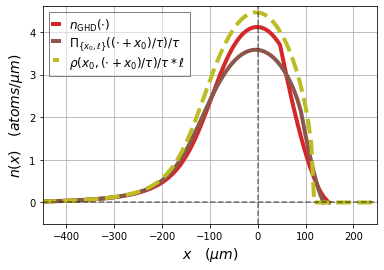

In [33]:

fig, ax1 = plt.subplots()
X , Y , label = DONNEES[-1]
mask = X < 20*Temps_exp
#ax1.plot(X[mask], Y[mask], label=f"donnés du "+ date_donnees + ' : ' + label )
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore

theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
#ax1.set(xlabel="$x \quad \mu m  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu_b:.3f} $nK$ , $T =$ {T_b:.3f} $nK$ , $x_0 =$ {x0_b:.3f} $\mu m$,  $\\ell =$ {Taille_b:.3f} $\mu m$")
ax1.set_xlabel("$x \quad (\mu m)$", fontsize=14)
ax1.set_ylabel("$n(x) \quad (atoms/\mu m)$", fontsize=14)
#ax1.set_title(f" $\\mu = $ {mu_b:.1f} $nK$ , $T =$ {T_b:.0f} $nK$ , $x_0 =$ {x0_b:.1f} $\mu m$,  $\\ell =$ {Taille_b:.1f} $\mu m$", fontsize=16)

nom = "theta_edge_1.0_ih2"
for t in [Temps_exp ]:
    
    filename = f"{date}/density_expansion_nu_{nom}_{mu_b:.3f}_{T_b:.3f}_{x0_b:.3f}_{Taille_b:.3f}_{t:.3f}.npz"
    data_s = np.load(filename) 
    label = f"$n_{{GHD}}$ : $\\mu$ = {mu_b:.3f} nK, $T$ = {T_b:.3f} nK, $x_0$ = {x0_b:.3f} $\\mu m$, $\\ell$ = {Taille_b:.3f} $\\mu m$"
    label = label.replace("\t", " ")  # Remplacer les tabulations par des espaces

    # Dictionnaire avec les informations à afficher
    data = {
        r"$n_{\mathrm{GHD}}$ : $\mu$": f"${mu_b:.1f} \, \mathrm{{nK}}$",
        r"$T$": f"${T_b:.0f} \, \mathrm{{nK}}$",
        r"$x_0$": f"${x0_b:.1f} \, \mu \mathrm{{m}}$",
        r"$\ell$": f"${Taille_b:.1f} \, \mu \mathrm{{m}}$"
    }
    
    # Construction de chaque ligne avec une boucle
    lines = []
    # Définir la largeur de la clé et de la valeur
    key_width = 15 #max(len(key) for key in data.keys())  # Largeur maximale pour les clés
    value_width = 15#max(len(value) for value in data.values())  # Largeur maximale pour les valeurs
    
    for key, value in data.items():
        # On aligne les clés à gauche et les valeurs à droite avec un espace autour du signe égal
        line = f"{key:>{key_width}} = {value:<{value_width}}"
        lines.append(line)
    
    # Joindre les lignes avec des sauts de ligne
    label = "\n ".join(lines)
    
    print(label)
    label = r"$n_{\mathrm{GHD}}(\cdot)$"
    ax1.plot(data_s[0, :]*Taille_b, data_s[1, :], linewidth=4, color="#d62728", 
         label=label)

    print("nombre atome GDH " , integrale(data_s[0, :]*Taille_b, data_s[1, :]))

index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu_b:.3f}_{T_b:.3f}_{x0_b:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_star_discr = np.load(filename)
filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_moy_{nom[index_last_underscore+1:]}_{mu_b:.3f}_{T_b:.3f}_{x0_b:.3f}_{Taille_b:.3f}.npz"
print ( 'filename =' ,filename )
rho_theta_discr_moy = np.load(filename)

filename = "2025-01-23/Pi_theta_edge_1.0_ih2_64.676_559.421_18.339_22.089_0.000.npz"#f"{date}/Pi_{nom}_{mu_b:.3f}_{T_b:.3f}_{x0_b:.3f}_{Taille_b:.3f}_{0:.3f}.npz"
print ( 'filename =' ,filename )
Pi = np.load(filename)*Taille

theta0 = theta_discr[np.argmax(rho_theta_star_discr)]
theta0 =  x0/t 

#######################################
label = f"$\\Pi_{{ \\{{x_0 , \\ell\\}} }} /\\tau : \\quad \\mu$ = {mu_b:.3f} nK, $T$ = {T_b:.3f} nK, $x_0$ = {x0_b:.3f} $\\mu$m , $\\ell$ = {Taille_b:.3f} $\\mu$"
# Dictionnaire avec les informations à afficher
data = {
    r"$\Pi_{ \{x_0 , \ell\} } /\tau$ : $\mu$": f"${mu_b:.1f} \, \mathrm{{nK}}$",
    r"$T$": f"${T_b:.0f} \, \mathrm{{nK}}$",
    r"$x_0$": f"${x0_b:.1f} \, \mu \mathrm{{m}}$",
    r"$\ell$": f"${Taille_b:.1f} \, \mu \mathrm{{m}}$"
}

# Construction de chaque ligne avec une boucle
lines = []
# Définir la largeur de la clé et de la valeur
key_width = 15 #max(len(key) for key in data.keys())  # Largeur maximale pour les clés
value_width = 15#max(len(value) for value in data.values())  # Largeur maximale pour les valeurs

for key, value in data.items():
    # On aligne les clés à gauche et les valeurs à droite avec un espace autour du signe égal
    line = f"{key:>{key_width}} = {value:<{value_width}}"
    lines.append(line)

# Joindre les lignes avec des sauts de ligne
label = "\n ".join(lines)

print(label)
print("t :" , t )
#######################################
label = r"$\Pi_{ \{x_0 , \ell\} }((\cdot+x_0)/\tau ) /\tau$"    
#ax1.plot((theta_discr+theta0)*t, rho_theta_discr_moy/t*Taille_b, linewidth=4, color="#8c564b", 
         #label=label)
ax1.plot((theta_discr_exp+theta0)*t,  Pi/t, linewidth=4, color="#8c564b", 
         label=label)

print("nombre atome Pi " , integrale((theta_discr+theta0)*t, rho_theta_discr_moy/t*Taille_b)) 

#######################################
# Dictionnaire avec les informations à afficher
data = {
    r"$\rho ( x_0 , (\cdot+x_0)/\tau ) /\tau*\ell$": f"${mu_b:.1f} \, \mathrm{{nK}}$",
    r"$T$": f"${T_b:.0f} \, \mathrm{{nK}}$",
    r"$x_0$": f"${x0_b:.1f} \, \mu \mathrm{{m}}$",
    r"$\ell$": f"${Taille_b:.1f} \, \mu \mathrm{{m}}$"
}

# Construction de chaque ligne avec une boucle
lines = []
# Définir la largeur de la clé et de la valeur
key_width = 15 #max(len(key) for key in data.keys())  # Largeur maximale pour les clés
value_width = 15#max(len(value) for value in data.values())  # Largeur maximale pour les valeurs

for key, value in data.items():
    # On aligne les clés à gauche et les valeurs à droite avec un espace autour du signe égal
    line = f"{key:>{key_width}} = {value:<{value_width}}"
    lines.append(line)

# Joindre les lignes avec des sauts de ligne
label = "\n ".join(lines)

print(label)

#######################################
label = r"$\rho ( x_0 , (\cdot+x_0)/\tau ) /\tau*\ell$"    
ax1.plot((theta_discr+theta0)*t, 
         rho_theta_star_discr/t*Taille_b , 
         linewidth=4 , 
         linestyle='--', 
         color = "#bcbd22", 
         label=label)
plt.ylim([-0.5 , 4.6 ])
plt.xlim([-450, 250 ])    
plt.grid(True)
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
# Personnalisation de la légende
ax1.legend(
    loc='upper left',             # Position de la légende
    #bbox_to_anchor=(0.3, 1),    # Ajuste la position avec un ancrage spécifique
    #loc='best', 
    bbox_to_anchor=(0, 1),
    fancybox=False,                  # Ajouter une bordure arrondie
    shadow=False,                    # Ajouter une ombre
    ncol=1,                         # Nombre de colonnes pour les entrées de la légende
    fontsize=12,                    # Taille de la police
    framealpha=0.5,                 # Transparence du fond de la légende (0: transparent, 1: opaque)
    facecolor='w',                  # Couleur de fond de la légende
    edgecolor='black',              # Couleur du bord de la légende
    #title='Légende de l\'expérience', # Titre de la légende
    title_fontsize='large',         # Taille de la police du titre
    labelspacing=0.1,               # Espacement entre les labels de la légende
    handlelength=0.5,               # Longueur des poignées des items de la légende
    handleheight=1.5,               # Hauteur des poignées des items de la légende
    columnspacing=0,               # Espacement entre les colonnes
    alignment = 'right',
)
plt.savefig('graphique_high_res.png', dpi=300 , bbox_inches='tight')
plt.show()

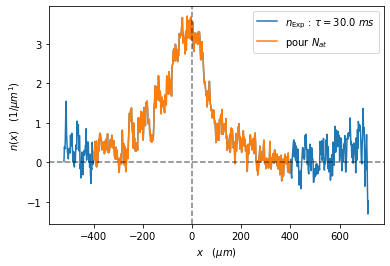

/tmp/ipykernel_1037801/279579048.py:563: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  integral_value, _ = quad(f, np.min(x), np.max(x))


nat  841.2339992352404


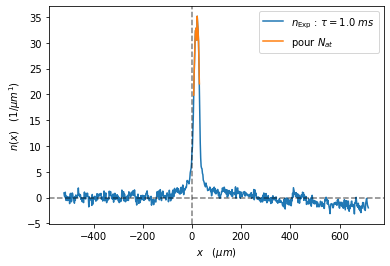

/tmp/ipykernel_1037801/279579048.py:563: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  integral_value, _ = quad(f, np.min(x), np.max(x))


nat  686.6191316317307
la
date : 2024-04-24
nom : theta_edge_1.0_ih2
triple : (64.683, 558.942, 18.339, 22.169)
time_list :  [np.float64(0.0), np.float64(1.0), np.float64(10.0), np.float64(11.0), np.float64(20.0), np.float64(21.0), np.float64(30.0)]
filename = 2024-04-24/rho_theta_edge_1.0_discr_ih2_64.683_558.942_18.339.npz
filename = 2024-04-24/rho_theta_edge_1.0_discr_moy_ih2_64.683_558.942_18.339_22.169.npz
2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_64.683_558.942_18.339_22.169_0.000.npz


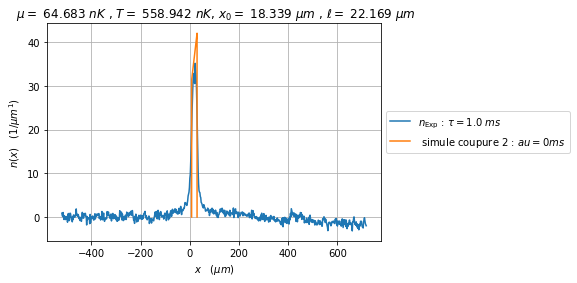

2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_64.683_558.942_18.339_22.169_1.000.npz
2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_64.683_558.942_18.339_22.169_10.000.npz
2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_64.683_558.942_18.339_22.169_11.000.npz
2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_64.683_558.942_18.339_22.169_20.000.npz
2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_64.683_558.942_18.339_22.169_21.000.npz
2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_64.683_558.942_18.339_22.169_30.000.npz


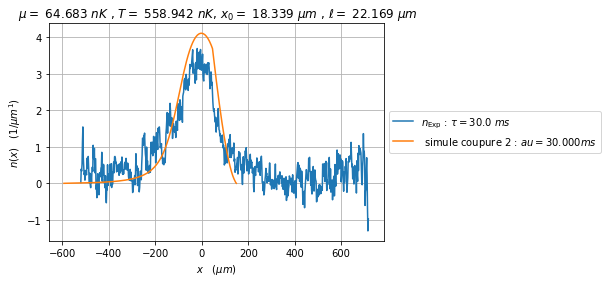

la deviation GHD est :  3.3003312518926853


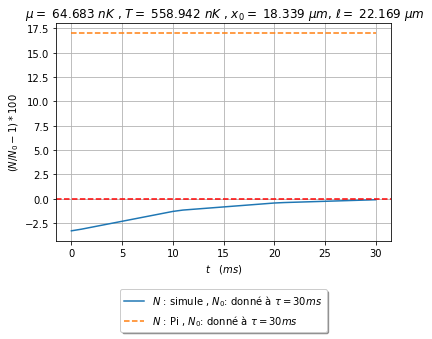

In [28]:
X , Y , label = DONNEES[3]
plt.plot ( X , Y , label = label )


if date_donnees == '2024-02-09': mask = (X > -180) & (X < 10)
elif date_donnees == '2024-02-29': mask = (X > -220) & (X < 10)
elif date_donnees == '2024-04-24': mask = (X > -110) & (X < 50)

mask = (X > -400) & (X < 400)       
  
plt.plot ( X[mask] , Y[mask] , label = "pour $N_{at}$")
plt.xlabel(r"$x \quad (\mu m)$")  # Label de l'axe des X (avec notation LaTeX)
plt.ylabel(r"$n(x) \quad (1/\mu m^1)$")  # Label de l'axe des Y (avec notation LaTeX)
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.legend()
plt.show()
Nat_1 = integrale(X[mask], Y[mask])
print ('nat ' ,  Nat_1)


#print((Nat_1-Nat_0)/Nat_0)

X , Y , label = DONNEES[2]
plt.plot ( X , Y , label = label )


if date_donnees == '2024-02-09': x0 , Taille = 18.3 , 24.2
elif date_donnees == '2024-02-29': x0 , Taille = 18.3 , 24.2
elif date_donnees == '2024-04-24': x0 , Taille = 18.3 , 24.2

mask = (X >= x0 -Taille/2)*(X<x0 + Taille/2) 

        
  
plt.plot ( X[mask] , Y[mask] , label = "pour $N_{at}$")
plt.xlabel(r"$x \quad (\mu m)$")  # Label de l'axe des X (avec notation LaTeX)
plt.ylabel(r"$n(x) \quad (1/\mu m^1)$")  # Label de l'axe des Y (avec notation LaTeX)
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
plt.legend()
plt.show()
Nat_1 = integrale(X[mask], Y[mask])
print ('nat ' ,  Nat_1)


triple = (mu_b , T_b , x0_b , Taille_b ) 


nom = "theta_edge_1.0_ih2"
index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore


def plot_Nat_1(date, nom, triple, time_list , DONNEES):
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    mu, T, x00, Taille = triple
    from scipy.signal import savgol_filter
    
    if DONNEES != None :
        Donnees=DONNEES[-2]         
        X , Y , label = Donnees
        mask = (X > -20)*(X < 60)
        Nat_donnees0 = integrale(X[mask], Y[mask])
        Donnees=DONNEES[-1]         
        X , Y , label = Donnees
        mask = (X > -400)*(X < 400)
        Nat_donnees1 = integrale(X[mask], Y[mask])
    NAT = []

    theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
    filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_{nom[index_last_underscore+1:]}_{mu_b:.3f}_{T_b:.3f}_{x0_b:.3f}.npz"
    print ( 'filename =' ,filename )
    rho_theta_star_discr = np.load(filename)
    filename = f"{date}/rho_{nom[:index_last_underscore]}_discr_moy_{nom[index_last_underscore+1:]}_{mu_b:.3f}_{T_b:.3f}_{x0_b:.3f}_{Taille_b:.3f}.npz"
    print ( 'filename =' ,filename )
    rho_theta_discr_moy = np.load(filename)
    Nat_rho = integrale(theta_discr*Temps_exp, rho_theta_star_discr/Temps_exp*Taille)
    Nat_Pi = integrale(theta_discr*Temps_exp, rho_theta_discr_moy/Temps_exp*Taille )
    for t in time_list :
        filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{x00:.3f}_{Taille:.3f}_{t:.3f}.npz"
        print(filename)
        data_s = np.load(filename) 
        x0 = data_s[0,np.argmax(data_s[1, :])]
        x0 = 0 
        X = (data_s[0, :] - x0)*Taille
        Y = data_s[1, :]
        NAT.append(integrale(X, Y))
        #NAT.append(sum(Y))
        if t == 0 :
            fig2, ax2 = plt.subplots()
            ax2.set(xlabel="$x \quad (\mu m )  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$, $x_0 =$ {x00:.3f} $\mu m$ , $\\ell =$ {Taille:.3f} $\mu m$")
            ax2.plot(DONNEES[-2][0] , DONNEES[-2][1] , label = DONNEES[-2][2])
            ax2.plot(X ,Y , label = " simule coupure 2 : $\tau = 0 ms$ ")
            plt.grid(True)
            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
            plt.show()
        if t >= max(time_list) :
            fig2, ax2 = plt.subplots()
            ax2.set(xlabel="$x \quad (\mu m )  $", ylabel="$n(x) \quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$, $x_0 =$ {x00:.3f} $\mu m$ , $\\ell =$ {Taille:.3f} $\mu m$")
            ax2.plot(DONNEES[-1][0] , DONNEES[-1][1] , label = DONNEES[-1][2])
            ax2.plot(X ,Y , label = f" simule coupure 2 : $\tau = {t:.3f} ms$ ")
            plt.grid(True)
            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
            plt.show()
    fig, ax1 = plt.subplots()
    ax1.set(xlabel="$t \quad (ms)  $", ylabel="$(N/N_{0}-1)*100$", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $x_0 =$ {x00:.3f} $\mu m$, $\\ell =$ {Taille:.3f} $\mu m$")
    #ax1.plot(time_list , (np.array(NAT)/NAT[0]-1)*100 , label = "$N$ : simule , $N_{0}$: pour simul à $\\tau = 0 ms$ ")
    print("la deviation GHD est : ",(NAT[-1]/NAT[0]-1)*100 )
    if DONNEES != None : 
        #ax1.plot(time_list , (np.array(NAT)/Nat_donnees0-1)*100 , label = "$N$ : simule , $N_{0}$: donné à $\\tau = 1 ms$ ")
        ax1.plot(time_list , (np.array(NAT)/Nat_donnees1-1)*100 , label = f"$N$ : simule , $N_{0}$: donné à $\\tau = {Temps_exp} ms$ ")
        #ax1.plot([1 , max(time_list)], (np.array([1 , Nat_donnees1/Nat_donnees0])-1)*100 , label = "$N$ : donnees , $N_{0}$: donné à $\\tau = 1 ms$ ")
        #ax1.plot([0 , max(time_list)], (np.array([Nat_rho/Nat_donnees0]*2)-1)*100 , linestyle='dashed' , label = "$N$ : rho , $N_{0}$: donné à $\\tau = 1 ms$ ")
        #ax1.plot([0 , max(time_list)], (np.array([Nat_rho/Nat_donnees1]*2)-1)*100 , linestyle='dashed' , label = f"$N$ : rho , $N_{0}$: donné à $\\tau = {Temps_exp} ms$ ")
        #ax1.plot([0 , max(time_list)], (np.array([Nat_Pi/Nat_donnees0]*2)-1)*100 , linestyle='dashed' , label = "$N$ : Pi , $N_{0}$: donné à $\\tau = 1 ms$ ")
        ax1.plot([0 , max(time_list)], (np.array([Nat_Pi/Nat_donnees1]*2)-1)*100 , linestyle='dashed' , label = f"$N$ : Pi , $N_{0}$: donné à $\\tau = {Temps_exp} ms$ ")
        ax1.axhline(y=(NAT[0]/NAT[0]-1)*100, color='r', linestyle='--')
    plt.grid(True)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
    plt.show()

#for triple , liste_t in triples.items():
for triple , liste_t in {triple : extract_t_times_Taille(date, nom, triple)}.items():
    time_list = [max(liste_t)]
    time_list = sorted(list(liste_t))[0:]
    mask = (np.array(list(liste_t))< 2000)*(np.array(list(liste_t))>= 0)
    time_list = sorted(np.array(list(liste_t))[mask])
    print ( "la")
    
    
    print ('date :' , date)
    print ('nom :' , nom)
    print ('triple :' , triple) 
    print ('time_list : ' , time_list)
    #print ('DONNEES :' , DONNEES)
    if len(time_list) != 0 : plot_Nat_1(date, nom, triple, time_list , DONNEES)



filename = 2024-04-24/theta_discr_ih2.npz
filename = 2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_64.554_557.000_24.780_30.000.npz
filename = 2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_64.554_557.000_24.780_30.000.npz
filename = 2024-04-24/rho_theta_edge_1.0_discr_ih2_64.554_557.000.npz
filename = 2024-04-24/theta_discr_ih2.npz
filename = 2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_63.810_608.954_24.780_30.000.npz
filename = 2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_63.810_608.954_24.780_30.000.npz
filename = 2024-04-24/rho_theta_edge_1.0_discr_ih2_63.810_608.954.npz
filename = 2024-04-24/theta_discr_ih2.npz
filename = 2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_56.869_889.057_24.780_30.000.npz
filename = 2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_56.869_889.057_24.780_30.000.npz
filename = 2024-04-24/rho_theta_edge_1.0_discr_ih2_56.869_889.057.npz
filename = 2024-04-24/theta_discr_ih2.npz
filename = 2024-04-24/density_expansion_nu_theta_edg

/tmp/ipykernel_2680011/3458080931.py:209: RuntimeWarning: divide by zero encountered in divide
  chi_square = np.sum(((observed_y - interpolated_simulated_y)**2 / interpolated_simulated_y)[mask])


filename = 2024-04-24/rho_theta_edge_1.0_discr_ih2_63.811_608.947.npz
filename = 2024-04-24/theta_discr_ih2.npz
filename = 2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_56.869_889.051_24.780_30.000.npz
filename = 2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_56.869_889.051_24.780_30.000.npz
filename = 2024-04-24/rho_theta_edge_1.0_discr_ih2_56.869_889.051.npz
filename = 2024-04-24/theta_discr_ih2.npz
filename = 2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_63.811_608.950_24.780_30.000.npz
filename = 2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_63.811_608.950_24.780_30.000.npz
filename = 2024-04-24/rho_theta_edge_1.0_discr_ih2_63.811_608.950.npz
filename = 2024-04-24/theta_discr_ih2.npz
filename = 2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_64.553_557.003_24.780_30.000.npz
filename = 2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_64.553_557.003_24.780_30.000.npz
filename = 2024-04-24/rho_theta_edge_1.0_discr_ih2_64.553_557.003.npz
filename = 2024-04-24/th

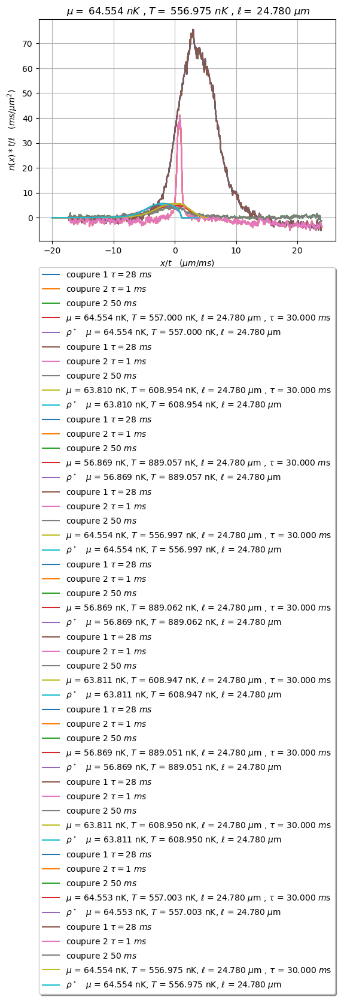

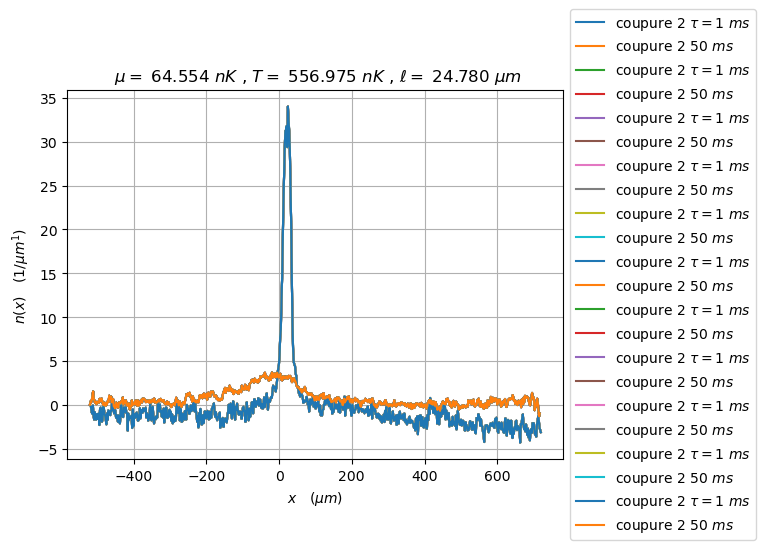

/tmp/ipykernel_2680011/3458080931.py:344: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  integral_value, _ = quad(f, np.min(x), np.max(x))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


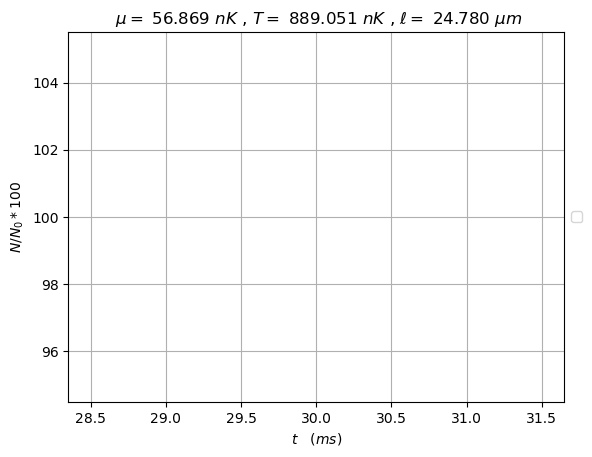

Clé avec la valeur minimale: (56.869, 889.051, 24.78)
filename = 2024-04-24/theta_discr_ih2.npz
filename = 2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_56.869_889.051_24.780_30.000.npz
filename = 2024-04-24/density_expansion_nu_theta_edge_1.0_ih2_56.869_889.051_24.780_30.000.npz
filename = 2024-04-24/rho_theta_edge_1.0_discr_ih2_56.869_889.051.npz


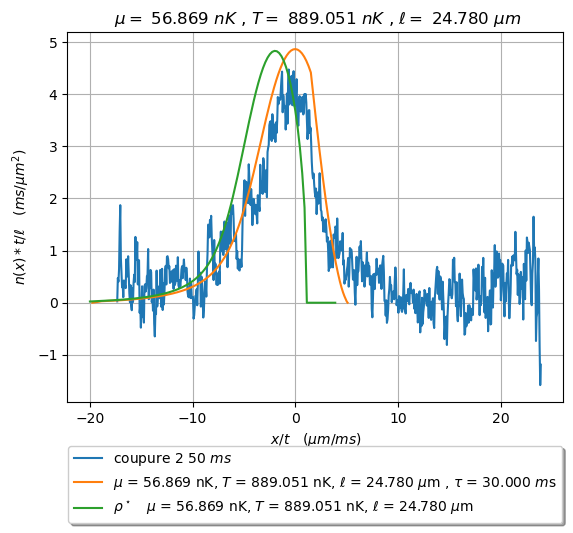

In [35]:
'dummy'fig, ax1 = plt.subplots()
chi2 = {}
for triple , liste_t in triples.items():
    time_list = [max(liste_t)]
    time_list = sorted(list(liste_t))[-10:]
    mask = (np.array(list(liste_t))< 32)*(np.array(list(liste_t))> 29)
    time_list = sorted(np.array(list(liste_t))[mask])
    if len(time_list) != 0 : chi2[triple] = plot_graph2(date, nom, triple, time_list , DONNEES , 1)
plt.grid(True)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)
plt.show()

fig, ax1 = plt.subplots()
for triple , liste_t in triples.items():
    time_list = [max(liste_t)]
    time_list = sorted(list(liste_t))[-10:]
    mask = ((np.array(list(liste_t))< 32)*(np.array(list(liste_t))> 29))+(np.array(list(liste_t))==0)
    mask = (np.array(list(liste_t)) == 1) #+ (np.array(list(liste_t)) == 30)
    time_list = sorted(np.array(list(liste_t))[mask])
    plot_graph3(date, nom, triple, time_list , DONNEES)
#plt.xlim([])
plt.grid(True)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
plt.show()




# Trouver la clé avec la valeur minimale
triple = min(chi2, key=chi2.get)

#for triple , liste_t in triples.items():
for triple , liste_t in {triple : extract_t_times_Taille(date, nom, triple)}.items():
    time_list = [max(liste_t)]
    time_list = sorted(list(liste_t))[0:]
    mask = (np.array(list(liste_t))< 2000)*(np.array(list(liste_t))> 0)
    time_list = sorted(np.array(list(liste_t))[mask])
    if len(time_list) != 0 : plot_Nat(date, nom, triple, time_list , DONNEES)
        
# Afficher la clé avec la valeur minimale
print("Clé avec la valeur minimale:", triple)
fig, ax1 = plt.subplots()
liste_t = extract_t_times_Taille(date, nom, triple)
liste_t = triples[triple]
time_list = [max(liste_t)]
time_list = sorted(list(liste_t))[:]
mask = (np.array(list(liste_t))< 32)*(np.array(list(liste_t))> 29)
time_list = sorted(np.array(list(liste_t))[mask])
plot_graph2(date, nom, triple, time_list , DONNEES)
plt.grid(True)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)
plt.show()

# On compare le cas homogène et non homogène 

In [142]:


def elements_communs(dict1, dict2):
    # Créer un nouveau dictionnaire pour stocker les éléments communs
    commun_dict = {}
    
    # Parcourir les clés et les valeurs du premier dictionnaire
    for key, value in dict1.items():
        # Vérifier si la clé existe dans le deuxième dictionnaire
        if key in dict2:
            # Si la clé existe dans les deux dictionnaires, l'ajouter au dictionnaire commun
            commun_dict[key] = value & dict2[key]
    
    return commun_dict


date = "2024-02-18"
nom_h = "theta_star_1.0_h"
nom_ih = "theta_edge_1.0_ih2"

mup = None
T = 300
Taille = None

triples_h = extract_triples(date, nom_h, mup, T, Taille)
print("Triples possibles homo:", triples_h)
triples_ih = extract_triples(date, nom_ih, mup, T, Taille)
print("Triples possibles inomo:", triples_ih)
triples = elements_communs(triples_h, triples_ih)
print("Triples possibles:", triples)

for triple , liste_t in triples.items():
    
    mu, T, Taille = triple
    time_list = list(liste_t)
    time_list = sorted(time_list)
    print (time_list)
    # Charger les données
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    # Créer un graphique pour la densité multipliée par le temps en fonction de la position/temps
    theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
    
    #fig, ax1 = plt.subplots()
    #ax1.set(xlabel="$x/t\quad (\mu m / ms ) $", ylabel="$n(x)*t/\ell\quad ( ms/\mu m^2 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$")
      
         
    for t in time_list:
        fig, ax1 = plt.subplots()
        ax1.set(xlabel="$x/t\quad (\mu m / ms ) $", ylabel="$n(x)*t/\ell\quad ( ms/\mu m^2 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$")
    
        filename = f"{date}/density_expansion_nu_{nom_h}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz"
        data_h = np.load(filename) 
        x0 = data_h[0,np.argmax(data_h[1, :])]
        X_h = data_h[0, :] #- x0
        Y_h = data_h[1, :]
        filename = f"{date}/density_expansion_nu_{nom_ih}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz"
        data_ih = np.load(filename) 
        x0 = data_ih[0,np.argmax(data_ih[1, :])]
        X_ih = data_ih[0, :] #- x0
        Y_ih = data_ih[1, :]
        ax1.plot(X_h/t*Taille, Y_h*t/Taille, label=f"h $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
        ax1.plot(X_ih/t*Taille, Y_ih*t/Taille, label=f"inh $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
        plt.grid(True)
        #plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
        plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

        plt.show()
        
        fig, ax1 = plt.subplots()
        
        X , Y , label = Donnees
        #ax1.plot((X-x0)/t, Y*t/Taille, label=label + ' t : ' + str (t))
        if date_donnees == '2024-02-09':
            print ( 'yes')
            x0 = 76.25 -6.82
        else :
            x0 = X[np.argmax(Y)]
        ax1.plot((X-x0), Y, label=label)  
        
        ax1.set(xlabel="$x\quad (\mu m ) $", ylabel="$n(x)\quad ( 1/\mu m ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$")
    
        ax1.plot(X_h*Taille, Y_h,'k'  , label=f"h : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
        ax1.plot(X_ih*Taille, Y_ih,'r' ,label=f"inh : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
        plt.grid(True)
        #plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
        #plt.legend()  # Placer la légende à droite du graphique
        plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

        plt.show()
    
    

FileNotFoundError: [Errno 2] No such file or directory: '2024-02-18'

# avec differente temperature 

In [141]:


def elements_communs(dict1, dict2):
    # Créer un nouveau dictionnaire pour stocker les éléments communs
    commun_dict = {}
    
    # Parcourir les clés et les valeurs du premier dictionnaire
    for key, value in dict1.items():
        # Vérifier si la clé existe dans le deuxième dictionnaire
        if key in dict2:
            # Si la clé existe dans les deux dictionnaires, l'ajouter au dictionnaire commun
            commun_dict[key] = value & dict2[key]
    
    return commun_dict


date = "2024-02-18"
date = "ultime"
nom_h = "theta_star_1.0_h"
nom_ih = "theta_edge_1.0_ih2"
nom_h = nom_ih

mup = None
T = None
Taille = None

triples_h = extract_triples(date, nom_h, mup, T, Taille)
print("Triples possibles homo:", triples_h)
triples_ih = extract_triples(date, nom_ih, mup, T, Taille)
print("Triples possibles inomo:", triples_ih)
triples = elements_communs(triples_h, triples_ih)
print("Triples possibles:", triples)
fig, ax1 = plt.subplots()

X , Y , label = Donnees
#ax1.plot((X-x0)/t, Y*t/Taille, label=label + ' t : ' + str (t))
if date_donnees == '2024-02-09':
    print ( 'yes')
    x0 = 76.25 -6.82
else :
    x0 = X[np.argmax(Y)]
ax1.plot((X-x0), Y, label=label)  
for triple , liste_t in triples.items():
    
    mu, T, Taille = triple
    time_list = list(liste_t)
    time_list = [max(sorted(time_list))]
    print (time_list)
    # Charger les données
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    # Créer un graphique pour la densité multipliée par le temps en fonction de la position/temps
    theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
    
    #fig, ax1 = plt.subplots()
    #ax1.set(xlabel="$x/t\quad (\mu m / ms ) $", ylabel="$n(x)*t/\ell\quad ( ms/\mu m^2 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$")
      
         
    for t in time_list:
        
        
        
        
        ax1.set(xlabel="$x\quad (\mu m ) $", ylabel="$n(x)\quad ( 1/\mu m ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$")
        
        filename = f"{date}/density_expansion_nu_{nom_h}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz"
        data_h = np.load(filename) 
        x0 = data_h[0,np.argmax(data_h[1, :])]
        X_h = data_h[0, :] #- x0
        Y_h = data_h[1, :]
        
        filename = f"{date}/density_expansion_nu_{nom_ih}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz"
        data_ih = np.load(filename) 
        x0 = data_ih[0,np.argmax(data_ih[1, :])]
        X_ih = data_ih[0, :] #- x0
        Y_ih = data_ih[1, :]
        
        ax1.plot(X_h*Taille, Y_h,'k'  , label=f"h : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
        ax1.plot(X_ih*Taille, Y_ih,'r' ,label=f"inh : $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
plt.grid(True)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
#plt.legend()  # Placer la légende à droite du graphique
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

plt.show()
    
    

Triples possibles homo: {(50.133, 266.667, 58.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0, 51.0, 100.0, 101.0, 200.0, 201.0, 300.0, 301.0], (49.082, 500.0, 58.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0], (49.422, 211.111, 58.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0, 51.0, 100.0, 101.0, 200.0, 201.0, 300.0, 301.0, 400.0, 401.0, 500.0], (47.517, 100.0, 58.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0, 51.0, 100.0, 101.0, 200.0, 201.0, 300.0, 301.0, 400.0, 401.0, 500.0], (35.317, 900.0, 58.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0], (48.462, 155.556, 58.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0, 51.0, 100.

TypeError: unsupported operand type(s) for &: 'list' and 'list'

Triples possibles homo: {(50.133, 266.667, 58.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0, 51.0, 100.0, 101.0, 200.0, 201.0, 300.0, 301.0], (49.082, 500.0, 58.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0], (49.422, 211.111, 58.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0, 51.0, 100.0, 101.0, 200.0, 201.0, 300.0, 301.0, 400.0, 401.0, 500.0], (47.517, 100.0, 58.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0, 51.0, 100.0, 101.0, 200.0, 201.0, 300.0, 301.0, 400.0, 401.0, 500.0], (35.317, 900.0, 58.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0], (48.462, 155.556, 58.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0, 51.0, 100.

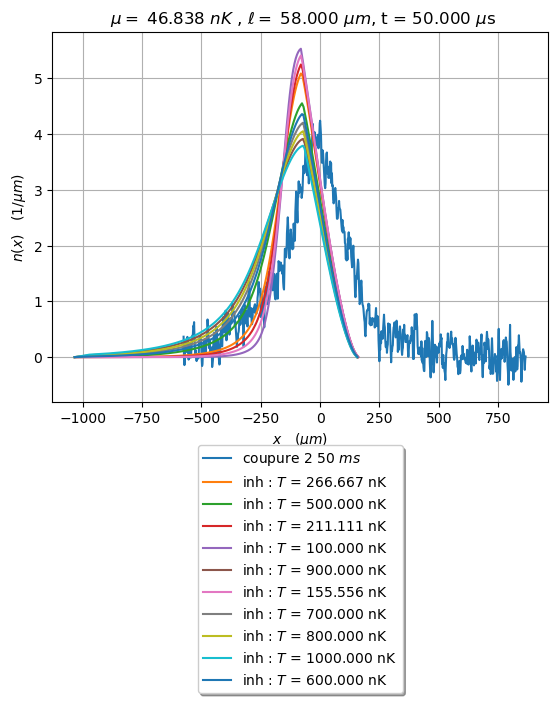

In [148]:



date = "2024-02-18"
date = 'ultime'
nom_h = "theta_star_1.0_h"
nom_ih = "theta_edge_1.0_ih2"
nom_h = nom_ih

mup = None
T = None
Taille = None

triples_ih = extract_triples(date, nom_ih, mup, T, Taille)
print("Triples possibles homo:", triples_h)
triples = triples_ih
fig, ax1 = plt.subplots()
X , Y , label = Donnees
#ax1.plot((X-x0)/t, Y*t/Taille, label=label + ' t : ' + str (t))
if date_donnees == '2024-02-09':
    print ( 'yes')
    x0 = 76.25 -6.82
else :
    x0 = X[np.argmax(Y)]
ax1.plot((X-x0), Y, label=label)  
for triple , liste_t in triples.items():
    
    mu, T, Taille = triple
    time_list = list(liste_t)
    mask = (np.array(list(liste_t))< 51)*(np.array(list(liste_t))> 49)
    time_list = sorted(np.array(list(liste_t))[mask])
    #time_list = [max(sorted(time_list))]
    print (time_list)
    # Charger les données
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    # Créer un graphique pour la densité multipliée par le temps en fonction de la position/temps
    theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
            
    for t in time_list:
        
        ax1.set(xlabel="$x\quad (\mu m ) $", ylabel="$n(x)\quad ( 1/\mu m ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$, t = {t:.3f} $\\mu$s")
        
        filename = f"{date}/density_expansion_nu_{nom_h}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz"
        data_h = np.load(filename) 
        x0 = data_h[0,np.argmax(data_h[1, :])]
        X_h = data_h[0, :] - 5/Taille 
        Y_h = data_h[1, :]
        
        filename = f"{date}/density_expansion_nu_{nom_ih}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz"
        data_ih = np.load(filename) 
        x0 = data_ih[0,np.argmax(data_ih[1, :])]
        X_ih = data_ih[0, :] - 5/Taille
        Y_ih = data_ih[1, :]
        
        homo = 1 == 0 
        if homo :
            ax1.plot(X_h*Taille, Y_h , label=f"h : $T$ = {T:.3f} nK ")
        else :
            ax1.plot(X_ih*Taille, Y_ih,label=f"inh : $T$ = {T:.3f} nK ")
plt.grid(True)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
#plt.legend()  # Placer la légende à droite du graphique
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

plt.show()
    
    

In [4]:
date = "ultime"
nom_1 = "theta_edge_0.1_ih2"
nom_2 = "theta_edge_1.0_ih2"

mup = None
T = None
Taille = None

triples_1 = extract_triples(date, nom_1, mup, T, Taille)
print("Triples possibles:", triples_1)
triples_2 = extract_triples(date, nom_2, mup, T, Taille)
print("Triples possibles inomo:", triples_2)
triples = elements_communs(triples_1, triples_2)
print("Triples possibles:", triples)

for triple , liste_t in triples.items():
    
    mu, T, Taille = triple
    time_list = list(liste_t)
    time_list = sorted(time_list)
    print (time_list)
    # Charger les données
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    # Créer un graphique pour la densité multipliée par le temps en fonction de la position/temps
    #theta_discr = np.load(f"{date}/theta_discr_{nom_1[index_last_underscore+1:]}.npz")
    
    #fig, ax1 = plt.subplots()
    #ax1.set(xlabel="$x/t\quad (\mu m / ms ) $", ylabel="$n(x)*t/\ell\quad ( ms/\mu m^2 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$")
    
    for t in time_list:
        fig, ax1 = plt.subplots()
        ax1.set(xlabel="$x/t\quad (\mu m / ms ) $", ylabel="$n(x)*t/\ell\quad ( ms/\mu m^2 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$")
    
        filename = f"{date}/density_expansion_nu_{nom_1}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz"
        data_h = np.load(filename) 
        x0 = data_h[0,np.argmax(data_h[1, :])]
        X_h = data_h[0, :] #- x0
        Y_h = data_h[1, :]
        filename = f"{date}/density_expansion_nu_{nom_2}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz"
        data_ih = np.load(filename) 
        x0 = data_ih[0,np.argmax(data_ih[1, :])]
        X_ih = data_ih[0, :] #- x0
        Y_ih = data_ih[1, :]
        ax1.plot(X_h/t*Taille, Y_h*t/Taille, label=f"dt = 0.1 ms, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
        ax1.plot(X_ih/t*Taille, Y_ih*t/Taille, label=f"dt = 1.0 ms, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
        plt.grid(True)
        #plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
        plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

        plt.show()
        
        fig, ax1 = plt.subplots()
        ax1.set(xlabel="$x\quad (\mu m ) $", ylabel="$n(x)\quad ( 1/\mu m ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$")
    
        ax1.plot(X_h*Taille, Y_h, label=f"dt = 0.1 ms, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
        ax1.plot(X_ih*Taille, Y_ih, label=f"dt = 1.0 ms, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
        plt.grid(True)
        #plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
        plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

        plt.show()
        
    fig, ax1 = plt.subplots()
    ax1.set(xlabel="$x/t\quad (\mu m / ms ) $", ylabel="$n(x)*t/\ell\quad ( ms/\mu m^2 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$")
    
    #t1 = max(list(triples_1[triple]))
    #filename = f"{date}/density_expansion_nu_{nom_1}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t1:.3f}.npz"
    #data_h = np.load(filename) 
    #x0 = data_h[0,np.argmax(data_h[1, :])]
    #X_h = data_h[0, :] #- x0
    #Y_h = data_h[1, :]
    t2 = max(list(triples_2[triple]))
    filename = f"{date}/density_expansion_nu_{nom_2}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t2:.3f}.npz"
    data_ih = np.load(filename) 
    x0 = data_ih[0,np.argmax(data_ih[1, :])]
    X_ih = data_ih[0, :] #- x0
    Y_ih = data_ih[1, :]
    ax1.plot(X_h/t*Taille, Y_h*t/Taille, label=f"dt = 0.1 ms $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t1:.3f} $\\mu$s")
    ax1.plot(X_ih/t*Taille, Y_ih*t/Taille, label=f"dt = 1.0 ms, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t2:.3f} $\\mu$s")
    plt.grid(True)
    #plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

    plt.show()

    fig, ax1 = plt.subplots()
    ax1.set(xlabel="$x\quad (\mu m ) $", ylabel="$n(x)\quad ( 1/\mu m ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$")

    ax1.plot(X_h*Taille, Y_h, label=f"dt = 0.1 ms, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t1:.3f} $\\mu$s")
    ax1.plot(X_ih*Taille, Y_ih, label=f"dt = 1.0 ms, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t2:.3f} $\\mu$s")
    plt.grid(True)
    #plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

    plt.show()
        
    plot_Nat(date, nom_1, triple, sorted(list(triples_1[triple])) , DONNEES)
    plot_Nat(date, nom_2, triple, sorted(list(triples_2[triple])) , DONNEES)
    

Triples possibles: {}
Triples possibles inomo: {(36.336, 878.698, 54.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0, 51.0], (39.411, 810.429, 54.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0, 51.0], (50.133, 266.667, 58.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0, 51.0, 100.0, 101.0, 200.0, 201.0, 300.0, 301.0], (42.117, 743.784, 54.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0, 51.0], (35.317, 900.0, 54.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0, 51.0], (49.082, 500.0, 58.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 30.0, 31.0, 40.0, 41.0, 50.0], (39.149, 816.5, 54.0): [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 20.0, 21.0, 

NameError: name 'elements_communs' is not defined

# DEFORMATION DE BORD

In [14]:
date = "test"#"PourIsa"#"ultime"
#date = "ultime"
nom = "theta_edge_1.0_ih1"

mup = 42.616
T = None
Taille = 54

triples = extract_triples(date, nom, mup, T, Taille)
#triples = {(mup,T,Taille):{1,2}}
print("Triples possibles:", triples.keys())


import os

def verifier_et_creer_repertoire(nom_repertoire):
    # Vérifier si le répertoire existe
    if not os.path.exists(nom_repertoire):
        # Créer le répertoire s'il n'existe pas
        os.makedirs(nom_repertoire)
        print(f"Le répertoire '{nom_repertoire}' a été créé avec succès.")
    else:
        print(f"Le répertoire '{nom_repertoire}' existe déjà.")


for triple , liste_t in triples.items():
    
    mu, T, Taille = triple
    time_list = list(liste_t)
    time_list = sorted(time_list)
    print (time_list)
    # Charger les données
    index_last_underscore = nom.rfind('_')  # Trouver l'index du dernier underscore
    # Créer un graphique pour la densité multipliée par le temps en fonction de la position/temps
    #theta_discr = np.load(f"{date}/theta_discr_{nom_1[index_last_underscore+1:]}.npz")
    
    #fig, ax1 = plt.subplots()
    #ax1.set(xlabel="$x/t\quad (\mu m / ms ) $", ylabel="$n(x)*t/\ell\quad ( ms/\mu m^2 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$")
    fig, ax1 = plt.subplots()
    ax1.set(xlabel="$x/t\quad (\mu m / ms ) $", ylabel="$n(x)\quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$")
    
    for t in time_list[1:2]:
        
        filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz"
        theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
        #nu_discr = np.load(f"{date}/nu_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}.npz")
        
        print ("filename" ,filename)        
        data = np.load(filename) 
        
        dossier_Isa = 'Andrew'
        verifier_et_creer_repertoire(dossier_Isa)
        #np.savez(f"{dossier_Isa}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz", [data[0,:]*Taille/t,data[1,:]])
        #np.savez(f"{dossier_Isa}/nu_{mu:.3f}_{T:.3f}.npz", [theta_discr , nu_discr])
        #print ("data" ,  data)
        
        #x0 = data[0,np.argmax(data[1, :])]
        X = data[0, :] #- x0
        Y = data[1, :]
        ax1.plot(X/t*Taille, Y, label=f"dt = 1.0 ms, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
        ax1.plot(X/t*Taille, Y, label=f"dt = 1.0 ms, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
    
    dossier_Isa = 'Andrew'
    verifier_et_creer_repertoire(dossier_Isa)
    
    
    theta_discr = np.load(f"{date}/theta_discr_{nom[index_last_underscore+1:]}.npz")
    nu_discr = np.load(f"{date}/nu_discr_{nom[index_last_underscore+1:]}_{mu:.3f}_{T:.3f}.npz")
    
    t = 1 
    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz"        
    print ("filename" ,filename)        
    data = np.load(filename) 
      
    np.savez(f"{dossier_Isa}/density_bord_{mu:.3f}_{T:.3f}.npz", [data[0,:]*Taille/t,data[1,:]])
    np.savez(f"{dossier_Isa}/nu_{mu:.3f}_{T:.3f}.npz", [theta_discr , nu_discr])
    #print ("data" ,  data)
    
    #x0 = data[0,np.argmax(data[1, :])]
    X_b = data[0, :] #- x0
    Y_b = data[1, :]
    
    ax1.plot(X_b/t*Taille, Y_b, label=f"dt = 1.0 ms, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
    plt.show()
    
    
    fig, ax1 = plt.subplots()
    ax1.set(xlabel="$x/t\quad (\mu m / ms ) $", ylabel="$n(x)\quad ( 1/\mu m^1 ) $", title=f" $\\mu = $ {mu:.3f} $nK$ , $T =$ {T:.3f} $nK$ , $\\ell =$ {Taille:.3f} $\mu m$")
    ax1.plot(X_b*Taille, Y_b, label=f"dt = 1.0 ms, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
  
    
    t = 0 
    nom = "theta_edge_1.0_ih2"
    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz"        
    print ("filename" ,filename)        
    data = np.load(filename) 
      
    np.savez(f"{dossier_Isa}/density_expansion_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz", [data[0,:]*Taille,data[1,:]])
    #np.savez(f"{dossier_Isa}/nu_{mu:.3f}_{T:.3f}.npz", [theta_discr , nu_discr])
    #print ("data" ,  data)
    
    #x0 = data[0,np.argmax(data[1, :])]
    X = data[0, :] #- x0
    Y= data[1, :]
    ax1.plot(X*Taille, Y, label=f"dt = 1.0 ms, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
    t = 50 
    
    
    nom = "theta_edge_1.0_ih2"
    filename = f"{date}/density_expansion_nu_{nom}_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz"        
    print ("filename" ,filename)        
    data = np.load(filename) 
      
    np.savez(f"{dossier_Isa}/density_expansion_{mu:.3f}_{T:.3f}_{Taille:.3f}_{t:.3f}.npz", [data[0,:]*Taille,data[1,:]])
    X = data[0, :] #- x0
    Y= data[1, :]
    ax1.plot(X*Taille, Y, label=f"dt = 1.0 ms, $\\mu$ = {mu:.3f} nK, $T$ = {T:.3f} nK, $\\ell$ = {Taille:.3f} $\\mu$m , t = {t:.3f} $\\mu$s")
    
    
    
    plt.grid(True)
    #plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Placer la légende à droite du graphique
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

    plt.show()

 
        
    #plot_Nat(date, nom, triple, sorted(list(triples[triple])) , DONNEES)


FileNotFoundError: [Errno 2] No such file or directory: 'test'

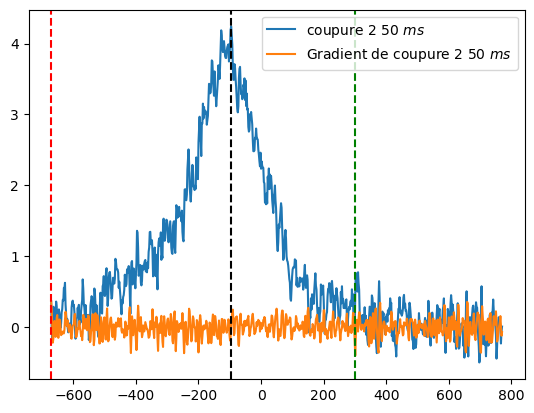

Taille bord 971.73


ValueError: cannot reshape array of size 0 into shape (0,newaxis)

In [35]:
import matplotlib.pyplot as plt
import numpy as np

X, Y, label = DONNEES[3]  # Assurez-vous que DONNEES contient les données nécessaires

plt.plot(X, Y, label=label)
plt.plot(X, np.gradient(Y), label='Gradient de ' + label)  # Ajout du label pour le gradient
plt.axvline(x=X[np.argmax(np.gradient(Y))], color='r', linestyle='--')  # Utilisation de plt.axvline pour la ligne verticale
plt.axvline(x=X[np.argmin(np.gradient(Y))], color='g', linestyle='--')  # Utilisation de plt.axvline pour la ligne verticale
plt.axvline(x=X[np.argmax(Y)], color='k', linestyle='--')  # Utilisation de plt.axvline pour la ligne verticale
plt.legend()
plt.show()

bord_gauche = X[np.argmax(np.gradient(Y))]
bord_droite = X[np.argmin(np.gradient(Y))]
Taille_exp = bord_droite - bord_gauche 
print ("Taille bord" , Taille_exp)
integrale(X[np.argmax(np.gradient(Y)) : np.argmin(np.gradient(Y))], Y[np.argmax(np.gradient(Y)) : np.argmin(np.gradient(Y))])

print ( 'nombre dat ' , sum(Y[np.argmax(np.gradient(Y)) : np.argmin(np.gradient(Y)) ]))

print ((X[np.argmax(np.gradient(Y))] + X[np.argmin(np.gradient(Y))])/2)



[-5.58742356 10.         51.32192839]


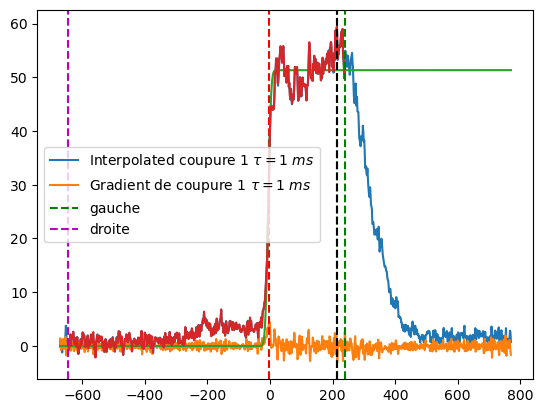

Différence entre les points d'extrémité du gradient interpolé : 216.33333333333337
-1.588888888888846


In [112]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d
from scipy import special

X, Y, label = DONNEES[0]  # Assurez-vous que DONNEES contient les données nécessaires

# Créer une fonction d'interpolation
interpolated_function = interp1d(X, Y, kind='cubic')

# Générer de nouveaux points X pour une meilleure résolution du tracé
new_X = np.linspace(min(X), max(X), 1000)

# Calculer les valeurs interpolées correspondantes
interpolated_Y = interpolated_function(new_X)

# Tracer les données interpolées
plt.plot(new_X, interpolated_Y, label='Interpolated ' + label)

# Calculer le gradient des données interpolées
gradient_Y = np.gradient(interpolated_Y)

# Tracer le gradient
plt.plot(new_X, gradient_Y, label='Gradient de ' + label)

# Trouver les points d'extrémité du gradient
max_gradient_index = np.argmax(gradient_Y)
min_gradient_index = np.argmin(gradient_Y)

# Ajouter des lignes verticales aux points d'extrémité du gradient
plt.axvline(x=new_X[max_gradient_index], color='r', linestyle='--')
plt.axvline(x=new_X[min_gradient_index], color='g', linestyle='--')

# Trouver les points d'extrémité des données originales
max_Y_index = np.argmax(Y)
min_Y_index = np.argmin(Y)

def model(x , x0 , sigma , A ): return  0.5*A*( 1 +special.erf((x-x0)/sigma))
p0 = np.array([1 ,1 ,50 ])
bounds=(-3/2*p0, 3/2*p0)
bounds=([-10 ,1 ,40 ], [10 ,10 ,100 ])
from scipy.optimize import curve_fit
g,d = 300 , 800
popt, pcov = curve_fit(model, X[g : d] , Y[g : d] ,p0 = p0 ,bounds =bounds )
print ( popt)

plt.plot(X, model(X ,*popt))
plt.plot(X[g : d], Y[g : d])
plt.axvline(x=X[g], color='g', linestyle='--' , label = 'gauche')
plt.axvline(x=X[d], color='m', linestyle='--' , label = 'droite')


# Ajouter des lignes verticales aux points d'extrémité des données originales
plt.axvline(x=X[max_Y_index], color='k', linestyle='--')

plt.legend()
plt.show()

# Calcul de la différence entre les points d'extrémité du gradient interpolé
difference = new_X[min_gradient_index] - new_X[max_gradient_index]
print("Différence entre les points d'extrémité du gradient interpolé :", difference)

print ( new_X[max_gradient_index])


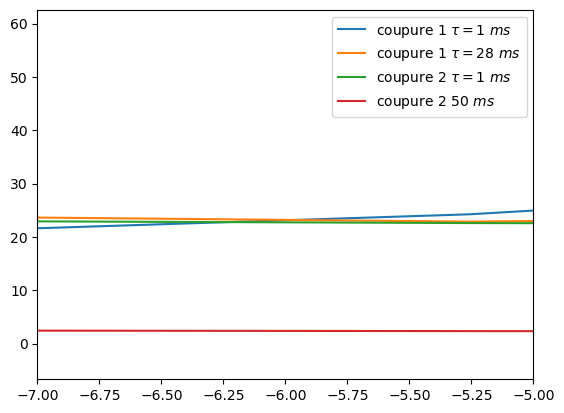

In [73]:
for X, Y, label in DONNEES:
    plt.plot(X,Y,label=label)
plt.legend()
plt.xlim([-7 ,-5])
plt.show()